In [1]:
import csv
import gzip
import math
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.patches as patches

from collections import Counter, defaultdict

### Const

In [2]:
gen_type_strings = ['gene','exon','CDS','transcript','three_prime_utr','five_prime_utr','start_codon','stop_codon']
reg_type_strings = ['promoter','enhancer','CTCF_binding_site','open_chromatin_region']

chrom_lengh={'1': 248956422,
 '2': 242193529,
 '3': 198295559,
 '4': 190214555,
 '5': 181538259,
 '6': 170805979,
 '7': 159345973,
 '8': 145138636,
 '9': 138394717,
 '10': 133797422,
 '11': 135086622,
 '12': 133275309,
 '13': 114364328,
 '14': 107043718,
 '15': 101991189,
 '16': 90338345,
 '17': 83257441,
 '18': 80373285,
 '19': 58617616,
 '20': 64444167,
 '21': 46709983,
 '22': 50818468,
 'X': 156040895,
 'Y': 57227415}

chrom='1'

### Load Pathogenicity file to pathogenicity_df

In [3]:
import pandas as pd

def load_pathogenicity_file(datafile, y):
    df=pd.read_csv(datafile, delimiter='\t')
    columns_to_keep=['CHROM','POS','Pathogenicity'] # 'ID','REF','ALT',
    df = df[columns_to_keep]
    df = df[(df["Pathogenicity"]=="P") & (df["CHROM"]==1)]

    for i in range(1,23):
        df.loc[df['CHROM']==i,'CHROM']=str(i)
    df=df[~df['CHROM'].isna()]
    df = df[~df['CHROM'].str.contains('KI')]
    df = df[~df['CHROM'].str.contains('GL')]

    df = df.drop(['Pathogenicity'], axis=1)
    df['TYPE']=y
    return df

path_base='/home/sunhuaikuan/ondemand/blue_papers/DNA_LLM_REVIEW/datasets/task04-pathogenicity/'

pathogenecity_type='missense'
datafile = path_base + 'clinvar_20240805.'+pathogenecity_type+'_matched.txt'
missense_df = load_pathogenicity_file(datafile, 1)
missense_df

pathogenecity_type='noncoding'
datafile = path_base + 'clinvar_20240805.'+pathogenecity_type+'.txt'
noncoding_df = load_pathogenicity_file(datafile, 0)
noncoding_df


pathogenicity_df=pd.DataFrame()
pathogenicity_df=pd.concat([pathogenicity_df, noncoding_df])
pathogenicity_df=pd.concat([pathogenicity_df, missense_df])

pathogenicity_df

/scratch/local/52292121/ipykernel_1479122/1684582468.py:4: DtypeWarning: Columns (0,5) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv(datafile, delimiter='\t')
/scratch/local/52292121/ipykernel_1479122/1684582468.py:4: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv(datafile, delimiter='\t')


,CHROM,POS,TYPE
52,1,1043197,0
287,1,2520467,0
288,1,9943500,0
289,1,9943503,0
290,1,9943525,0
...,...,...,...
58388,1,244860382,1
58392,1,244862470,1
58397,1,244862619,1
58458,1,244864196,1


### Load Gene .gtf.gz file to gen_df 
### Load Regulatory .gff.gz file to reg_df

In [4]:
def load_gtf(gtf_file):
    df = pd.read_csv(gtf_file, sep='\t', comment='#', header=None)
    
    column_names = df.columns.tolist()  
    column_names[0] = "CHROM"  
    column_names[1] = "SOURCE" 
    column_names[2] = "REGION_TYPE"
    column_names[3] = "START"  
    column_names[4] = "END"  
    column_names[5] = "SCORE" 
    column_names[6] = "STRAND"  
    column_names[7] = "CDS_PHASE" 
    column_names[8] = "ATTRIBUTES"  
    df.columns = column_names
    df["CHROM"] = df["CHROM"].astype(str)
    
    df['LENGTH']=df['END'] - df['START']
    df = df.drop(columns=['SOURCE','SCORE', 'STRAND','CDS_PHASE','ATTRIBUTES'])
    
    # gen_df["REGION_TYPE"].value_counts()
    # gen01_df[gen_df['REGION_TYPE']=='gene']['LENGTH'].sum()
    
    return df 
 
gen_df=load_gtf('gz-files/Homo_sapiens.GRCh38.113.chr.gtf.gz')
gen_df
reg_df=load_gtf('gz-files/homo_sapiens.GRCh38.Regulatory_Build.regulatory_features.20240230.gff.gz')
reg_df

/scratch/local/52292121/ipykernel_1479122/815225660.py:2: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(gtf_file, sep='\t', comment='#', header=None)
/scratch/local/52292121/ipykernel_1479122/815225660.py:2: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(gtf_file, sep='\t', comment='#', header=None)


,CHROM,REGION_TYPE,START,END,LENGTH
0,1,promoter,10936,11436,500
1,1,CTCF_binding_site,11222,11243,21
2,1,CTCF_binding_site,11280,11301,21
3,1,CTCF_binding_site,11339,11360,21
4,1,enhancer,11437,11649,212
...,...,...,...,...,...
370178,Y,open_chromatin_region,26670900,26671550,650
370179,Y,CTCF_binding_site,56676143,56676164,21
370180,Y,CTCF_binding_site,56678113,56678134,21
370181,Y,CTCF_binding_site,56688838,56688859,21


### Load .csv file (from the vcf) into var_df

In [5]:
import gc

def get_variant_df(begin,end):
    df=pd.read_csv("chrom_1_POS_REF.csv")
    segment_df = df[(df['POS']>=begin) & (df['POS']<=end)]
    del df
    return segment_df

### Find  sentence_df

In [6]:
def segmentation(chrom, region_type, start, end):
    if region_type in gen_type_strings:
        segment_df=gen_df[(gen_df['CHROM']==chrom) & (gen_df['REGION_TYPE']==region_type)]
    else:
        segment_df=reg_df[(reg_df['CHROM']==chrom) & (reg_df['REGION_TYPE']==region_type)]
        
    segment_df = segment_df[(segment_df['START'] >= start) & (segment_df['END'] <= end)]
    
    segment_df.sort_values(by="START")
    return segment_df
    

def merge_segments(segments):
    # Sort segments by their start points (and end points as tie-breaker)
    segments.sort(key=lambda x: (x[0], x[1]))
    
    merged = []
    for start, end in segments:
        # If merged list is empty or current segment does not overlap with the last
        if not merged or merged[-1][1] < start:
            merged.append((start, end))
        else:
            # Overlap exists, merge the segments
            merged[-1] = (merged[-1][0], max(merged[-1][1], end))
    
    return merged



def get_sentence_df(chrom, start,end):    
    segments = []
    segment_df=segmentation(chrom,'gene',start, end)

    for index, row in segment_df.iterrows():
        segments.append((row['START'], row['END']))
        
    # Example usage
    # segments = [(1, 5), (2, 6), (8, 10), (7, 9)]
    joint_segments = merge_segments(segments)
    joint_segments.sort(key=lambda x: x[0])

    rows = []
    begin=0
    for start, end in joint_segments:
        rows.append({'begin': begin, 'start': start, 'end': end})
        begin = end + 1
    
    # Concatenate rows to the DataFrame
    sentence_df = pd.DataFrame(columns=['begin', 'start', 'end'])
    sentence_df = pd.concat([sentence_df, pd.DataFrame(rows)], ignore_index=True)

    return sentence_df


sentence_df = get_sentence_df(chrom, 0, chrom_lengh[chrom])
sentence_df

,begin,start,end
0,0,11121,31109
1,31110,34553,40778
2,40779,51891,64116
3,64117,65419,71585
4,71586,89295,201629
...,...,...,...
3041,248828129,248838210,248849517
3042,248849518,248850006,248859144
3043,248859145,248859161,248864818
3044,248864819,248906196,248919946


### Find path_sentence_df

In [7]:
def get_path_sentence_df(sentence_df):  
    rows = []
    for index, row in sentence_df.iterrows():
        begin=row['begin']
        start=row['start']
        end=row['end']
    
        adf=pathogenicity_df[(pathogenicity_df['POS']>=begin) & (pathogenicity_df['POS']<=end)]
        if  not adf.empty:
            rows.append({'begin': begin, 'start': start, 'end': end})
            
    path_sentence_df = pd.DataFrame(columns=['begin', 'start', 'end'])
    path_sentence_df = pd.concat([path_sentence_df, pd.DataFrame(rows)], ignore_index=True)
    
    path_sentence_df['span']   = path_sentence_df['end'] - path_sentence_df['begin']   
    path_sentence_df['prefix'] = path_sentence_df['start'] - path_sentence_df['begin']   
    
    return path_sentence_df.sort_values(by="begin")


path_sentence_df = get_path_sentence_df(sentence_df)

pd.set_option('display.max_rows', None)
print(path_sentence_df)
pd.reset_option('display.max_rows')

         begin      start        end     span  prefix
0      1014541    1020120    1056119    41578    5579
1      1232032    1232237    1235041     3009     205
2      1509527    1512162    1534685    25158    2635
3      1534686    1534778    1592377    57691      92
4      1780458    1783129    1892835   112377    2671
5      2019199    2019329    2030758    11559     130
6      2220739    2227388    2310213    89474    6649
7      2391708    2391775    2413797    22089      67
8      2505533    2508537    2526597    21064    3004
9      5862742    5862811    6101193   238451      69
10     6101194    6101787    6239448   138254     593
11     6424671    6424776    6466175    41504     105
12     6466176    6467122    6520074    53898     946
13     6784844    6785454    7769706   984862     610
14     7943166    7954291    7985505    42339   11125
15     8344168    8352397    8848921   504753    8229
16     9629426    9629889    9823984   194558     463
17     9828272    9848276   

### Draw a specific segment 

sentence_id=0, begin=1014541, gene_start=1020120, gene_end=1056119, span=41578, prefix=5579


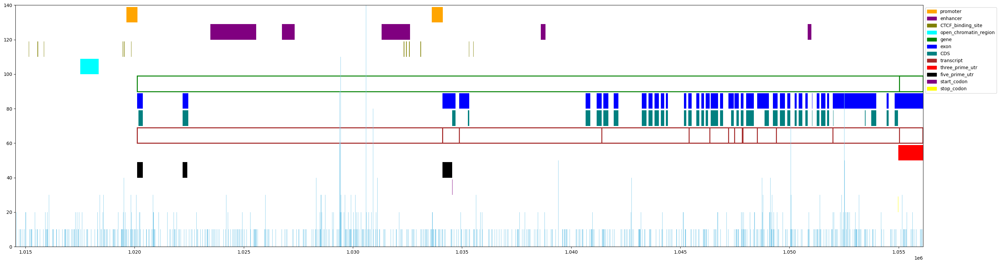

gene_#=2,exon_#=167,cds_#=147,var_#=16423,path_#=4
transcript_#=11,prime3_#=4,prime5_#=5,start_codon_#=4,stop_codon_#=4
promoter_#=2,enhancer_#=5,ctcf_#=12,open_#=1
sentence_id=1, begin=1232032, gene_start=1232237, gene_end=1235041, span=3009, prefix=205


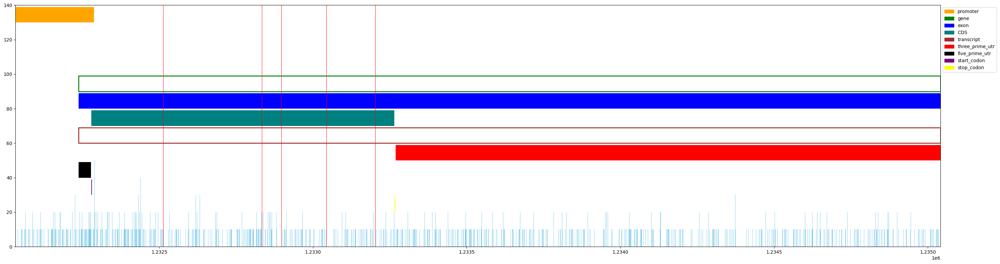

gene_#=1,exon_#=1,cds_#=1,var_#=1084,path_#=6
transcript_#=1,prime3_#=1,prime5_#=1,start_codon_#=1,stop_codon_#=1
promoter_#=1,enhancer_#=0,ctcf_#=0,open_#=0
sentence_id=2, begin=1509527, gene_start=1512162, gene_end=1534685, span=25158, prefix=2635


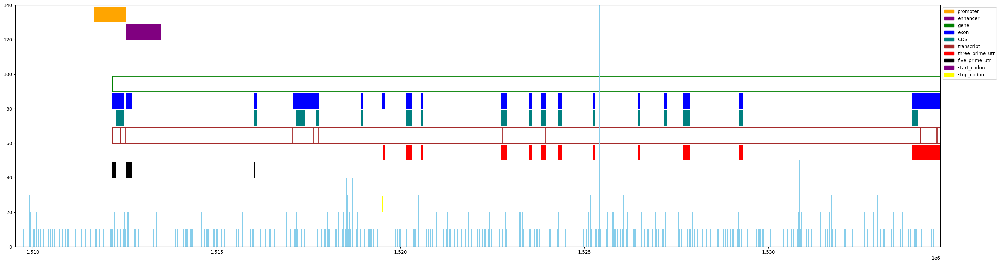

gene_#=1,exon_#=94,cds_#=61,var_#=10526,path_#=4
transcript_#=8,prime3_#=16,prime5_#=4,start_codon_#=3,stop_codon_#=5
promoter_#=1,enhancer_#=1,ctcf_#=0,open_#=0
sentence_id=3, begin=1534686, gene_start=1534778, gene_end=1592377, span=57691, prefix=92


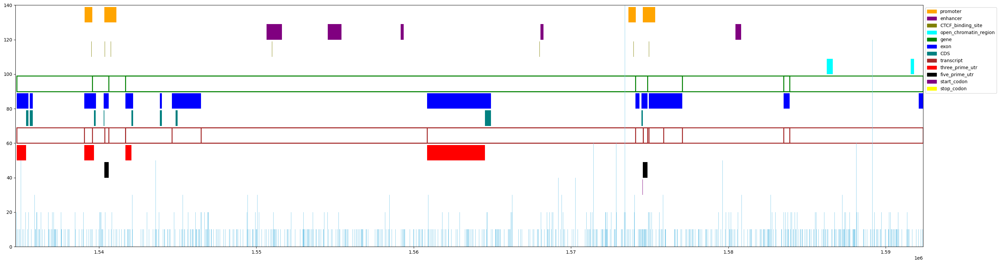

gene_#=5,exon_#=25,cds_#=13,var_#=21329,path_#=3
transcript_#=10,prime3_#=4,prime5_#=4,start_codon_#=4,stop_codon_#=4
promoter_#=4,enhancer_#=5,ctcf_#=7,open_#=2
sentence_id=4, begin=1780458, gene_start=1783129, gene_end=1892835, span=112377, prefix=2671


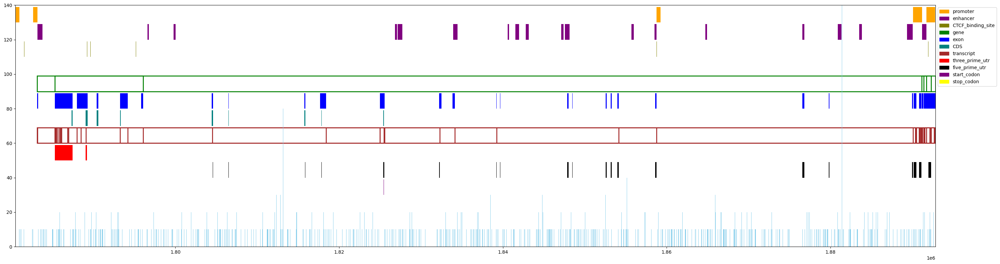

gene_#=4,exon_#=368,cds_#=208,var_#=35206,path_#=28
transcript_#=53,prime3_#=43,prime5_#=93,start_codon_#=25,stop_codon_#=23
promoter_#=5,enhancer_#=19,ctcf_#=8,open_#=0
sentence_id=5, begin=2019199, gene_start=2019329, gene_end=2030758, span=11559, prefix=130


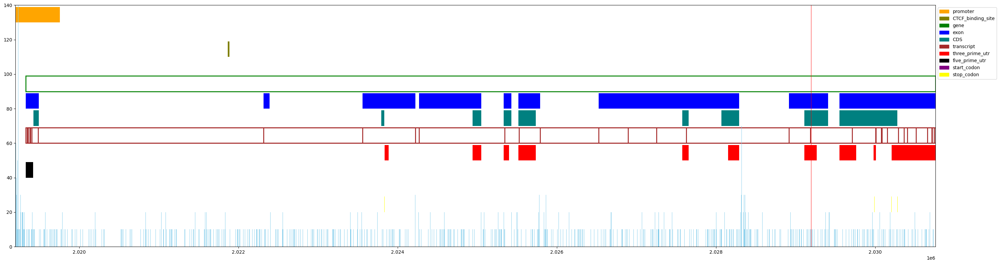

gene_#=1,exon_#=123,cds_#=69,var_#=3613,path_#=2
transcript_#=19,prime3_#=15,prime5_#=6,start_codon_#=6,stop_codon_#=7
promoter_#=1,enhancer_#=0,ctcf_#=1,open_#=0
sentence_id=6, begin=2220739, gene_start=2227388, gene_end=2310213, span=89474, prefix=6649


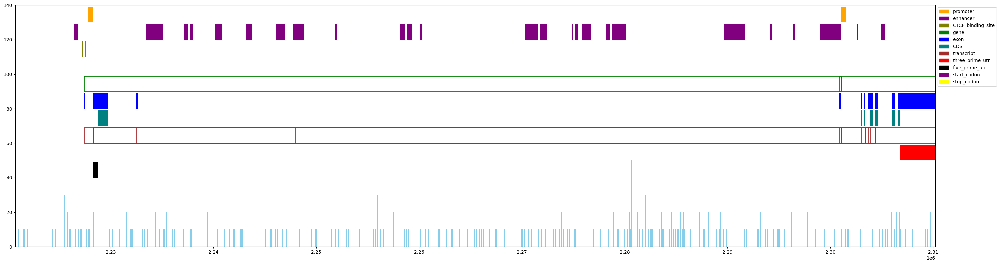

gene_#=2,exon_#=19,cds_#=7,var_#=30423,path_#=23
transcript_#=6,prime3_#=1,prime5_#=1,start_codon_#=1,stop_codon_#=1
promoter_#=2,enhancer_#=25,ctcf_#=13,open_#=0
sentence_id=7, begin=2391708, gene_start=2391775, gene_end=2413797, span=22089, prefix=67


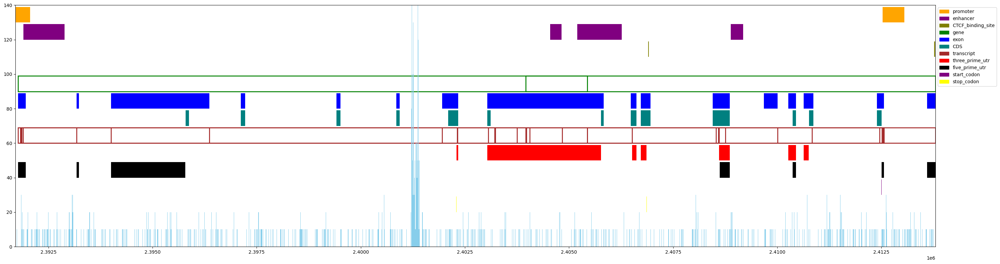

gene_#=2,exon_#=92,cds_#=68,var_#=8618,path_#=3
transcript_#=18,prime3_#=21,prime5_#=22,start_codon_#=13,stop_codon_#=12
promoter_#=2,enhancer_#=4,ctcf_#=2,open_#=0
sentence_id=8, begin=2505533, gene_start=2508537, gene_end=2526597, span=21064, prefix=3004


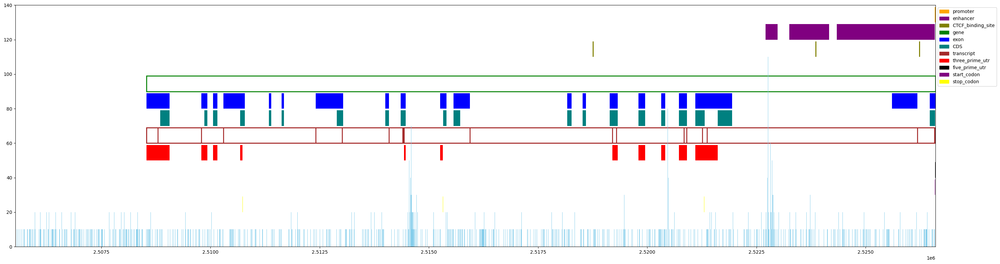

gene_#=1,exon_#=90,cds_#=66,var_#=7685,path_#=1
transcript_#=12,prime3_#=18,prime5_#=3,start_codon_#=3,stop_codon_#=7
promoter_#=1,enhancer_#=3,ctcf_#=3,open_#=0
sentence_id=9, begin=5862742, gene_start=5862811, gene_end=6101193, span=238451, prefix=69


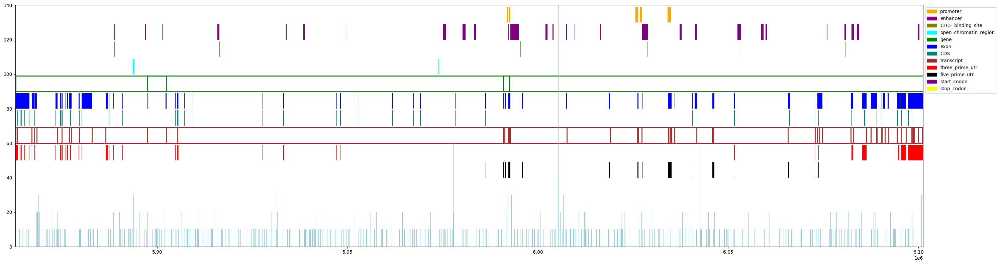

gene_#=3,exon_#=628,cds_#=390,var_#=67404,path_#=2
transcript_#=60,prime3_#=79,prime5_#=75,start_codon_#=35,stop_codon_#=30
promoter_#=5,enhancer_#=28,ctcf_#=24,open_#=2
sentence_id=10, begin=6101194, gene_start=6101787, gene_end=6239448, span=138254, prefix=593


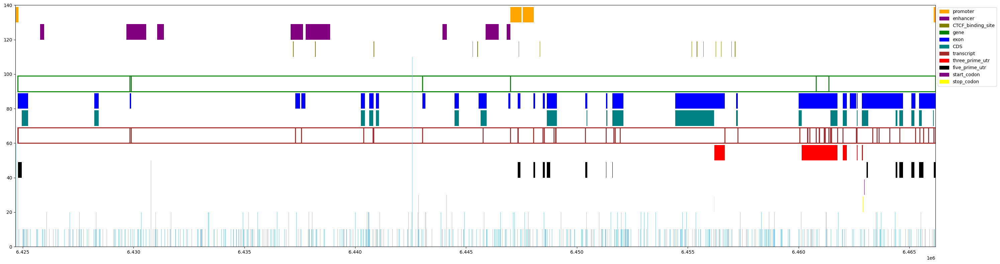

gene_#=4,exon_#=231,cds_#=159,var_#=11843,path_#=1
transcript_#=39,prime3_#=28,prime5_#=26,start_codon_#=22,stop_codon_#=18
promoter_#=4,enhancer_#=8,ctcf_#=14,open_#=0
sentence_id=12, begin=6466176, gene_start=6467122, gene_end=6520074, span=53898, prefix=946


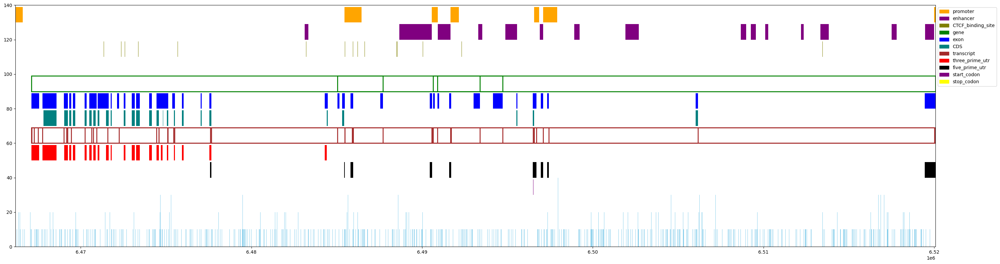

gene_#=4,exon_#=407,cds_#=291,var_#=14750,path_#=1
transcript_#=32,prime3_#=56,prime5_#=30,start_codon_#=18,stop_codon_#=17
promoter_#=7,enhancer_#=15,ctcf_#=14,open_#=0
sentence_id=13, begin=6784844, gene_start=6785454, gene_end=7769706, span=984862, prefix=610


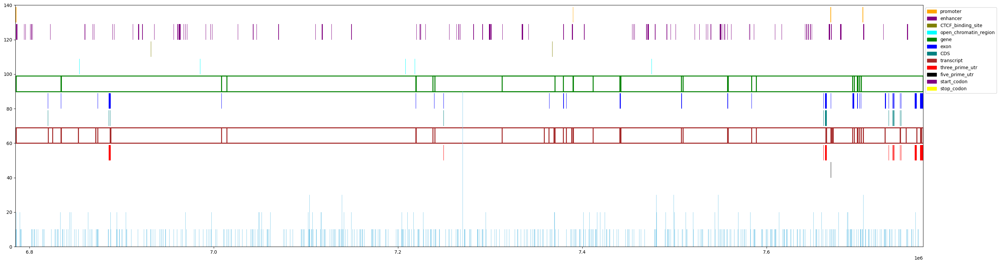

gene_#=15,exon_#=433,cds_#=264,var_#=258937,path_#=8
transcript_#=62,prime3_#=69,prime5_#=28,start_codon_#=18,stop_codon_#=27
promoter_#=5,enhancer_#=100,ctcf_#=41,open_#=9
sentence_id=14, begin=7943166, gene_start=7954291, gene_end=7985505, span=42339, prefix=11125


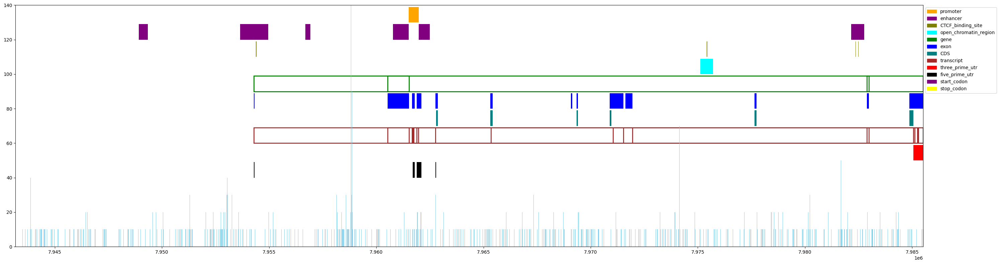

gene_#=3,exon_#=64,cds_#=40,var_#=12800,path_#=3
transcript_#=12,prime3_#=6,prime5_#=12,start_codon_#=6,stop_codon_#=6
promoter_#=1,enhancer_#=6,ctcf_#=5,open_#=1
sentence_id=15, begin=8344168, gene_start=8352397, gene_end=8848921, span=504753, prefix=8229


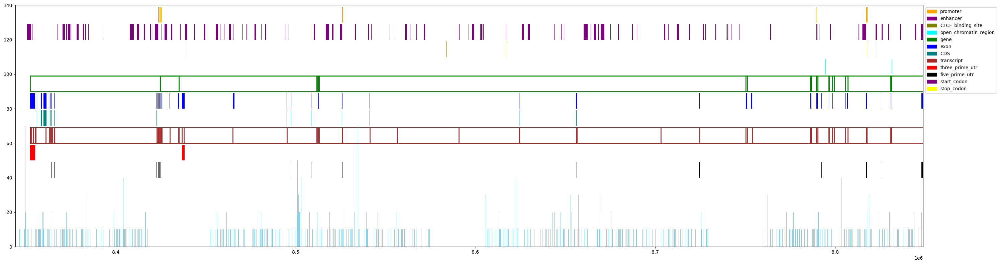

gene_#=11,exon_#=219,cds_#=145,var_#=141380,path_#=16
transcript_#=34,prime3_#=9,prime5_#=36,start_codon_#=13,stop_codon_#=8
promoter_#=6,enhancer_#=105,ctcf_#=30,open_#=2
sentence_id=16, begin=9629426, gene_start=9629889, gene_end=9823984, span=194558, prefix=463


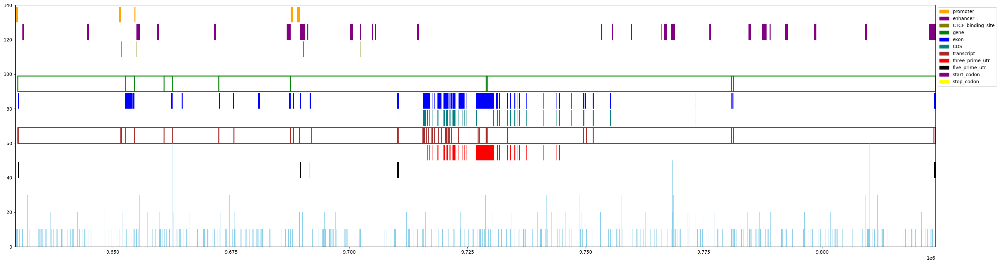

gene_#=7,exon_#=389,cds_#=266,var_#=57208,path_#=8
transcript_#=36,prime3_#=43,prime5_#=31,start_codon_#=13,stop_codon_#=14
promoter_#=6,enhancer_#=28,ctcf_#=19,open_#=0
sentence_id=17, begin=9828272, gene_start=9848276, gene_end=9985501, span=157229, prefix=20004


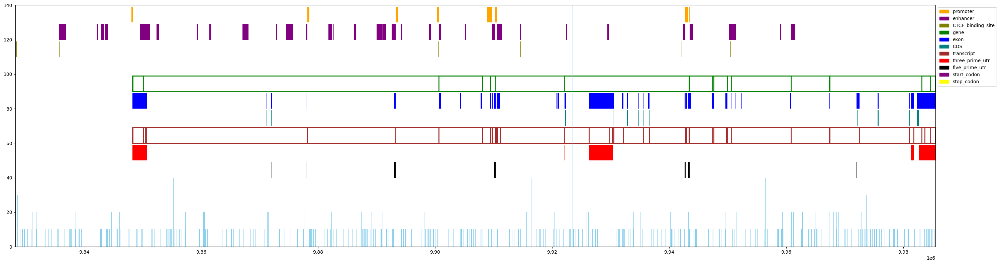

gene_#=10,exon_#=128,cds_#=49,var_#=43644,path_#=23
transcript_#=32,prime3_#=13,prime5_#=27,start_codon_#=10,stop_codon_#=12
promoter_#=8,enhancer_#=32,ctcf_#=14,open_#=0
sentence_id=18, begin=10991798, gene_start=11012344, gene_end=11047239, span=55441, prefix=20546


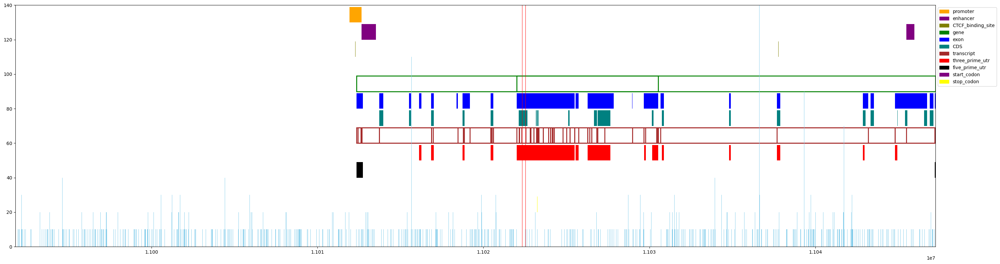

gene_#=2,exon_#=323,cds_#=233,var_#=19016,path_#=20
transcript_#=55,prime3_#=83,prime5_#=24,start_codon_#=28,stop_codon_#=39
promoter_#=1,enhancer_#=2,ctcf_#=2,open_#=0
sentence_id=19, begin=11102106, gene_start=11106535, gene_end=11262556, span=160450, prefix=4429


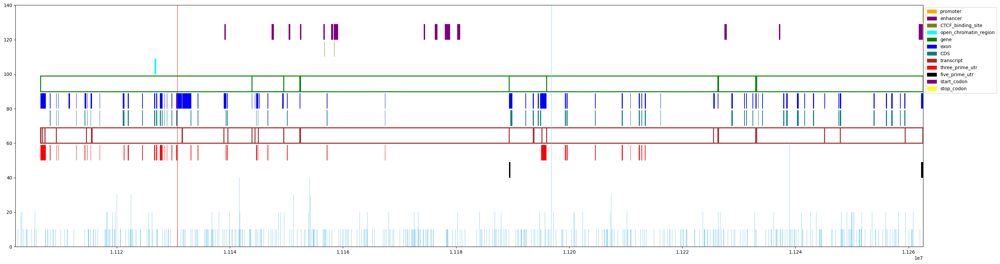

gene_#=6,exon_#=517,cds_#=305,var_#=40213,path_#=34
transcript_#=23,prime3_#=102,prime5_#=15,start_codon_#=8,stop_codon_#=8
promoter_#=1,enhancer_#=14,ctcf_#=5,open_#=1
sentence_id=20, begin=11754803, gene_start=11761787, gene_end=11848345, span=93542, prefix=6984


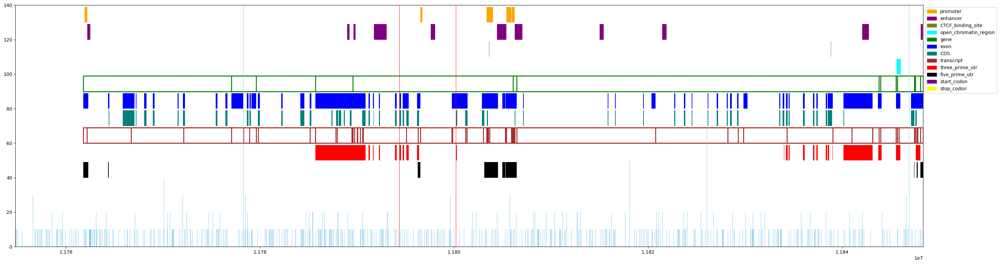

gene_#=8,exon_#=397,cds_#=256,var_#=25681,path_#=33
transcript_#=43,prime3_#=42,prime5_#=30,start_codon_#=20,stop_codon_#=20
promoter_#=6,enhancer_#=11,ctcf_#=3,open_#=1
sentence_id=21, begin=11926429, gene_start=11934205, gene_end=11975538, span=49109, prefix=7776


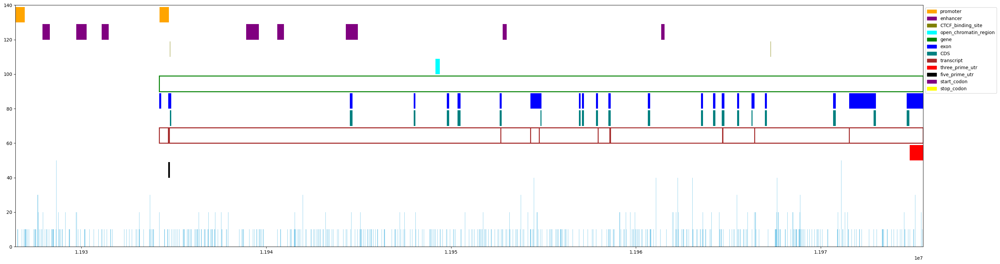

gene_#=1,exon_#=62,cds_#=33,var_#=14678,path_#=3
transcript_#=9,prime3_#=1,prime5_#=3,start_codon_#=3,stop_codon_#=1
promoter_#=2,enhancer_#=8,ctcf_#=2,open_#=1
sentence_id=22, begin=11980128, gene_start=11980181, gene_end=12015211, span=35083, prefix=53


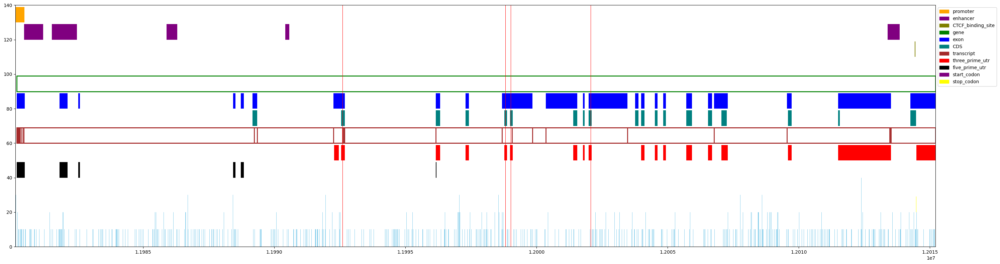

gene_#=1,exon_#=437,cds_#=253,var_#=9491,path_#=128
transcript_#=33,prime3_#=45,prime5_#=68,start_codon_#=21,stop_codon_#=17
promoter_#=1,enhancer_#=5,ctcf_#=1,open_#=0
sentence_id=23, begin=12227460, gene_start=12230030, gene_end=12512047, span=284587, prefix=2570


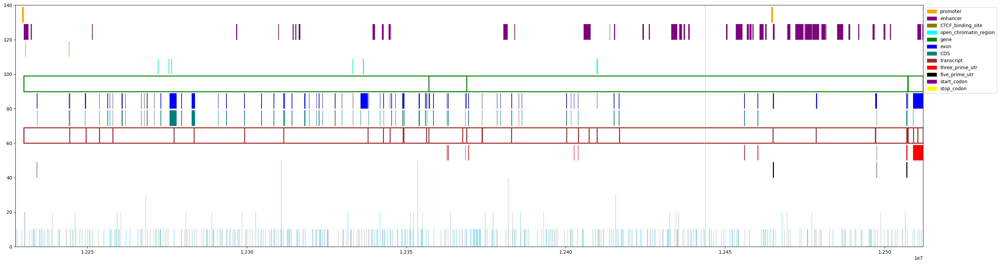

gene_#=3,exon_#=361,cds_#=233,var_#=66864,path_#=8
transcript_#=22,prime3_#=17,prime5_#=7,start_codon_#=3,stop_codon_#=7
promoter_#=2,enhancer_#=46,ctcf_#=14,open_#=6
sentence_id=24, begin=15430340, gene_start=15438442, gene_end=15449242, span=18902, prefix=8102


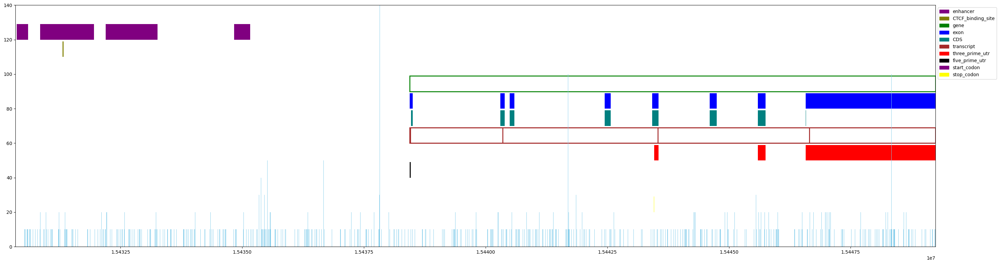

gene_#=1,exon_#=22,cds_#=11,var_#=4941,path_#=4
transcript_#=4,prime3_#=4,prime5_#=2,start_codon_#=2,stop_codon_#=2
promoter_#=0,enhancer_#=4,ctcf_#=1,open_#=0
sentence_id=25, begin=15449243, gene_start=15456728, gene_end=15526534, span=77291, prefix=7485


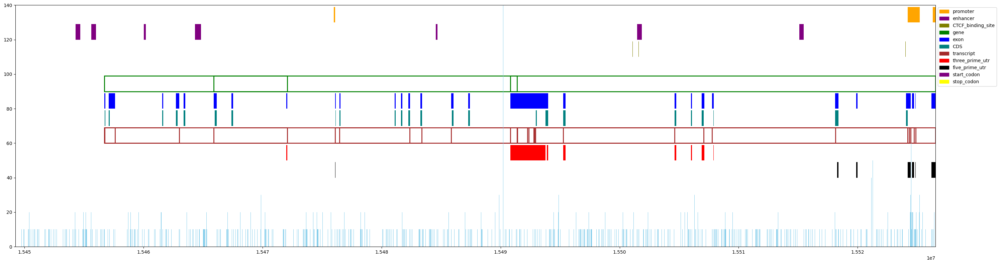

gene_#=3,exon_#=107,cds_#=74,var_#=21269,path_#=1
transcript_#=18,prime3_#=20,prime5_#=13,start_codon_#=10,stop_codon_#=9
promoter_#=3,enhancer_#=7,ctcf_#=3,open_#=0
sentence_id=26, begin=16040030, gene_start=16040252, gene_end=16057311, span=17281, prefix=222


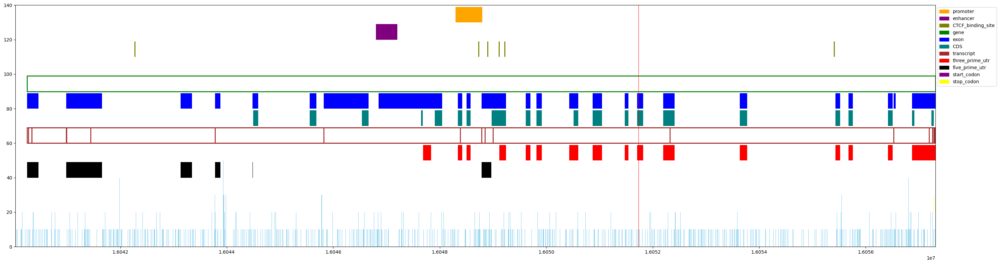

gene_#=1,exon_#=244,cds_#=152,var_#=5430,path_#=12
transcript_#=15,prime3_#=28,prime5_#=23,start_codon_#=9,stop_codon_#=10
promoter_#=1,enhancer_#=1,ctcf_#=6,open_#=0
sentence_id=27, begin=16073652, gene_start=16124337, gene_end=16183148, span=109496, prefix=50685


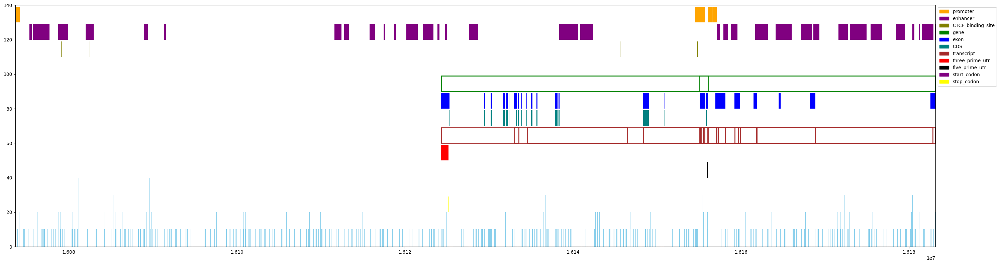

gene_#=2,exon_#=53,cds_#=17,var_#=30876,path_#=3
transcript_#=13,prime3_#=1,prime5_#=1,start_codon_#=1,stop_codon_#=1
promoter_#=4,enhancer_#=33,ctcf_#=13,open_#=0
sentence_id=28, begin=16972965, gene_start=16974502, gene_end=17011928, span=38963, prefix=1537


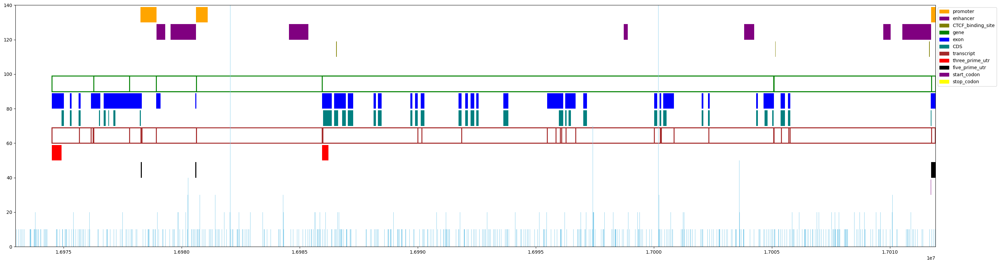

gene_#=5,exon_#=205,cds_#=156,var_#=11169,path_#=2
transcript_#=23,prime3_#=6,prime5_#=6,start_codon_#=6,stop_codon_#=7
promoter_#=3,enhancer_#=7,ctcf_#=3,open_#=0
sentence_id=29, begin=17011929, gene_start=17018664, gene_end=17054151, span=42222, prefix=6735


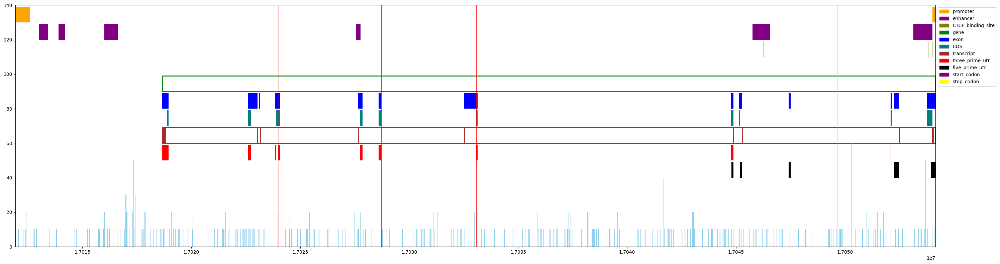

gene_#=1,exon_#=123,cds_#=82,var_#=11172,path_#=68
transcript_#=18,prime3_#=37,prime5_#=18,start_codon_#=14,stop_codon_#=14
promoter_#=2,enhancer_#=6,ctcf_#=3,open_#=0
sentence_id=30, begin=17246008, gene_start=17249098, gene_end=17284233, span=38225, prefix=3090


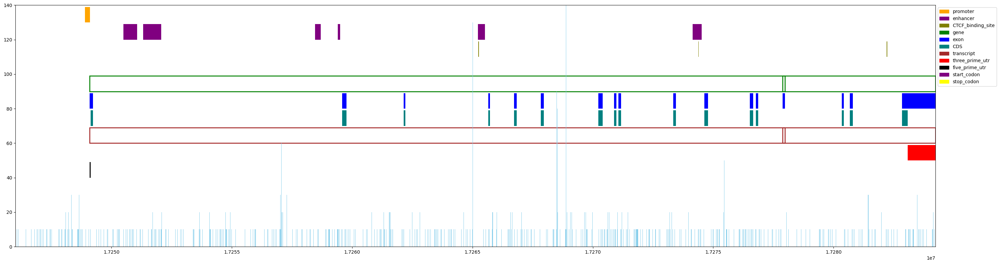

gene_#=2,exon_#=17,cds_#=16,var_#=9652,path_#=4
transcript_#=2,prime3_#=1,prime5_#=1,start_codon_#=1,stop_codon_#=1
promoter_#=1,enhancer_#=6,ctcf_#=3,open_#=0
sentence_id=31, begin=17364005, gene_start=17372196, gene_end=17401699, span=37694, prefix=8191


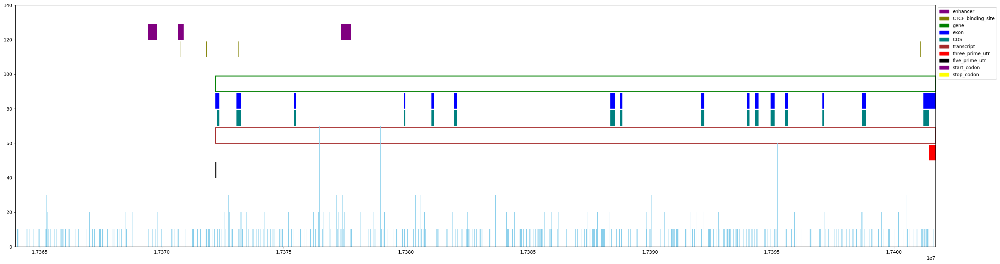

gene_#=1,exon_#=16,cds_#=16,var_#=11792,path_#=7
transcript_#=1,prime3_#=1,prime5_#=1,start_codon_#=1,stop_codon_#=1
promoter_#=0,enhancer_#=3,ctcf_#=4,open_#=0
sentence_id=32, begin=19210267, gene_start=19210330, gene_end=19251552, span=41285, prefix=63


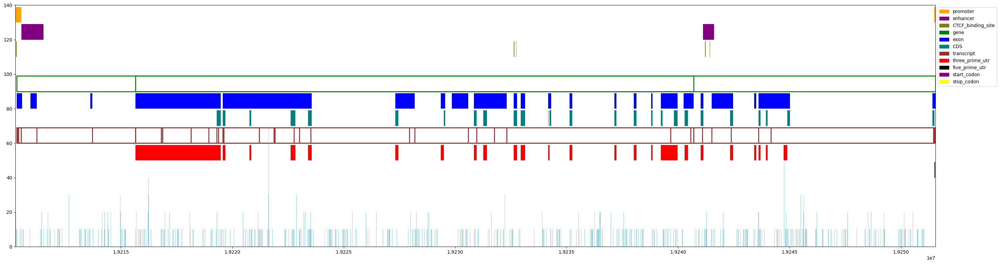

gene_#=2,exon_#=367,cds_#=215,var_#=9884,path_#=4
transcript_#=33,prime3_#=99,prime5_#=12,start_codon_#=14,stop_codon_#=17
promoter_#=2,enhancer_#=2,ctcf_#=5,open_#=0
sentence_id=33, begin=20618904, gene_start=20633458, gene_end=20661544, span=42640, prefix=14554


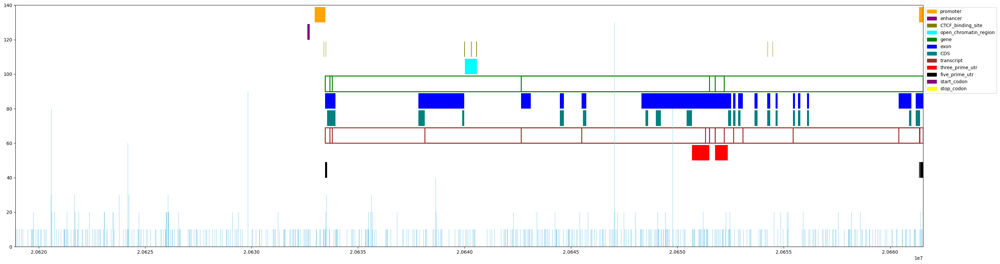

gene_#=4,exon_#=51,cds_#=34,var_#=11842,path_#=7
transcript_#=10,prime3_#=3,prime5_#=4,start_codon_#=4,stop_codon_#=3
promoter_#=2,enhancer_#=1,ctcf_#=8,open_#=1
sentence_id=34, begin=21178165, gene_start=21217247, gene_end=21345572, span=167407, prefix=39082


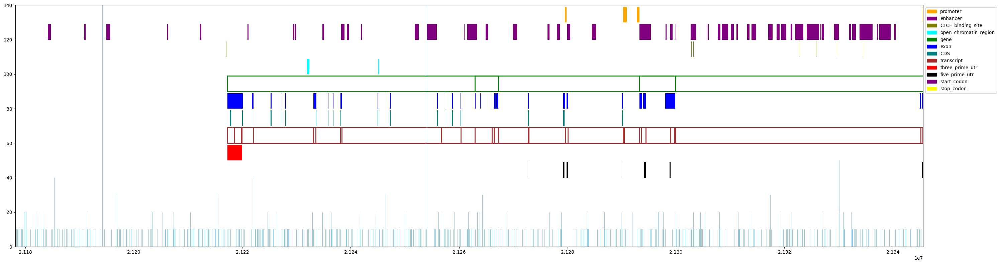

gene_#=3,exon_#=168,cds_#=120,var_#=44288,path_#=1
transcript_#=20,prime3_#=6,prime5_#=11,start_codon_#=9,stop_codon_#=6
promoter_#=4,enhancer_#=50,ctcf_#=27,open_#=2
sentence_id=35, begin=21485006, gene_start=21509397, gene_end=21578410, span=93404, prefix=24391


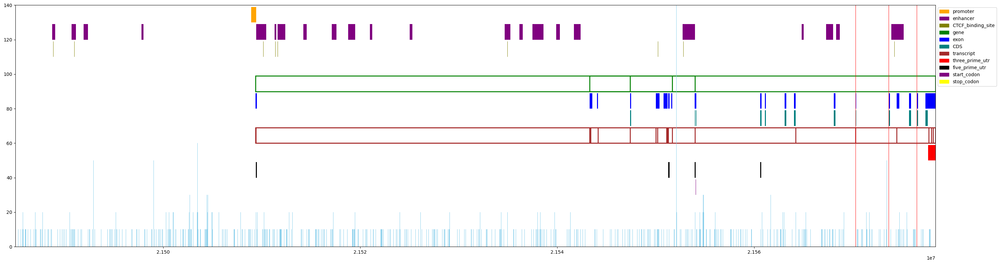

gene_#=3,exon_#=72,cds_#=47,var_#=25267,path_#=231
transcript_#=13,prime3_#=5,prime5_#=8,start_codon_#=5,stop_codon_#=6
promoter_#=1,enhancer_#=22,ctcf_#=12,open_#=0
sentence_id=36, begin=21783607, gene_start=21812265, gene_end=21937310, span=153703, prefix=28658


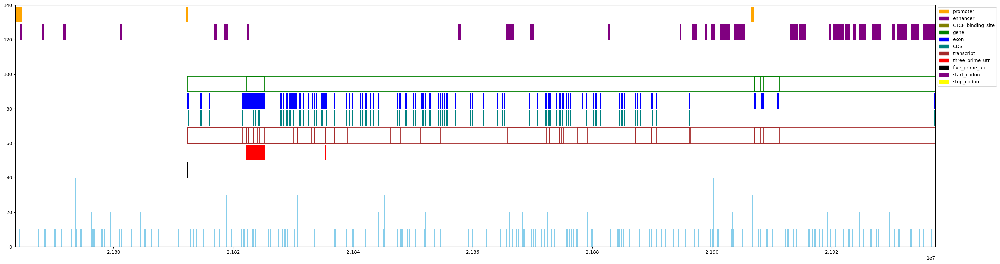

gene_#=4,exon_#=186,cds_#=136,var_#=40654,path_#=7
transcript_#=20,prime3_#=5,prime5_#=3,start_codon_#=3,stop_codon_#=4
promoter_#=4,enhancer_#=30,ctcf_#=10,open_#=0
sentence_id=37, begin=21957178, gene_start=21977022, gene_end=22101360, span=144182, prefix=19844


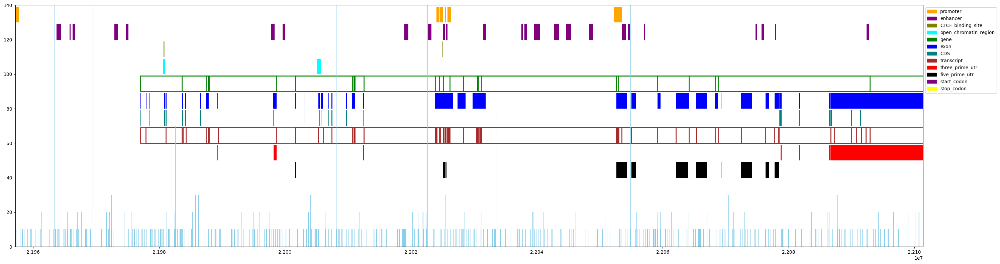

gene_#=15,exon_#=291,cds_#=139,var_#=48122,path_#=15
transcript_#=72,prime3_#=42,prime5_#=56,start_codon_#=28,stop_codon_#=28
promoter_#=7,enhancer_#=25,ctcf_#=8,open_#=2
sentence_id=38, begin=22633367, gene_start=22635077, gene_end=22663254, span=29887, prefix=1710


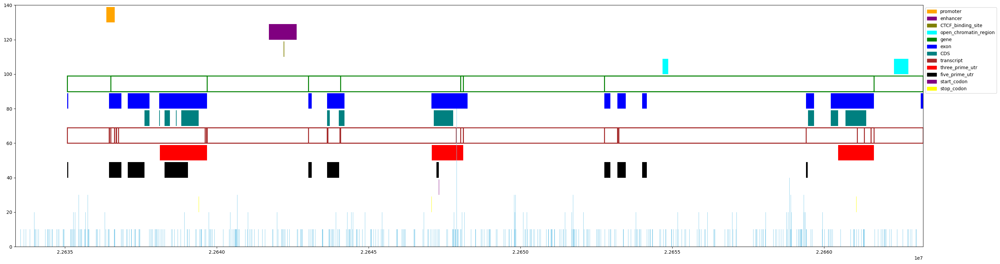

gene_#=5,exon_#=107,cds_#=69,var_#=7466,path_#=3
transcript_#=36,prime3_#=31,prime5_#=71,start_codon_#=35,stop_codon_#=31
promoter_#=1,enhancer_#=1,ctcf_#=1,open_#=2
sentence_id=39, begin=23019101, gene_start=23019443, gene_end=23178152, span=159051, prefix=342


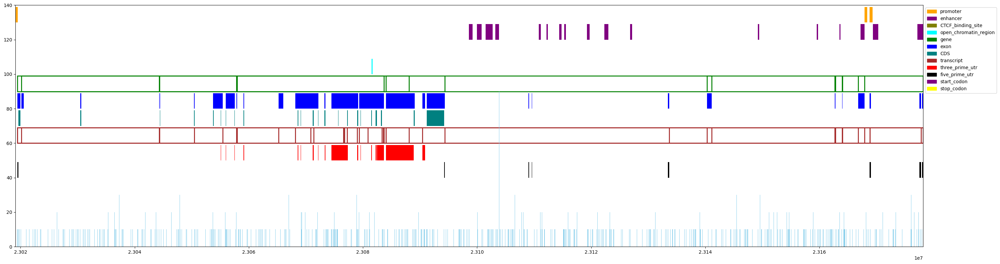

gene_#=10,exon_#=560,cds_#=352,var_#=39974,path_#=8
transcript_#=51,prime3_#=74,prime5_#=42,start_codon_#=28,stop_codon_#=29
promoter_#=3,enhancer_#=17,ctcf_#=4,open_#=1
sentence_id=40, begin=23795540, gene_start=23795599, gene_end=23800781, span=5241, prefix=59


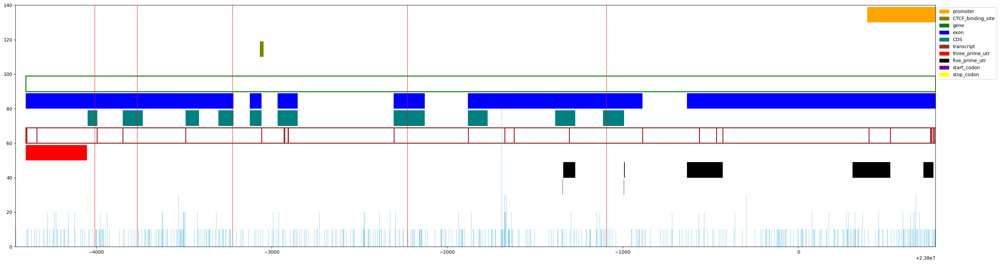

gene_#=1,exon_#=105,cds_#=48,var_#=1286,path_#=9
transcript_#=16,prime3_#=3,prime5_#=16,start_codon_#=6,stop_codon_#=3
promoter_#=1,enhancer_#=0,ctcf_#=1,open_#=0
sentence_id=41, begin=23800782, gene_start=23801885, gene_end=23838620, span=37838, prefix=1103


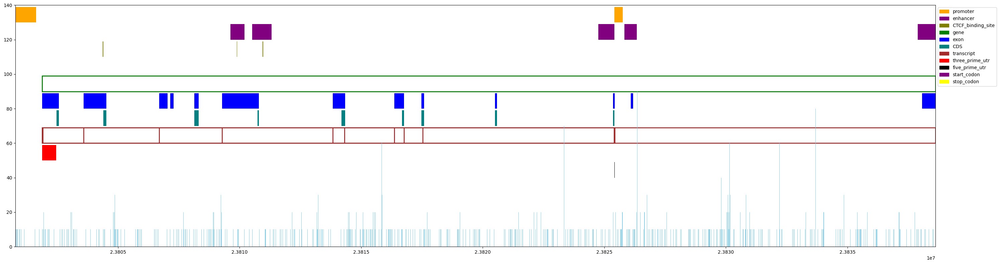

gene_#=1,exon_#=52,cds_#=21,var_#=10293,path_#=11
transcript_#=9,prime3_#=3,prime5_#=2,start_codon_#=2,stop_codon_#=3
promoter_#=2,enhancer_#=5,ctcf_#=3,open_#=0
sentence_id=42, begin=23838621, gene_start=23845077, gene_end=23868290, span=29669, prefix=6456


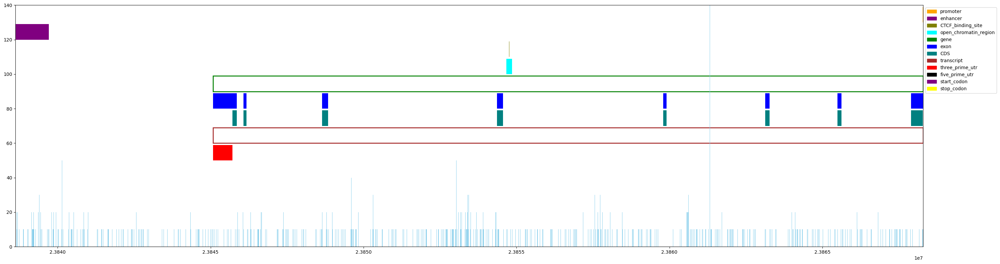

gene_#=1,exon_#=8,cds_#=8,var_#=8434,path_#=7
transcript_#=1,prime3_#=1,prime5_#=1,start_codon_#=1,stop_codon_#=1
promoter_#=1,enhancer_#=1,ctcf_#=1,open_#=1
sentence_id=43, begin=24187960, gene_start=24199558, gene_end=24475252, span=287292, prefix=11598


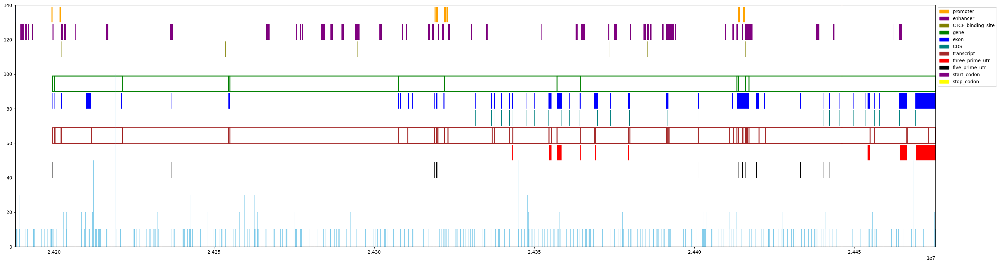

gene_#=7,exon_#=296,cds_#=216,var_#=69908,path_#=2
transcript_#=39,prime3_#=18,prime5_#=37,start_codon_#=17,stop_codon_#=20
promoter_#=9,enhancer_#=52,ctcf_#=22,open_#=0
sentence_id=44, begin=25500210, gene_start=25543604, gene_end=25591200, span=90990, prefix=43394


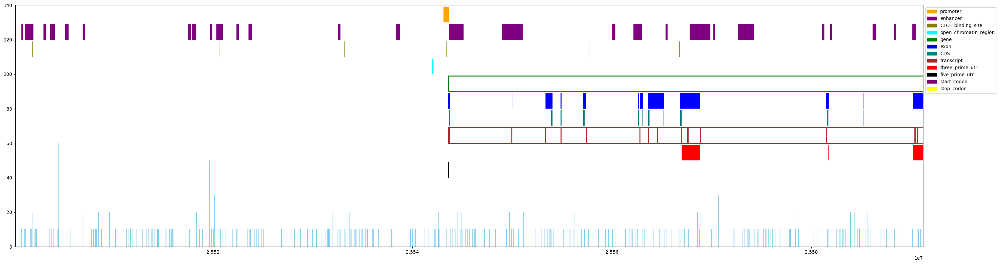

gene_#=1,exon_#=59,cds_#=32,var_#=22469,path_#=1
transcript_#=11,prime3_#=7,prime5_#=3,start_codon_#=4,stop_codon_#=4
promoter_#=1,enhancer_#=27,ctcf_#=11,open_#=1
sentence_id=45, begin=25784451, gene_start=25800193, gene_end=25859458, span=75007, prefix=15742


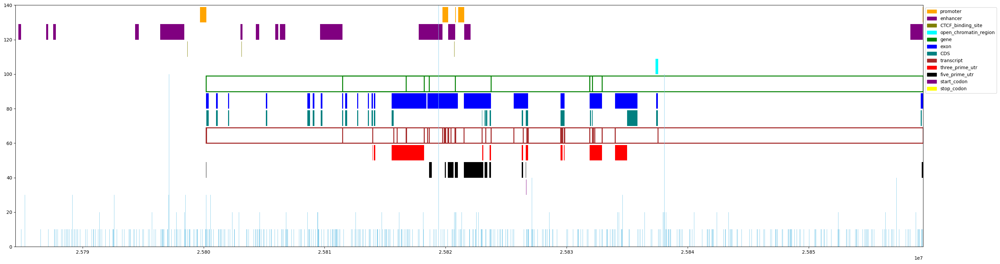

gene_#=6,exon_#=217,cds_#=134,var_#=19176,path_#=1
transcript_#=40,prime3_#=32,prime5_#=52,start_codon_#=25,stop_codon_#=19
promoter_#=5,enhancer_#=14,ctcf_#=10,open_#=1
sentence_id=46, begin=26374523, gene_start=26410817, gene_end=26478209, span=103686, prefix=36294


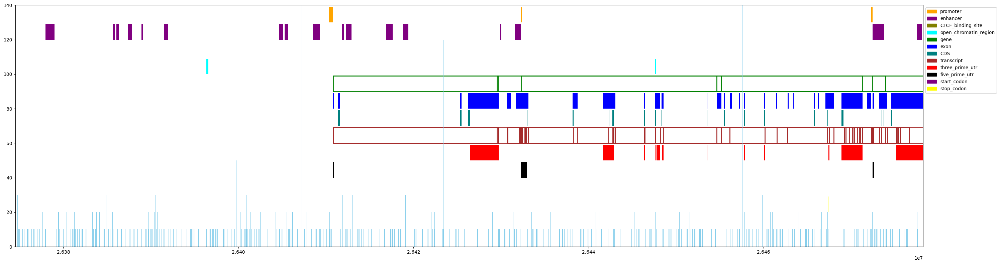

gene_#=5,exon_#=308,cds_#=158,var_#=29955,path_#=12
transcript_#=59,prime3_#=46,prime5_#=49,start_codon_#=28,stop_codon_#=22
promoter_#=3,enhancer_#=17,ctcf_#=5,open_#=2
sentence_id=47, begin=26690813, gene_start=26692132, gene_end=26782104, span=91291, prefix=1319


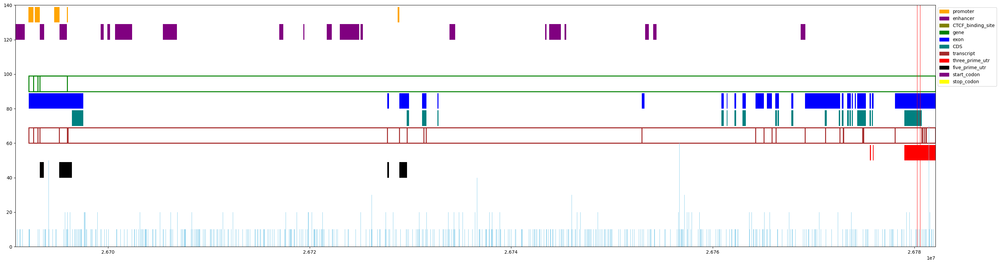

gene_#=3,exon_#=139,cds_#=109,var_#=24336,path_#=22
transcript_#=18,prime3_#=8,prime5_#=9,start_codon_#=6,stop_codon_#=7
promoter_#=5,enhancer_#=19,ctcf_#=1,open_#=0
sentence_id=48, begin=26782105, gene_start=26784963, gene_end=26800659, span=18554, prefix=2858


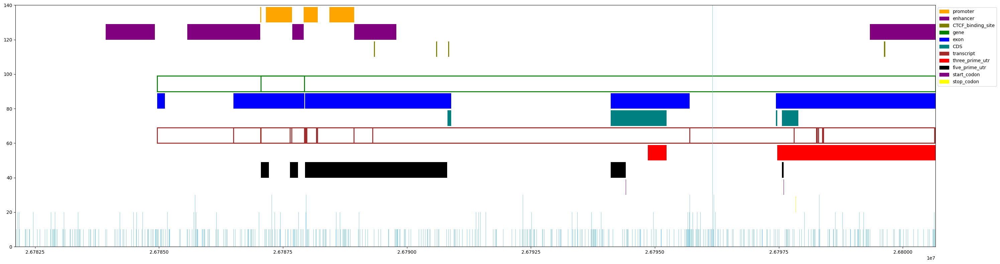

gene_#=2,exon_#=81,cds_#=52,var_#=4423,path_#=5
transcript_#=23,prime3_#=20,prime5_#=37,start_codon_#=19,stop_codon_#=19
promoter_#=4,enhancer_#=5,ctcf_#=4,open_#=0
sentence_id=49, begin=26946872, gene_start=26949562, gene_end=26960468, span=13596, prefix=2690


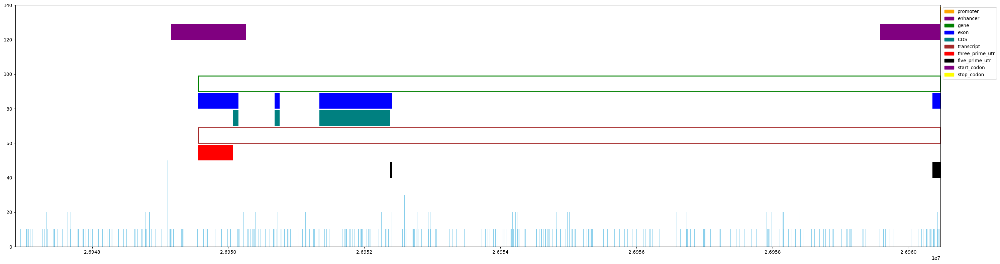

gene_#=1,exon_#=4,cds_#=3,var_#=3259,path_#=1
transcript_#=1,prime3_#=1,prime5_#=2,start_codon_#=1,stop_codon_#=1
promoter_#=1,enhancer_#=2,ctcf_#=0,open_#=0
sentence_id=50, begin=27060684, gene_start=27098809, gene_end=27166981, span=106297, prefix=38125


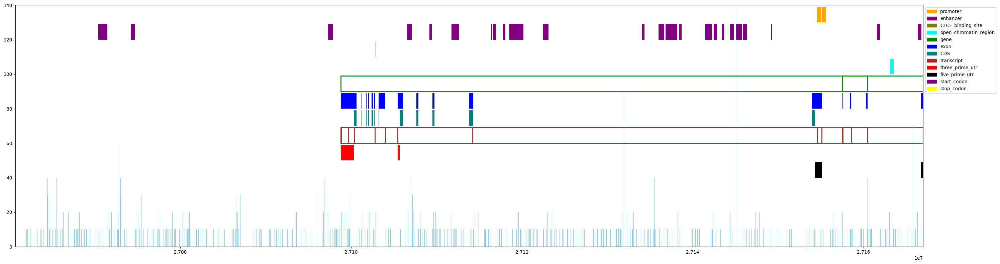

gene_#=2,exon_#=41,cds_#=19,var_#=31505,path_#=1
transcript_#=8,prime3_#=2,prime5_#=5,start_codon_#=3,stop_codon_#=2
promoter_#=2,enhancer_#=24,ctcf_#=8,open_#=1
sentence_id=51, begin=27505577, gene_start=27522446, gene_end=27604431, span=98854, prefix=16869


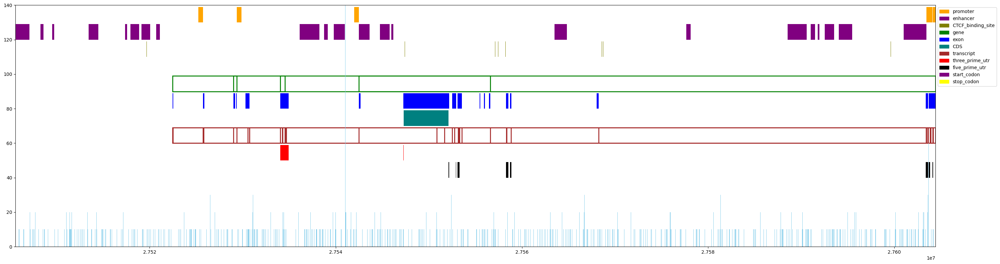

gene_#=4,exon_#=115,cds_#=6,var_#=25455,path_#=2
transcript_#=26,prime3_#=12,prime5_#=38,start_codon_#=6,stop_codon_#=6
promoter_#=5,enhancer_#=22,ctcf_#=12,open_#=0
sentence_id=52, begin=29181901, gene_start=29192657, gene_end=29230942, span=49041, prefix=10756


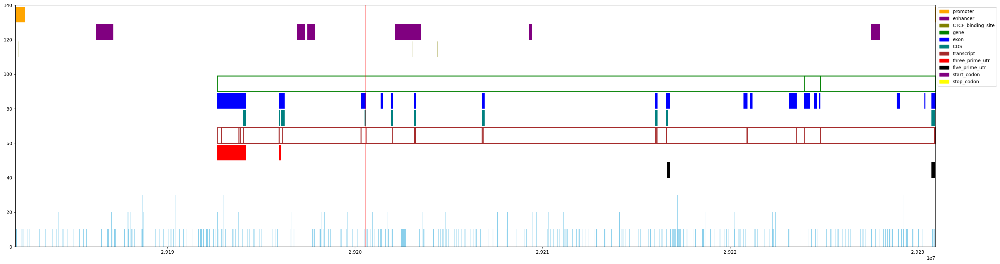

gene_#=2,exon_#=115,cds_#=25,var_#=11926,path_#=2
transcript_#=19,prime3_#=4,prime5_#=3,start_codon_#=2,stop_codon_#=3
promoter_#=2,enhancer_#=6,ctcf_#=4,open_#=0
sentence_id=53, begin=30918736, gene_start=30929209, gene_end=31065991, span=147255, prefix=10473


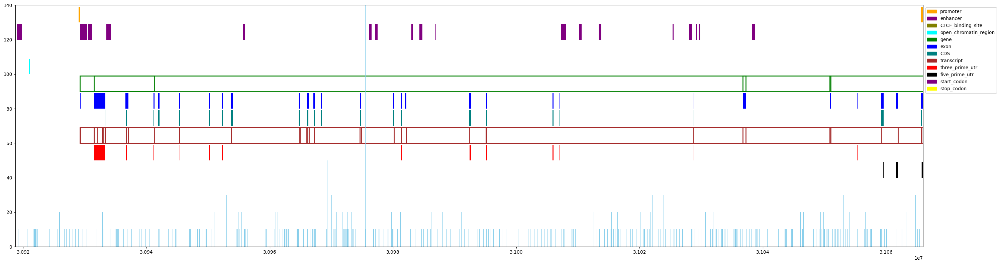

gene_#=4,exon_#=260,cds_#=210,var_#=40393,path_#=6
transcript_#=27,prime3_#=29,prime5_#=19,start_codon_#=11,stop_codon_#=15
promoter_#=2,enhancer_#=18,ctcf_#=6,open_#=1
sentence_id=54, begin=32774971, gene_start=32775237, gene_end=32858875, span=83904, prefix=266


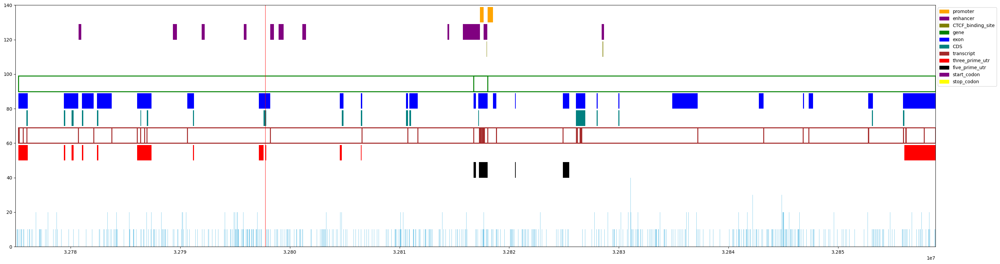

gene_#=2,exon_#=162,cds_#=64,var_#=22978,path_#=8
transcript_#=30,prime3_#=36,prime5_#=30,start_codon_#=15,stop_codon_#=9
promoter_#=2,enhancer_#=11,ctcf_#=4,open_#=0
sentence_id=55, begin=32974464, gene_start=32979625, gene_end=33080996, span=106532, prefix=5161


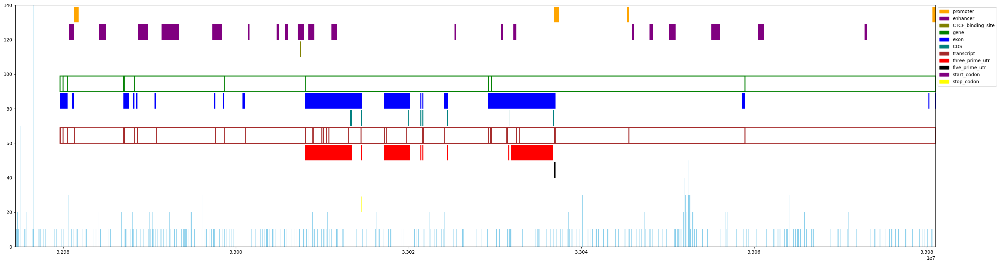

gene_#=6,exon_#=176,cds_#=61,var_#=27924,path_#=5
transcript_#=39,prime3_#=58,prime5_#=15,start_codon_#=15,stop_codon_#=15
promoter_#=4,enhancer_#=20,ctcf_#=9,open_#=0
sentence_id=56, begin=34685733, gene_start=34712737, gene_end=34859755, span=174022, prefix=27004


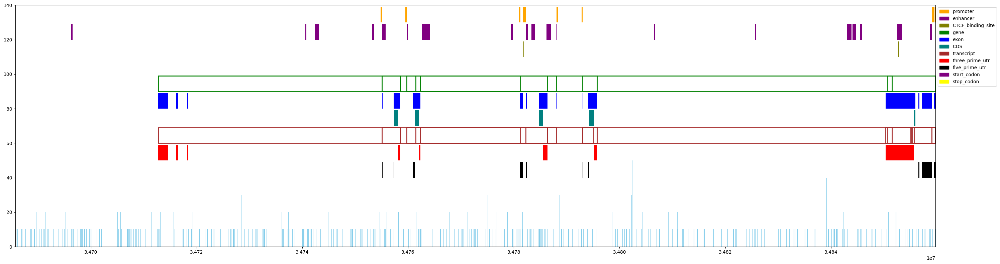

gene_#=7,exon_#=32,cds_#=13,var_#=42014,path_#=8
transcript_#=14,prime3_#=13,prime5_#=25,start_codon_#=12,stop_codon_#=11
promoter_#=8,enhancer_#=19,ctcf_#=7,open_#=0
sentence_id=57, begin=35196063, gene_start=35264319, gene_end=35567274, span=371211, prefix=68256


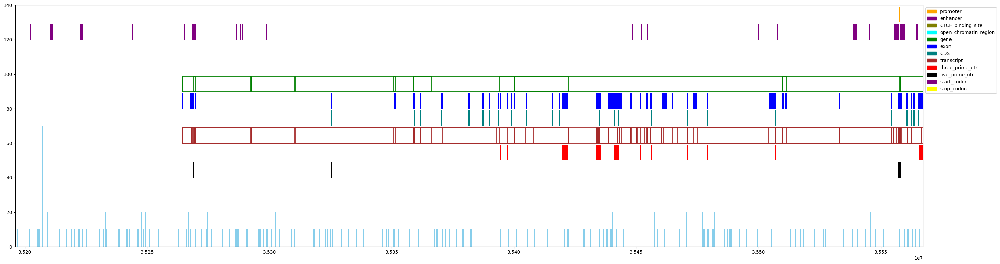

gene_#=10,exon_#=873,cds_#=425,var_#=99035,path_#=4
transcript_#=77,prime3_#=290,prime5_#=80,start_codon_#=41,stop_codon_#=39
promoter_#=3,enhancer_#=31,ctcf_#=13,open_#=1
sentence_id=58, begin=35857891, gene_start=35869808, gene_end=35930532, span=72641, prefix=11917


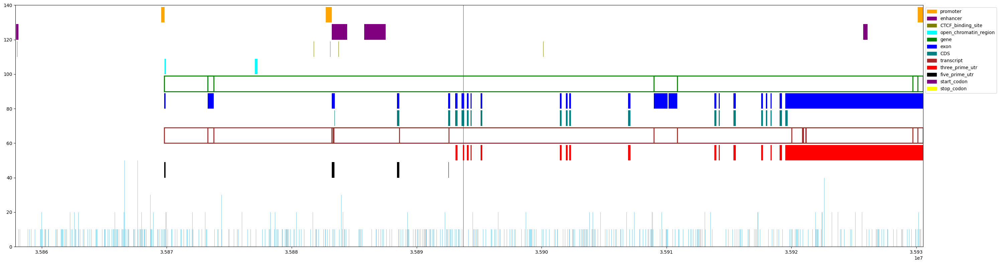

gene_#=4,exon_#=146,cds_#=93,var_#=17694,path_#=7
transcript_#=11,prime3_#=55,prime5_#=8,start_codon_#=6,stop_codon_#=8
promoter_#=3,enhancer_#=4,ctcf_#=5,open_#=2
sentence_id=59, begin=36088276, gene_start=36088892, gene_end=36093932, span=5656, prefix=616


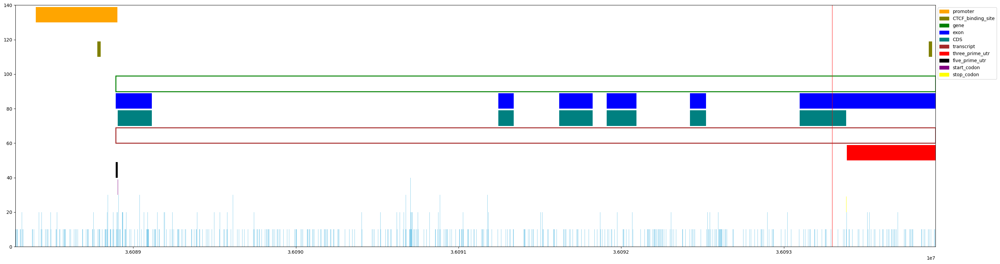

gene_#=1,exon_#=6,cds_#=6,var_#=1510,path_#=4
transcript_#=1,prime3_#=1,prime5_#=1,start_codon_#=1,stop_codon_#=1
promoter_#=1,enhancer_#=0,ctcf_#=2,open_#=0
sentence_id=60, begin=36397909, gene_start=36401263, gene_end=36572637, span=174728, prefix=3354


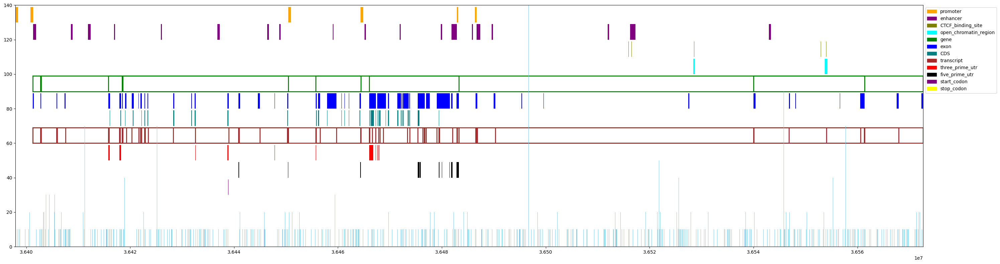

gene_#=7,exon_#=303,cds_#=143,var_#=46042,path_#=3
transcript_#=52,prime3_#=20,prime5_#=31,start_codon_#=12,stop_codon_#=14
promoter_#=6,enhancer_#=19,ctcf_#=8,open_#=2
sentence_id=61, begin=38816148, gene_start=38838198, gene_end=38965038, span=148890, prefix=22050


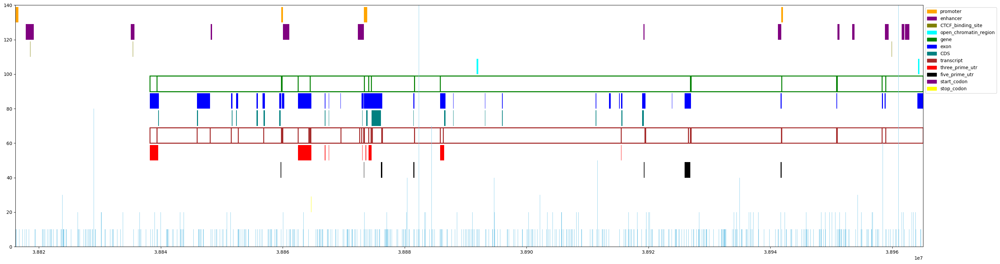

gene_#=10,exon_#=152,cds_#=40,var_#=42414,path_#=1
transcript_#=41,prime3_#=15,prime5_#=15,start_codon_#=10,stop_codon_#=10
promoter_#=4,enhancer_#=12,ctcf_#=9,open_#=2
sentence_id=62, begin=39034637, gene_start=39081316, gene_end=39487177, span=452540, prefix=46679


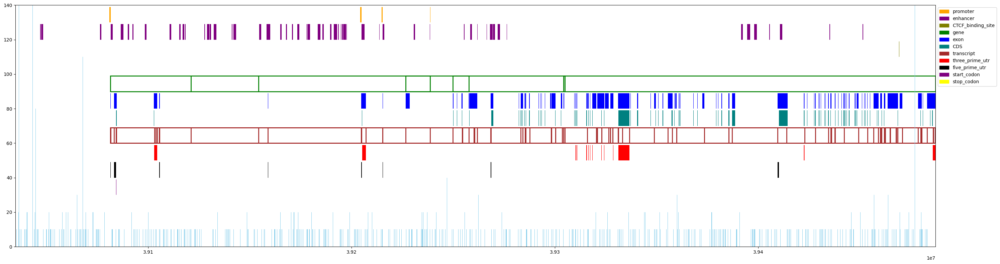

gene_#=6,exon_#=1195,cds_#=796,var_#=118906,path_#=6
transcript_#=63,prime3_#=33,prime5_#=19,start_codon_#=15,stop_codon_#=17
promoter_#=4,enhancer_#=57,ctcf_#=26,open_#=0
sentence_id=63, begin=39838089, gene_start=39838110, gene_end=39902256, span=64167, prefix=21


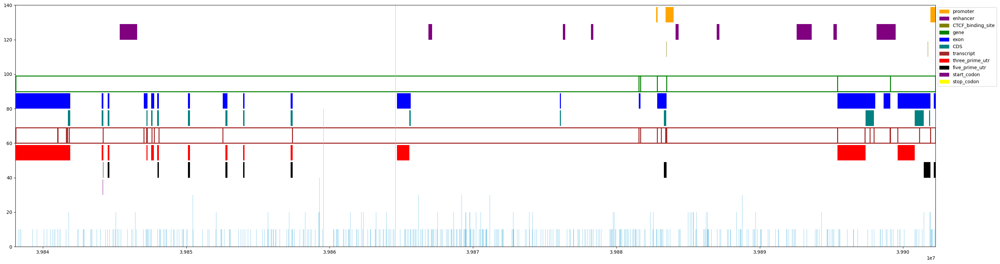

gene_#=4,exon_#=141,cds_#=74,var_#=15693,path_#=4
transcript_#=26,prime3_#=46,prime5_#=19,start_codon_#=12,stop_codon_#=15
promoter_#=3,enhancer_#=9,ctcf_#=2,open_#=0
sentence_id=64, begin=39944999, gene_start=39955112, gene_end=39969968, span=24969, prefix=10113


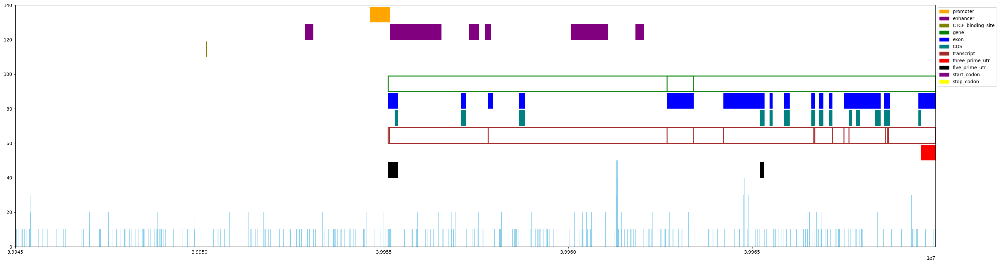

gene_#=2,exon_#=88,cds_#=46,var_#=6065,path_#=1
transcript_#=11,prime3_#=3,prime5_#=5,start_codon_#=4,stop_codon_#=3
promoter_#=1,enhancer_#=6,ctcf_#=1,open_#=0
sentence_id=65, begin=40072650, gene_start=40072710, gene_end=40097260, span=24610, prefix=60


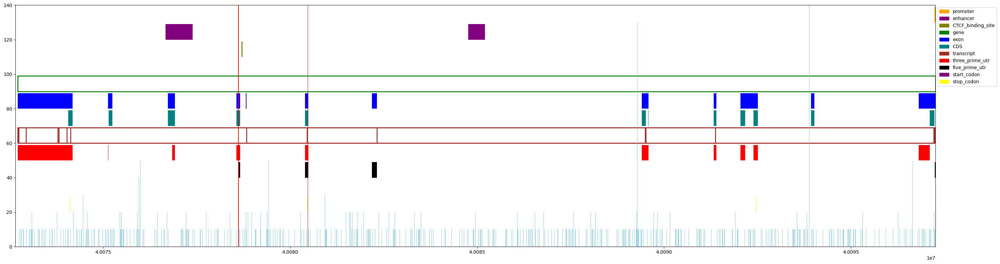

gene_#=1,exon_#=138,cds_#=97,var_#=6161,path_#=19
transcript_#=19,prime3_#=43,prime5_#=16,start_codon_#=14,stop_codon_#=16
promoter_#=1,enhancer_#=2,ctcf_#=1,open_#=0
sentence_id=66, begin=40257995, gene_start=40258041, gene_end=40294180, span=36185, prefix=46


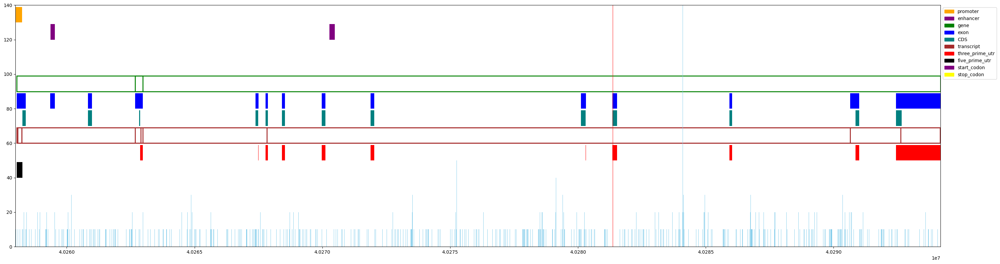

gene_#=2,exon_#=54,cds_#=23,var_#=9885,path_#=2
transcript_#=8,prime3_#=24,prime5_#=4,start_codon_#=4,stop_codon_#=4
promoter_#=1,enhancer_#=2,ctcf_#=0,open_#=0
sentence_id=67, begin=40294181, gene_start=40300489, gene_end=40317813, span=23632, prefix=6308


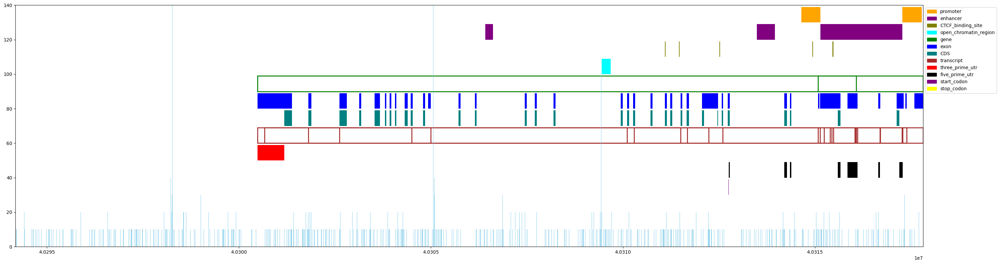

gene_#=2,exon_#=150,cds_#=48,var_#=5823,path_#=2
transcript_#=15,prime3_#=1,prime5_#=12,start_codon_#=4,stop_codon_#=1
promoter_#=2,enhancer_#=3,ctcf_#=5,open_#=1
sentence_id=68, begin=40771604, gene_start=40783787, gene_end=40840452, span=68848, prefix=12183


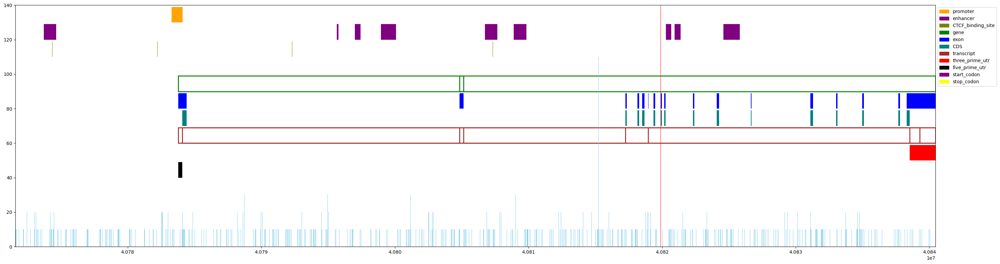

gene_#=2,exon_#=52,cds_#=40,var_#=16159,path_#=16
transcript_#=5,prime3_#=2,prime5_#=1,start_codon_#=2,stop_codon_#=3
promoter_#=1,enhancer_#=9,ctcf_#=6,open_#=0
sentence_id=69, begin=42424233, gene_start=42430329, gene_end=42703805, span=279572, prefix=6096


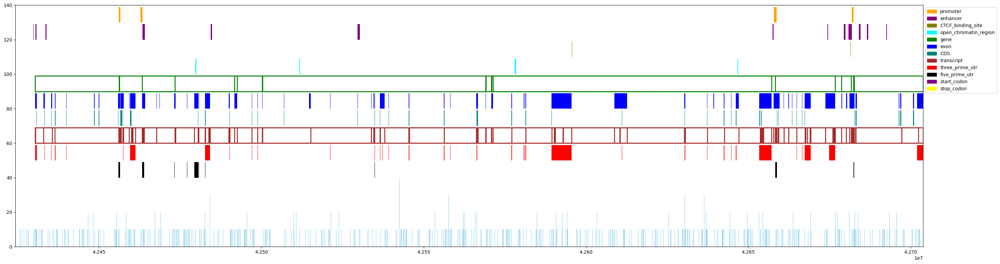

gene_#=11,exon_#=818,cds_#=460,var_#=64975,path_#=1
transcript_#=110,prime3_#=187,prime5_#=80,start_codon_#=52,stop_codon_#=57
promoter_#=4,enhancer_#=13,ctcf_#=11,open_#=4
sentence_id=70, begin=42703806, gene_start=42733093, gene_end=42740254, span=36448, prefix=29287


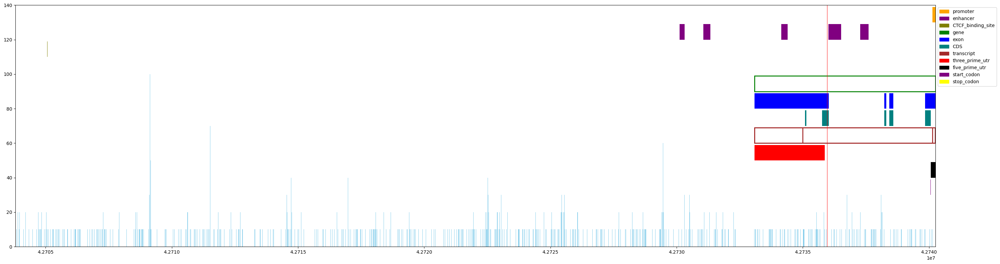

gene_#=1,exon_#=12,cds_#=12,var_#=11470,path_#=6
transcript_#=3,prime3_#=3,prime5_#=3,start_codon_#=3,stop_codon_#=3
promoter_#=1,enhancer_#=5,ctcf_#=1,open_#=0
sentence_id=71, begin=42740255, gene_start=42746335, gene_end=42767084, span=26829, prefix=6080


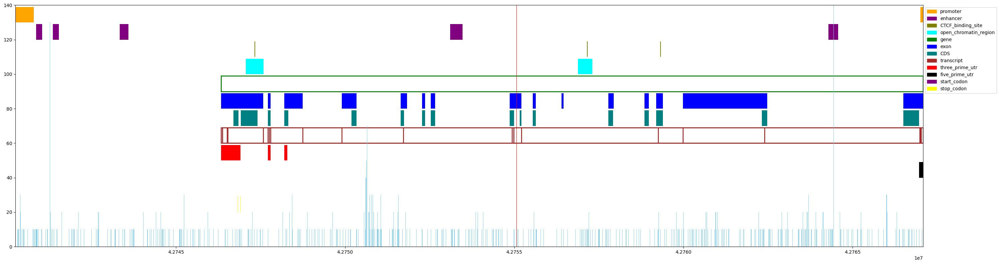

gene_#=1,exon_#=107,cds_#=54,var_#=7179,path_#=4
transcript_#=14,prime3_#=5,prime5_#=4,start_codon_#=4,stop_codon_#=4
promoter_#=2,enhancer_#=5,ctcf_#=3,open_#=2
sentence_id=72, begin=42767085, gene_start=42767245, gene_end=42892430, span=125345, prefix=160


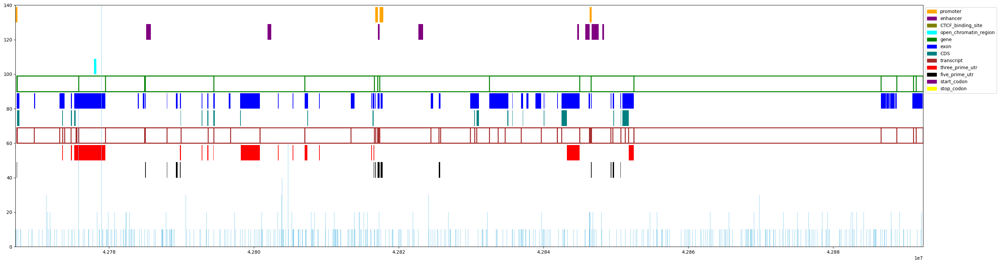

gene_#=10,exon_#=236,cds_#=68,var_#=29778,path_#=1
transcript_#=51,prime3_#=33,prime5_#=48,start_codon_#=22,stop_codon_#=19
promoter_#=4,enhancer_#=8,ctcf_#=2,open_#=1
sentence_id=73, begin=42903913, gene_start=42906004, gene_end=42958893, span=54980, prefix=2091


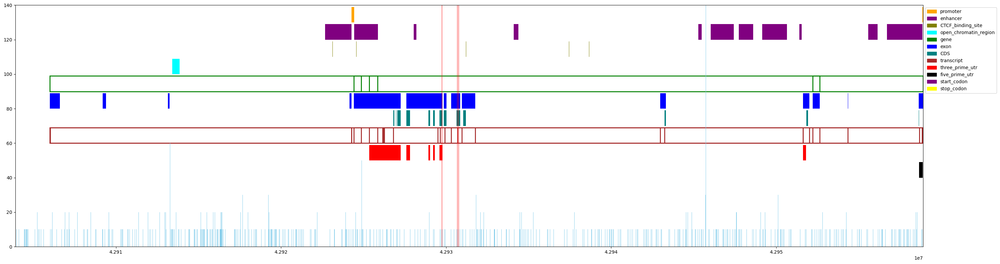

gene_#=4,exon_#=82,cds_#=33,var_#=15062,path_#=95
transcript_#=21,prime3_#=9,prime5_#=5,start_codon_#=5,stop_codon_#=5
promoter_#=2,enhancer_#=11,ctcf_#=5,open_#=1
sentence_id=74, begin=43323109, gene_start=43337818, gene_end=43358861, span=35752, prefix=14709


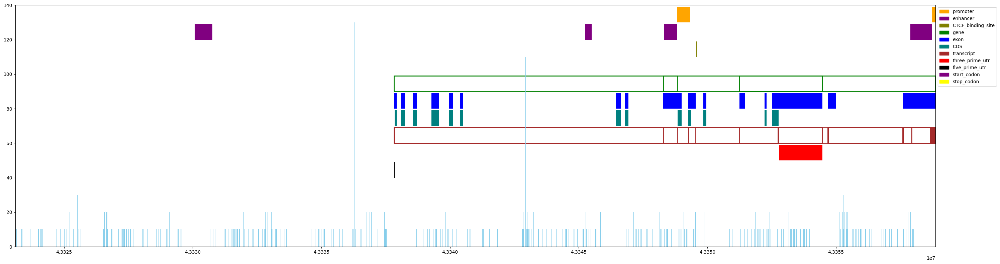

gene_#=3,exon_#=105,cds_#=28,var_#=7876,path_#=21
transcript_#=28,prime3_#=1,prime5_#=1,start_codon_#=2,stop_codon_#=2
promoter_#=2,enhancer_#=4,ctcf_#=1,open_#=0
sentence_id=75, begin=43363204, gene_start=43363398, gene_end=43389808, span=26604, prefix=194


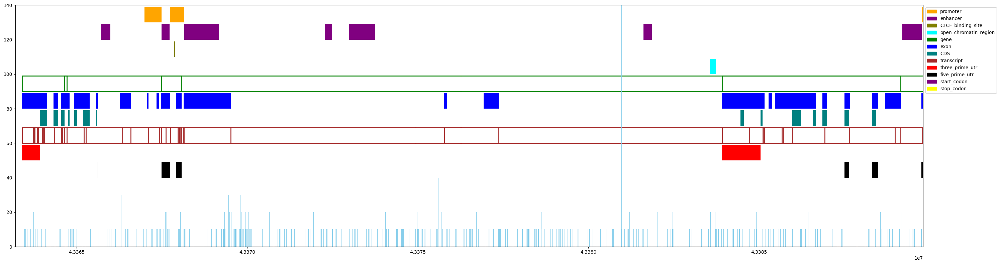

gene_#=4,exon_#=158,cds_#=40,var_#=6013,path_#=1
transcript_#=29,prime3_#=6,prime5_#=11,start_codon_#=6,stop_codon_#=6
promoter_#=3,enhancer_#=7,ctcf_#=1,open_#=1
sentence_id=76, begin=43623667, gene_start=43650149, gene_end=43931165, span=307498, prefix=26482


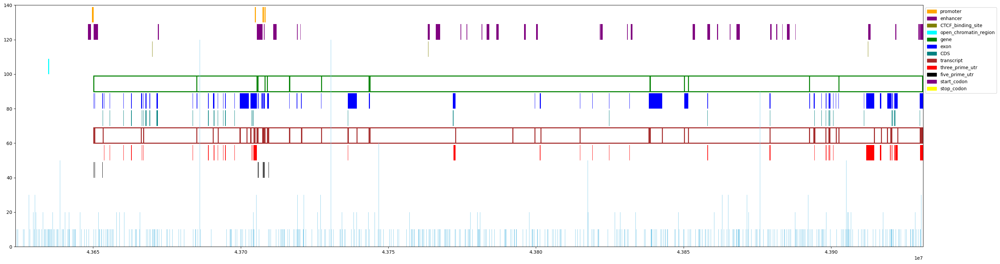

gene_#=10,exon_#=866,cds_#=550,var_#=80422,path_#=1
transcript_#=111,prime3_#=223,prime5_#=99,start_codon_#=64,stop_codon_#=76
promoter_#=4,enhancer_#=35,ctcf_#=12,open_#=1
sentence_id=77, begin=43991171, gene_start=43991359, gene_end=44115913, span=124742, prefix=188


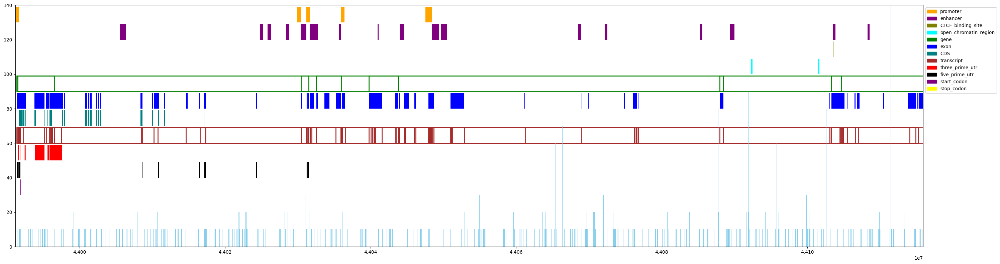

gene_#=7,exon_#=353,cds_#=115,var_#=33805,path_#=2
transcript_#=77,prime3_#=32,prime5_#=29,start_codon_#=16,stop_codon_#=13
promoter_#=5,enhancer_#=17,ctcf_#=13,open_#=2
sentence_id=78, begin=44390824, gene_start=44405194, gene_end=44674481, span=283657, prefix=14370


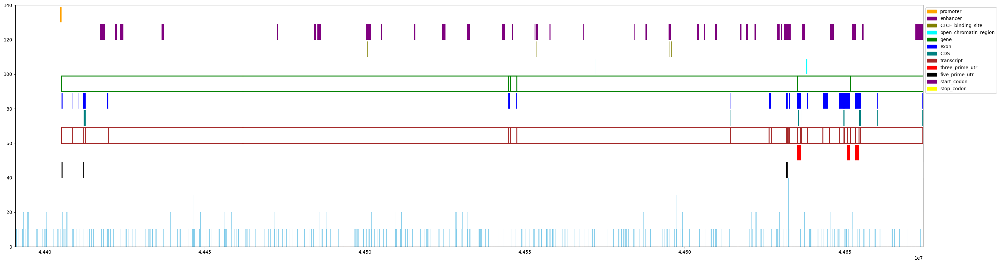

gene_#=4,exon_#=152,cds_#=75,var_#=67616,path_#=1
transcript_#=28,prime3_#=9,prime5_#=13,start_codon_#=11,stop_codon_#=8
promoter_#=2,enhancer_#=38,ctcf_#=16,open_#=2
sentence_id=79, begin=44844083, gene_start=44850522, gene_end=45015575, span=171492, prefix=6439


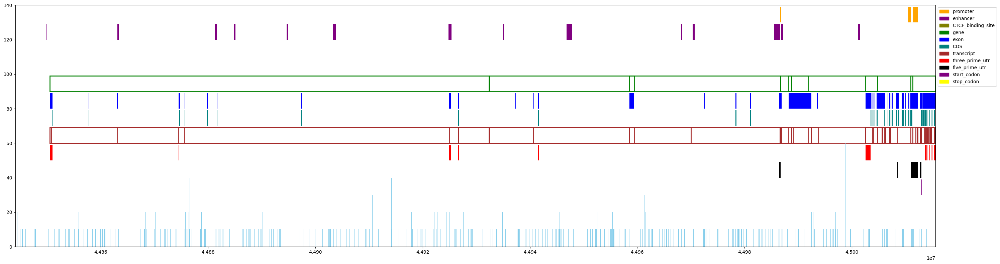

gene_#=8,exon_#=334,cds_#=176,var_#=44485,path_#=18
transcript_#=55,prime3_#=33,prime5_#=27,start_codon_#=19,stop_codon_#=18
promoter_#=3,enhancer_#=14,ctcf_#=5,open_#=0
sentence_id=80, begin=45306210, gene_start=45326895, gene_end=45328710, span=22500, prefix=20685


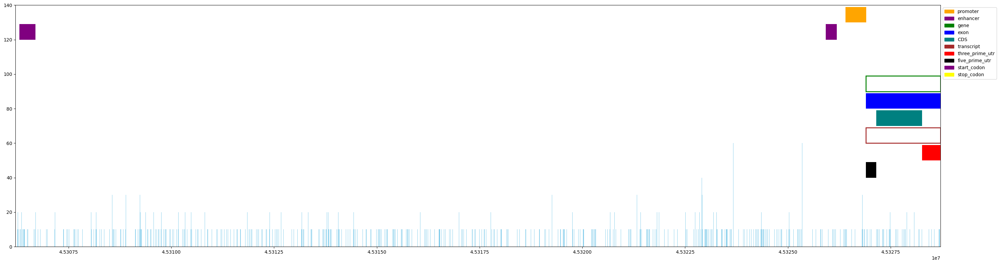

gene_#=1,exon_#=1,cds_#=1,var_#=5421,path_#=6
transcript_#=1,prime3_#=1,prime5_#=1,start_codon_#=1,stop_codon_#=1
promoter_#=1,enhancer_#=2,ctcf_#=0,open_#=0
sentence_id=81, begin=45328711, gene_start=45329163, gene_end=45491163, span=162452, prefix=452


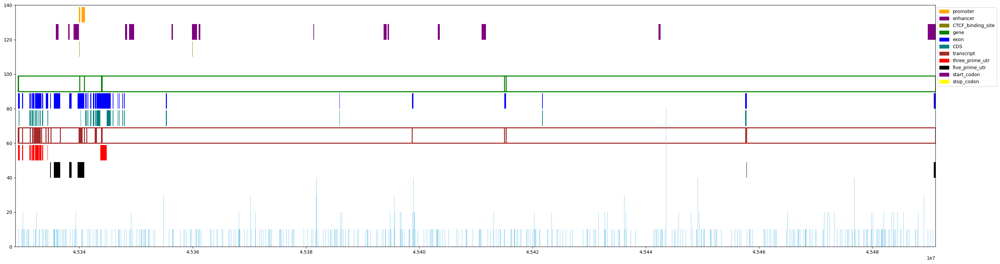

gene_#=5,exon_#=650,cds_#=404,var_#=42446,path_#=35
transcript_#=62,prime3_#=144,prime5_#=66,start_codon_#=40,stop_codon_#=40
promoter_#=3,enhancer_#=15,ctcf_#=5,open_#=0
sentence_id=82, begin=45500080, gene_start=45500300, gene_end=45542732, span=42652, prefix=220


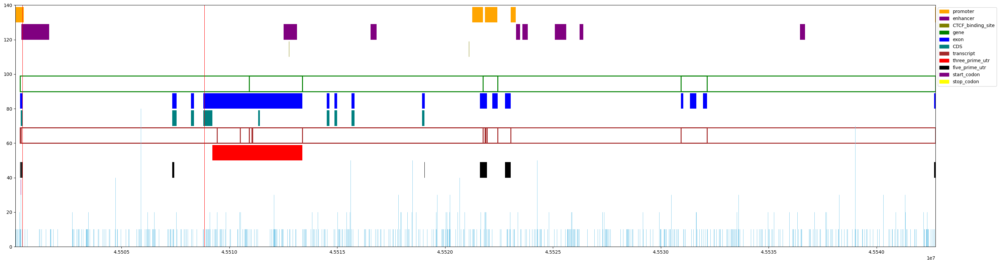

gene_#=4,exon_#=51,cds_#=36,var_#=13220,path_#=33
transcript_#=11,prime3_#=9,prime5_#=15,start_codon_#=8,stop_codon_#=8
promoter_#=5,enhancer_#=8,ctcf_#=2,open_#=0
sentence_id=83, begin=46185963, gene_start=46188683, gene_end=46221256, span=35293, prefix=2720


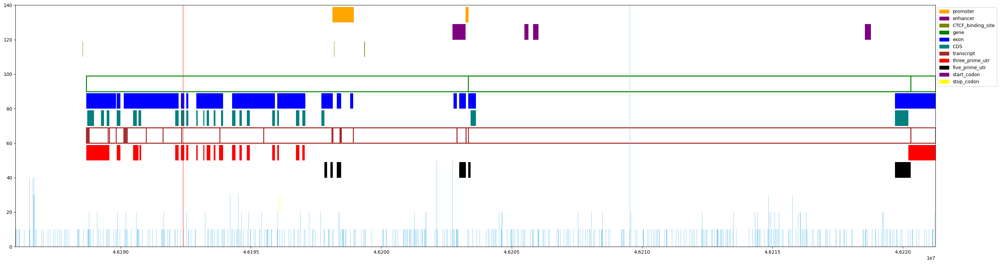

gene_#=2,exon_#=887,cds_#=295,var_#=9088,path_#=24
transcript_#=51,prime3_#=116,prime5_#=39,start_codon_#=20,stop_codon_#=20
promoter_#=2,enhancer_#=4,ctcf_#=3,open_#=0
sentence_id=84, begin=46221257, gene_start=46238447, gene_end=46303616, span=82359, prefix=17190


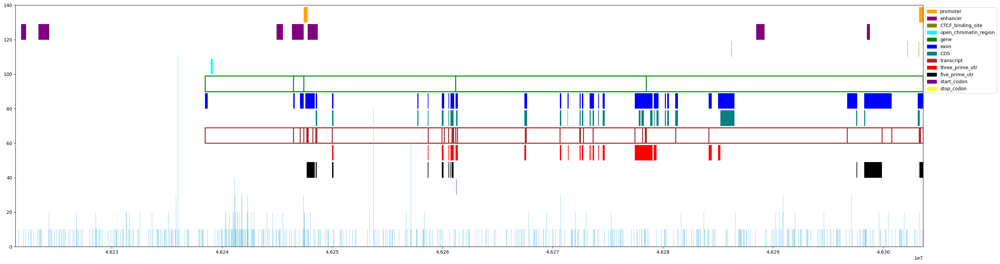

gene_#=3,exon_#=231,cds_#=148,var_#=22181,path_#=4
transcript_#=29,prime3_#=53,prime5_#=36,start_codon_#=15,stop_codon_#=17
promoter_#=2,enhancer_#=7,ctcf_#=6,open_#=1
sentence_id=85, begin=47232343, gene_start=47250139, gene_end=47314892, span=82549, prefix=17796


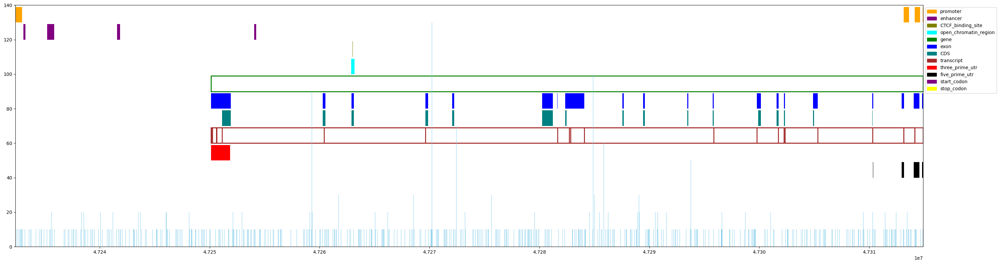

gene_#=1,exon_#=165,cds_#=123,var_#=22287,path_#=2
transcript_#=14,prime3_#=6,prime5_#=15,start_codon_#=7,stop_codon_#=7
promoter_#=4,enhancer_#=4,ctcf_#=1,open_#=1
sentence_id=86, begin=47314893, gene_start=47333790, gene_end=47434714, span=119821, prefix=18897


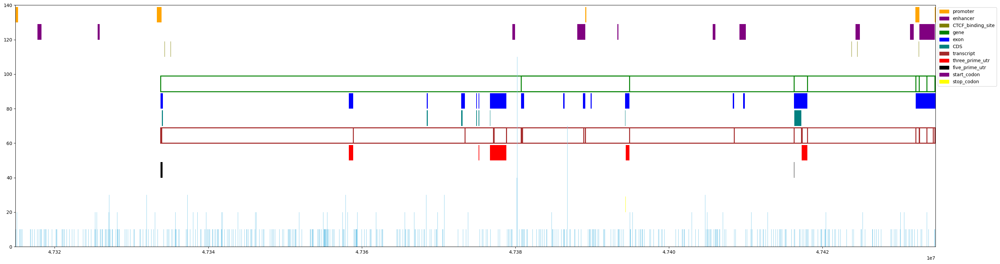

gene_#=5,exon_#=72,cds_#=30,var_#=30349,path_#=6
transcript_#=22,prime3_#=8,prime5_#=7,start_codon_#=7,stop_codon_#=7
promoter_#=5,enhancer_#=10,ctcf_#=7,open_#=0
sentence_id=87, begin=52369701, gene_start=52372829, gene_end=52404423, span=34722, prefix=3128


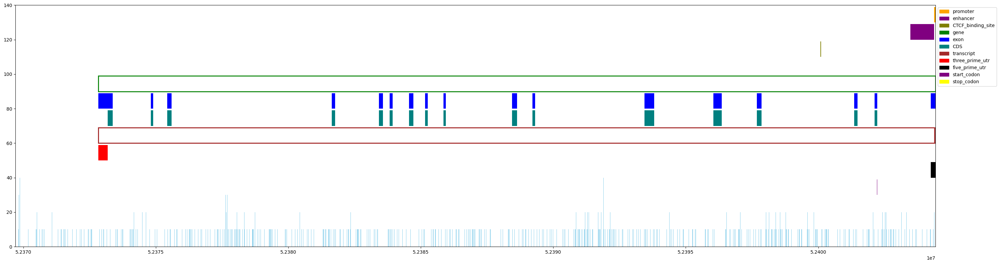

gene_#=1,exon_#=34,cds_#=32,var_#=8271,path_#=5
transcript_#=2,prime3_#=2,prime5_#=4,start_codon_#=2,stop_codon_#=2
promoter_#=1,enhancer_#=1,ctcf_#=1,open_#=0
sentence_id=88, begin=52669684, gene_start=52684449, gene_end=52698347, span=28663, prefix=14765


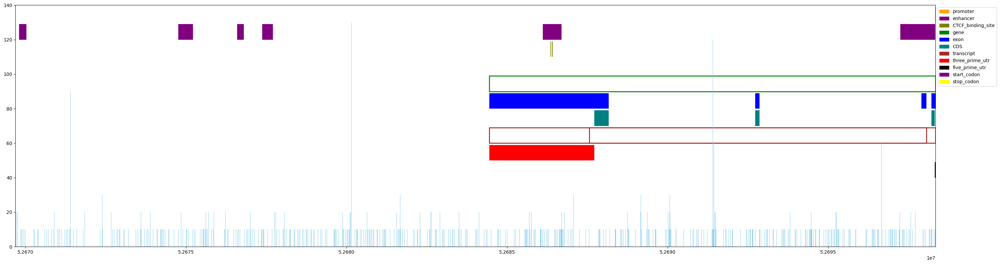

gene_#=1,exon_#=6,cds_#=3,var_#=7216,path_#=1
transcript_#=2,prime3_#=1,prime5_#=1,start_codon_#=1,stop_codon_#=1
promoter_#=1,enhancer_#=6,ctcf_#=2,open_#=0
sentence_id=89, begin=53191510, gene_start=53196792, gene_end=53220634, span=29124, prefix=5282


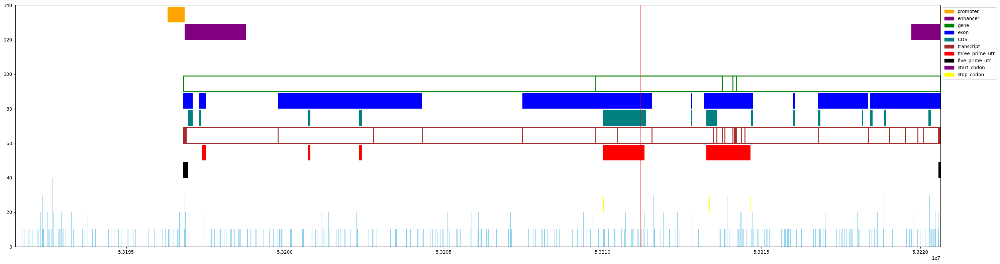

gene_#=3,exon_#=84,cds_#=46,var_#=7030,path_#=29
transcript_#=21,prime3_#=15,prime5_#=10,start_codon_#=10,stop_codon_#=10
promoter_#=2,enhancer_#=2,ctcf_#=0,open_#=0
sentence_id=90, begin=54742658, gene_start=54756898, gene_end=54764523, span=21865, prefix=14240


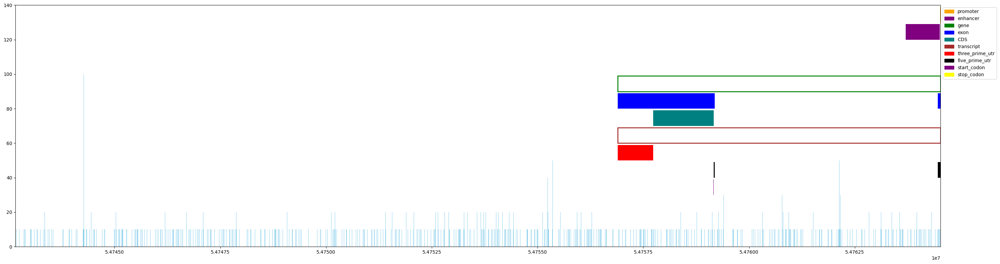

gene_#=1,exon_#=2,cds_#=1,var_#=5377,path_#=2
transcript_#=1,prime3_#=1,prime5_#=2,start_codon_#=1,stop_codon_#=1
promoter_#=1,enhancer_#=1,ctcf_#=0,open_#=0
sentence_id=91, begin=54842253, gene_start=54849627, gene_end=54992296, span=150043, prefix=7374


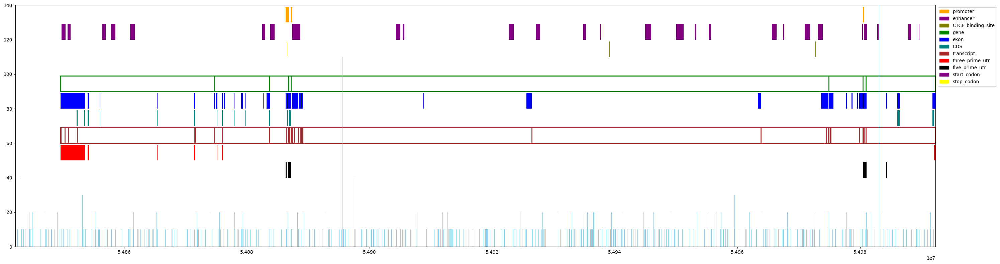

gene_#=6,exon_#=171,cds_#=58,var_#=38287,path_#=5
transcript_#=37,prime3_#=32,prime5_#=17,start_codon_#=13,stop_codon_#=11
promoter_#=3,enhancer_#=27,ctcf_#=10,open_#=0
sentence_id=92, begin=54997408, gene_start=54998933, gene_end=55017172, span=19764, prefix=1525


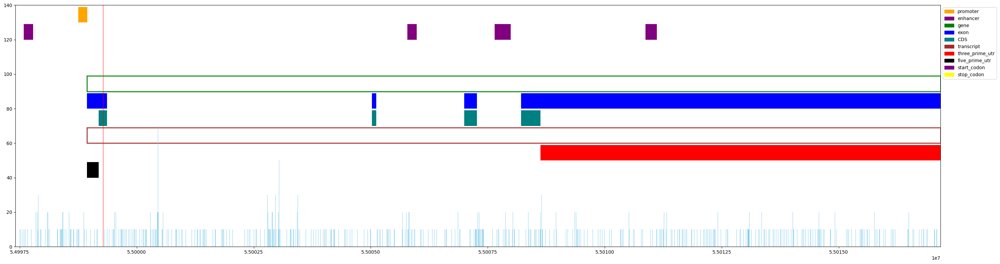

gene_#=1,exon_#=4,cds_#=4,var_#=4548,path_#=6
transcript_#=1,prime3_#=1,prime5_#=1,start_codon_#=1,stop_codon_#=1
promoter_#=1,enhancer_#=4,ctcf_#=0,open_#=0
sentence_id=93, begin=55017173, gene_start=55039445, gene_end=55064852, span=47679, prefix=22272


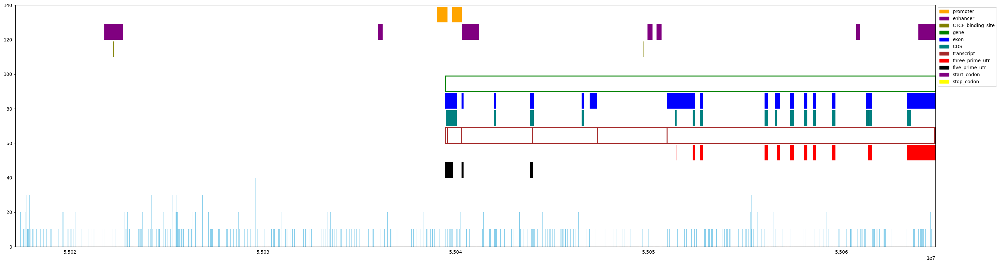

gene_#=1,exon_#=108,cds_#=72,var_#=12009,path_#=14
transcript_#=10,prime3_#=32,prime5_#=9,start_codon_#=8,stop_codon_#=8
promoter_#=2,enhancer_#=7,ctcf_#=2,open_#=0
sentence_id=94, begin=60658166, gene_start=60659631, gene_end=61462788, span=804622, prefix=1465


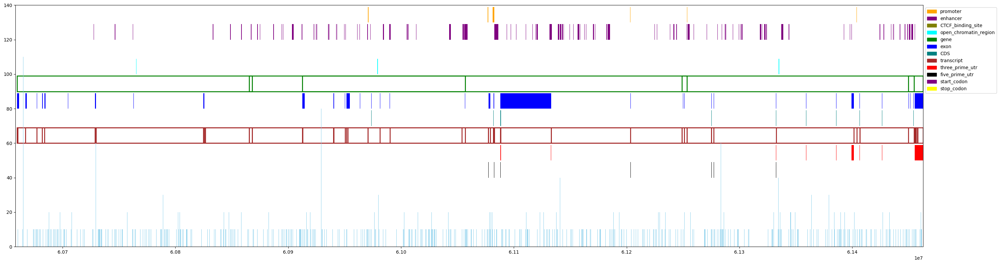

gene_#=5,exon_#=447,cds_#=225,var_#=198021,path_#=5
transcript_#=63,prime3_#=59,prime5_#=38,start_codon_#=26,stop_codon_#=27
promoter_#=7,enhancer_#=113,ctcf_#=23,open_#=4
sentence_id=95, begin=62451805, gene_start=62454298, gene_end=62688386, span=236581, prefix=2493


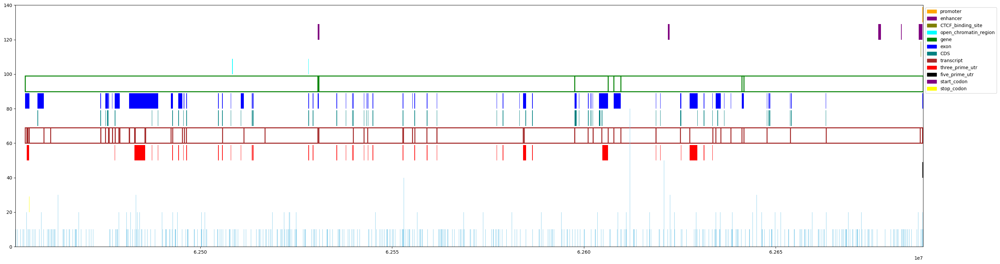

gene_#=5,exon_#=517,cds_#=403,var_#=57482,path_#=1
transcript_#=43,prime3_#=50,prime5_#=5,start_codon_#=9,stop_codon_#=14
promoter_#=1,enhancer_#=5,ctcf_#=3,open_#=2
sentence_id=96, begin=63079032, gene_start=63139250, gene_end=63660245, span=581213, prefix=60218


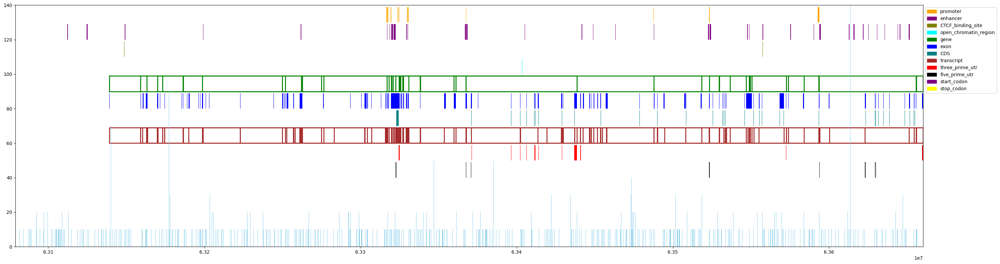

gene_#=33,exon_#=956,cds_#=133,var_#=144291,path_#=10
transcript_#=192,prime3_#=54,prime5_#=27,start_codon_#=16,stop_codon_#=16
promoter_#=13,enhancer_#=38,ctcf_#=16,open_#=2
sentence_id=97, begin=64693059, gene_start=64745075, gene_end=65067754, span=374695, prefix=52016


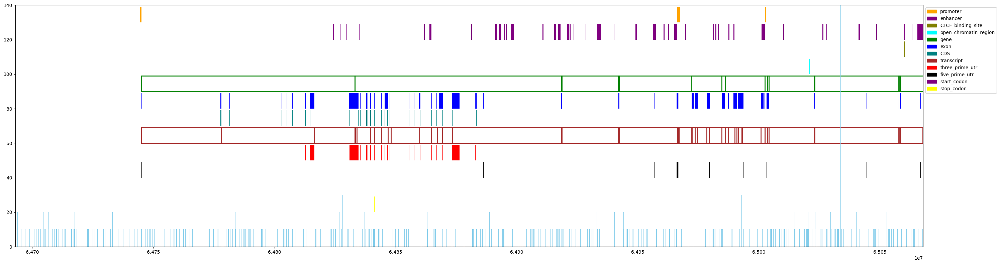

gene_#=10,exon_#=805,cds_#=468,var_#=89186,path_#=2
transcript_#=63,prime3_#=101,prime5_#=71,start_codon_#=26,stop_codon_#=26
promoter_#=4,enhancer_#=45,ctcf_#=11,open_#=1
sentence_id=98, begin=65416007, gene_start=65420587, gene_end=65641559, span=225552, prefix=4580


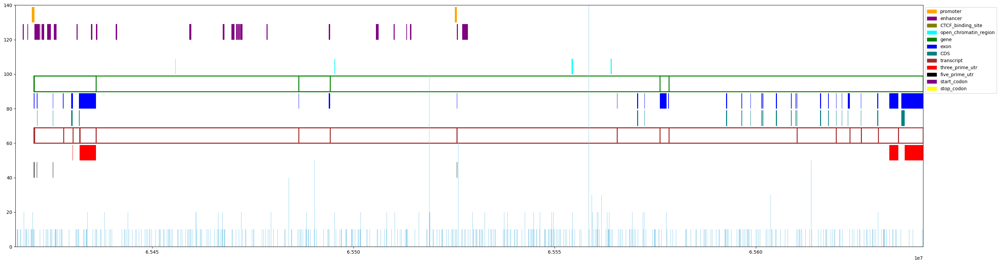

gene_#=4,exon_#=158,cds_#=126,var_#=56857,path_#=2
transcript_#=16,prime3_#=11,prime5_#=20,start_codon_#=11,stop_codon_#=11
promoter_#=2,enhancer_#=25,ctcf_#=8,open_#=4
sentence_id=99, begin=66988620, gene_start=66999350, gene_end=67054148, span=65528, prefix=10730


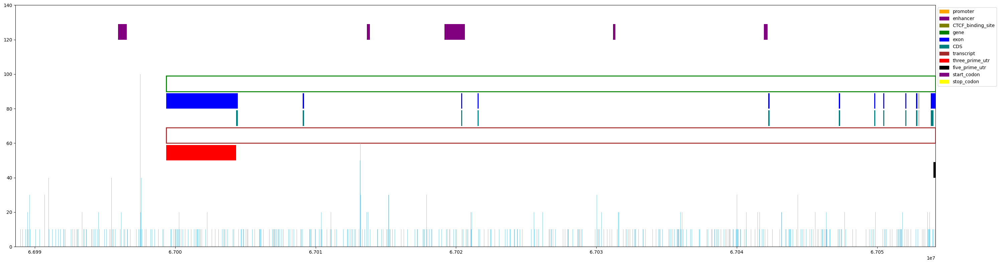

gene_#=1,exon_#=12,cds_#=12,var_#=17177,path_#=1
transcript_#=1,prime3_#=1,prime5_#=1,start_codon_#=1,stop_codon_#=1
promoter_#=1,enhancer_#=5,ctcf_#=1,open_#=0
sentence_id=100, begin=67700912, gene_start=67701475, gene_end=68233120, span=532208, prefix=563


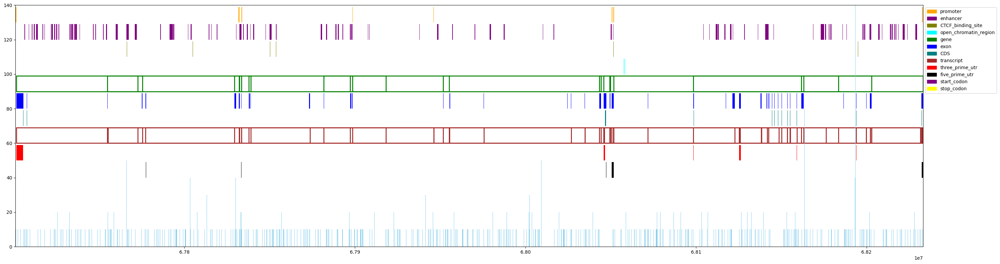

gene_#=15,exon_#=169,cds_#=63,var_#=129164,path_#=4
transcript_#=43,prime3_#=13,prime5_#=28,start_codon_#=14,stop_codon_#=10
promoter_#=9,enhancer_#=98,ctcf_#=21,open_#=3
sentence_id=101, begin=68391957, gene_start=68428822, gene_end=68451103, span=59146, prefix=36865


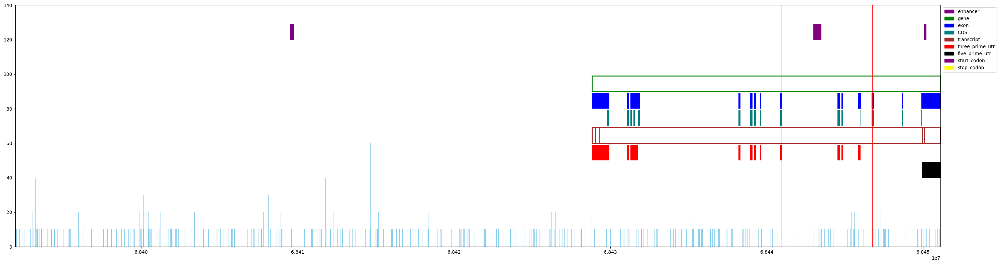

gene_#=1,exon_#=68,cds_#=39,var_#=13980,path_#=91
transcript_#=5,prime3_#=34,prime5_#=5,start_codon_#=5,stop_codon_#=5
promoter_#=0,enhancer_#=3,ctcf_#=0,open_#=0
sentence_id=102, begin=74198188, gene_start=74198235, gene_end=74544428, span=346240, prefix=47


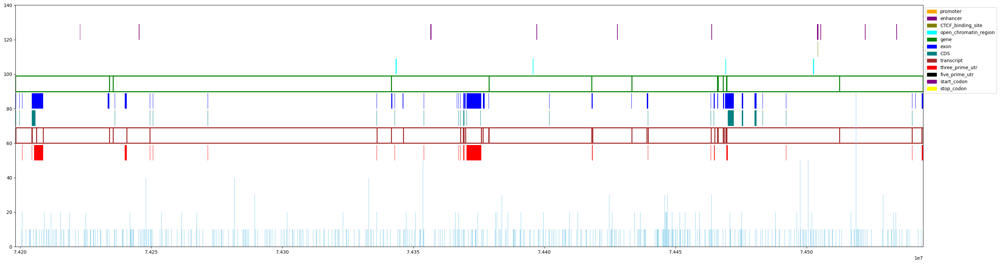

gene_#=8,exon_#=221,cds_#=157,var_#=86557,path_#=5
transcript_#=30,prime3_#=41,prime5_#=15,start_codon_#=14,stop_codon_#=15
promoter_#=1,enhancer_#=10,ctcf_#=5,open_#=4
sentence_id=103, begin=75615914, gene_start=75641178, gene_end=75795086, span=179172, prefix=25264


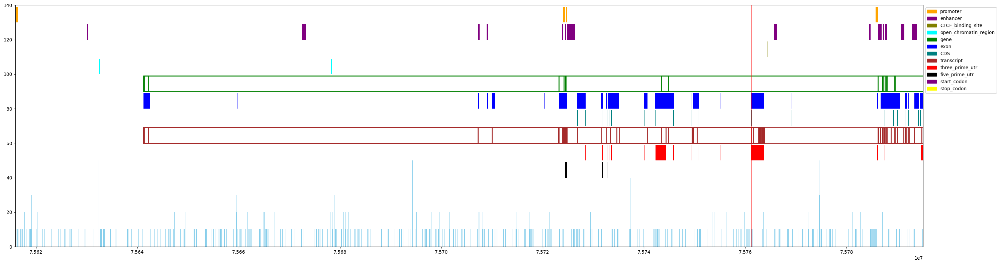

gene_#=9,exon_#=709,cds_#=242,var_#=49720,path_#=120
transcript_#=91,prime3_#=239,prime5_#=45,start_codon_#=42,stop_codon_#=44
promoter_#=4,enhancer_#=14,ctcf_#=3,open_#=2
sentence_id=104, begin=75795087, gene_start=75796882, gene_end=75913242, span=118155, prefix=1795


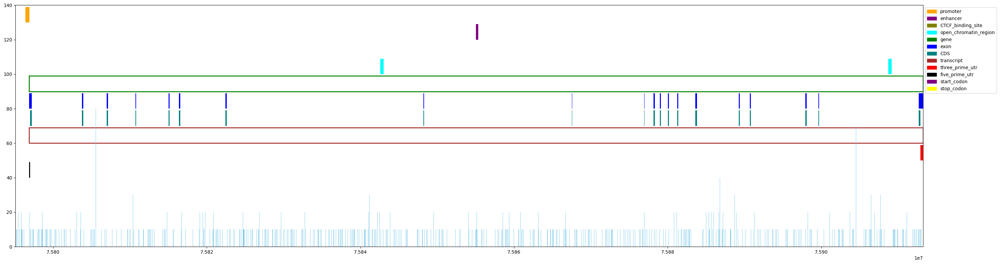

gene_#=1,exon_#=20,cds_#=20,var_#=31770,path_#=1
transcript_#=1,prime3_#=1,prime5_#=1,start_codon_#=1,stop_codon_#=1
promoter_#=1,enhancer_#=1,ctcf_#=1,open_#=2
sentence_id=105, begin=77879541, gene_start=77881348, gene_end=77943895, span=64354, prefix=1807


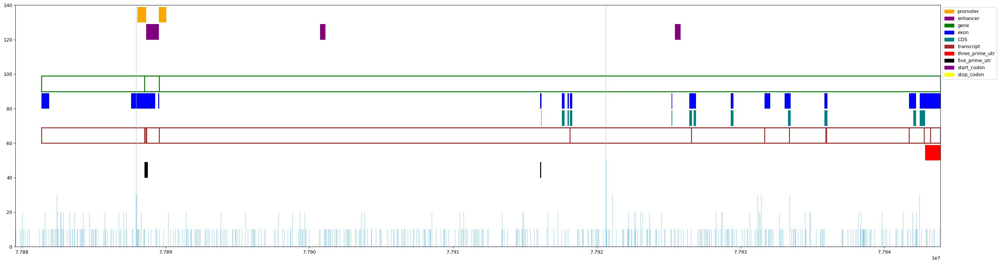

gene_#=2,exon_#=68,cds_#=50,var_#=17761,path_#=1
transcript_#=9,prime3_#=3,prime5_#=8,start_codon_#=4,stop_codon_#=3
promoter_#=2,enhancer_#=3,ctcf_#=0,open_#=0
sentence_id=106, begin=84065032, gene_start=84076329, gene_end=84238498, span=173466, prefix=11297


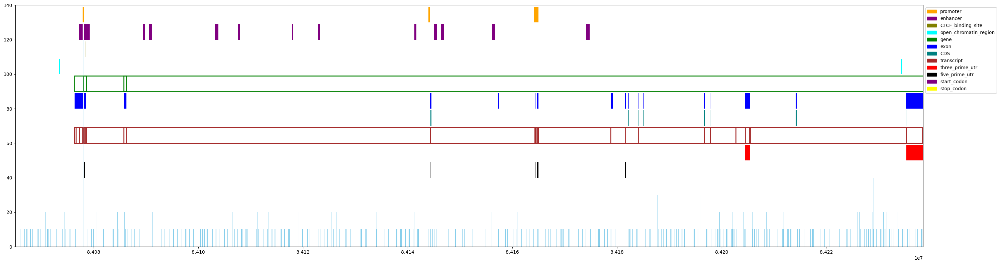

gene_#=3,exon_#=181,cds_#=151,var_#=40305,path_#=1
transcript_#=28,prime3_#=11,prime5_#=15,start_codon_#=15,stop_codon_#=11
promoter_#=3,enhancer_#=13,ctcf_#=5,open_#=2
sentence_id=107, begin=90893613, gene_start=90915298, gene_end=91022272, span=128659, prefix=21685


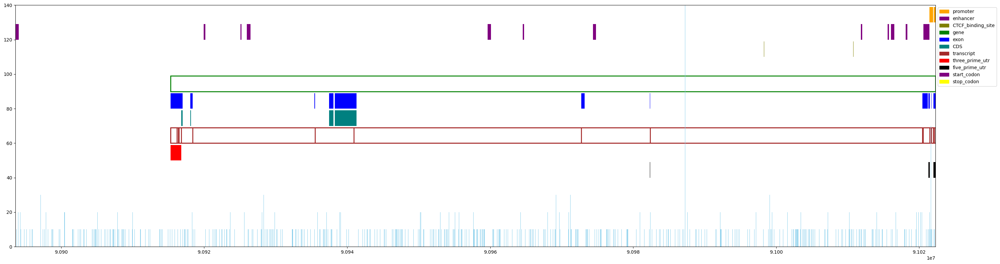

gene_#=1,exon_#=39,cds_#=16,var_#=31592,path_#=1
transcript_#=11,prime3_#=4,prime5_#=8,start_codon_#=4,stop_codon_#=4
promoter_#=2,enhancer_#=12,ctcf_#=4,open_#=0
sentence_id=108, begin=92441959, gene_start=92473043, gene_end=92486925, span=44966, prefix=31084


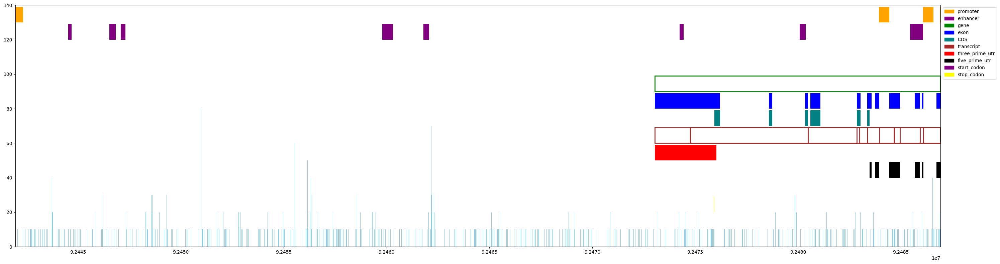

gene_#=1,exon_#=35,cds_#=24,var_#=11872,path_#=1
transcript_#=9,prime3_#=4,prime5_#=12,start_codon_#=6,stop_codon_#=4
promoter_#=4,enhancer_#=8,ctcf_#=0,open_#=0
sentence_id=109, begin=92792405, gene_start=92832013, gene_end=92965341, span=172936, prefix=39608


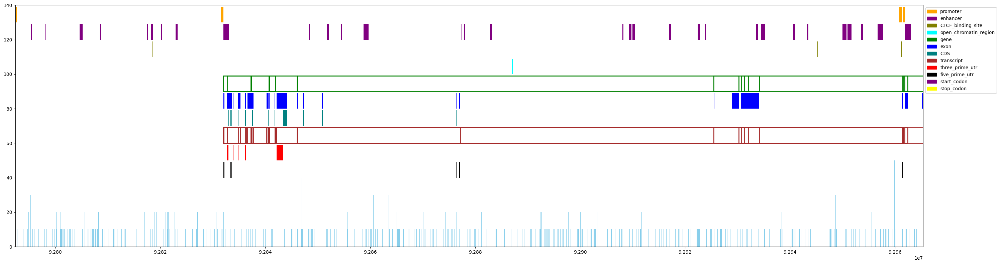

gene_#=10,exon_#=84,cds_#=49,var_#=44612,path_#=2
transcript_#=24,prime3_#=10,prime5_#=14,start_codon_#=10,stop_codon_#=8
promoter_#=4,enhancer_#=32,ctcf_#=15,open_#=1
sentence_id=110, begin=93967167, gene_start=93992834, gene_end=94121148, span=153981, prefix=25667


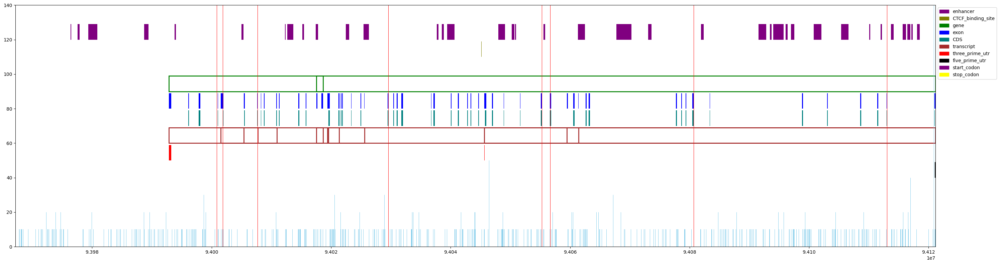

gene_#=2,exon_#=91,cds_#=69,var_#=35490,path_#=605
transcript_#=8,prime3_#=2,prime5_#=2,start_codon_#=2,stop_codon_#=2
promoter_#=0,enhancer_#=37,ctcf_#=9,open_#=0
sentence_id=111, begin=94895247, gene_start=94896949, gene_end=95072951, span=177704, prefix=1702


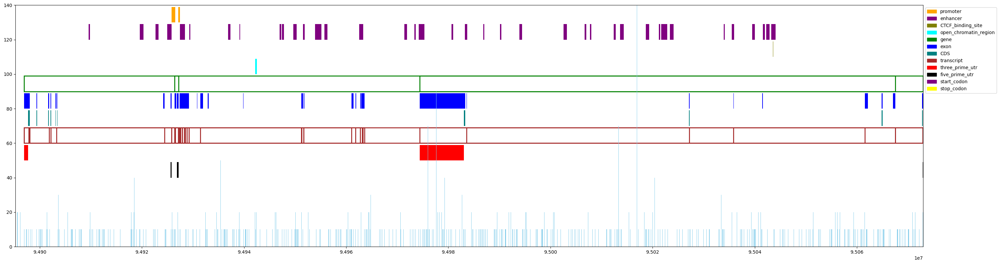

gene_#=3,exon_#=214,cds_#=29,var_#=41854,path_#=1
transcript_#=58,prime3_#=4,prime5_#=7,start_codon_#=5,stop_codon_#=4
promoter_#=3,enhancer_#=38,ctcf_#=3,open_#=1
sentence_id=112, begin=96995540, gene_start=97047057, gene_end=98131726, span=1136186, prefix=51517


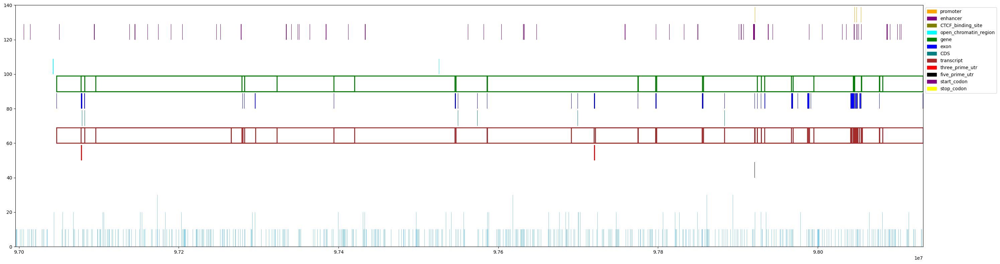

gene_#=19,exon_#=134,cds_#=29,var_#=285420,path_#=1
transcript_#=45,prime3_#=2,prime5_#=2,start_codon_#=2,stop_codon_#=2
promoter_#=6,enhancer_#=71,ctcf_#=16,open_#=5
sentence_id=113, begin=99842762, gene_start=99850361, gene_end=100132955, span=290193, prefix=7599


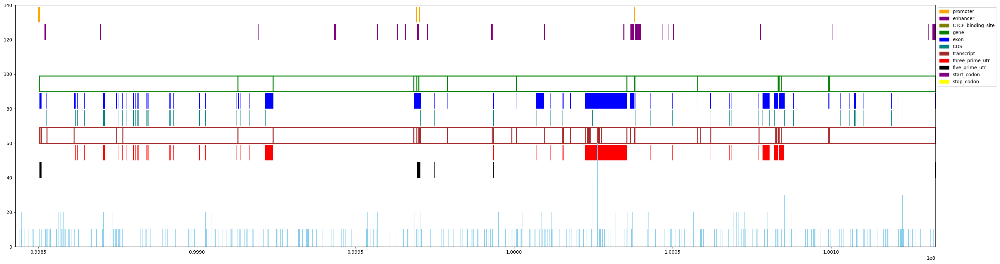

gene_#=11,exon_#=615,cds_#=364,var_#=71492,path_#=16
transcript_#=56,prime3_#=160,prime5_#=72,start_codon_#=38,stop_codon_#=38
promoter_#=5,enhancer_#=21,ctcf_#=2,open_#=0
sentence_id=114, begin=100132956, gene_start=100133150, gene_end=100266182, span=133226, prefix=194


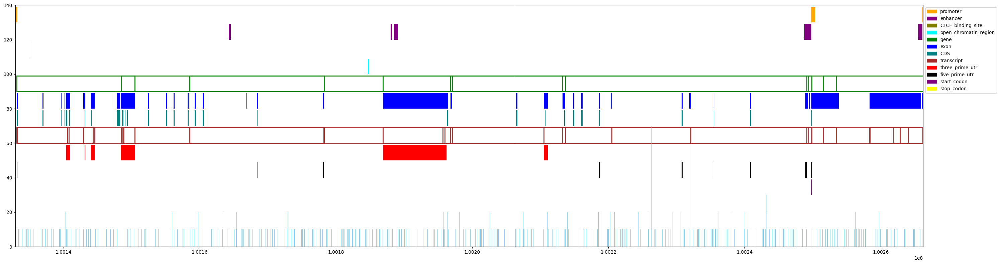

gene_#=8,exon_#=137,cds_#=90,var_#=30310,path_#=26
transcript_#=23,prime3_#=14,prime5_#=21,start_codon_#=11,stop_codon_#=11
promoter_#=3,enhancer_#=5,ctcf_#=2,open_#=1
sentence_id=115, begin=100292770, gene_start=100325629, gene_end=100526247, span=233477, prefix=32859


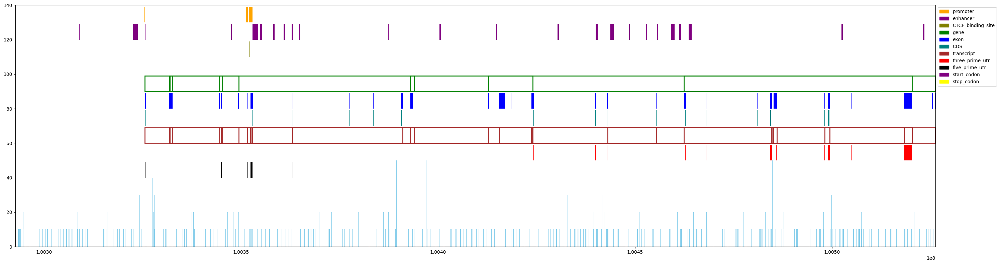

gene_#=7,exon_#=208,cds_#=153,var_#=52907,path_#=4
transcript_#=23,prime3_#=33,prime5_#=22,start_codon_#=13,stop_codon_#=12
promoter_#=3,enhancer_#=25,ctcf_#=8,open_#=0
sentence_id=116, begin=100895360, gene_start=100896076, gene_end=101090513, span=195153, prefix=716


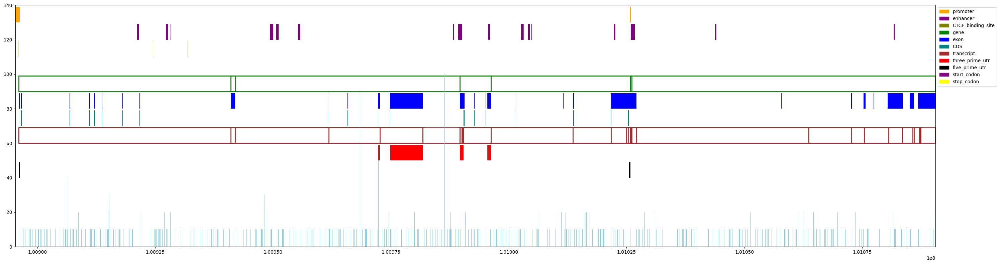

gene_#=4,exon_#=291,cds_#=64,var_#=42742,path_#=2
transcript_#=53,prime3_#=11,prime5_#=10,start_codon_#=7,stop_codon_#=8
promoter_#=2,enhancer_#=17,ctcf_#=4,open_#=0
sentence_id=117, begin=102853843, gene_start=102876467, gene_end=103108872, span=255029, prefix=22624


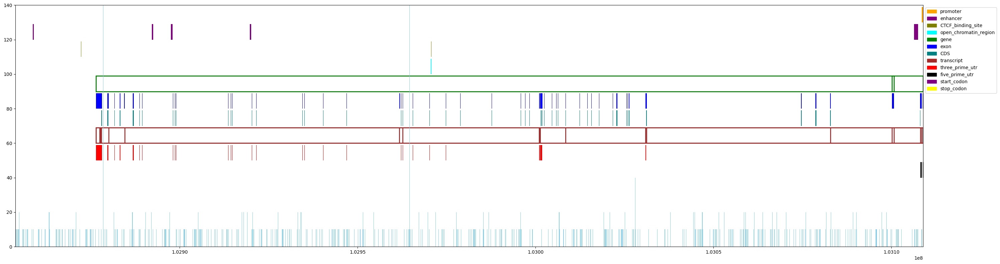

gene_#=2,exon_#=460,cds_#=416,var_#=66149,path_#=21
transcript_#=15,prime3_#=42,prime5_#=9,start_codon_#=9,stop_codon_#=10
promoter_#=1,enhancer_#=5,ctcf_#=4,open_#=1
sentence_id=118, begin=108076021, gene_start=108126726, gene_end=108201491, span=125470, prefix=50705


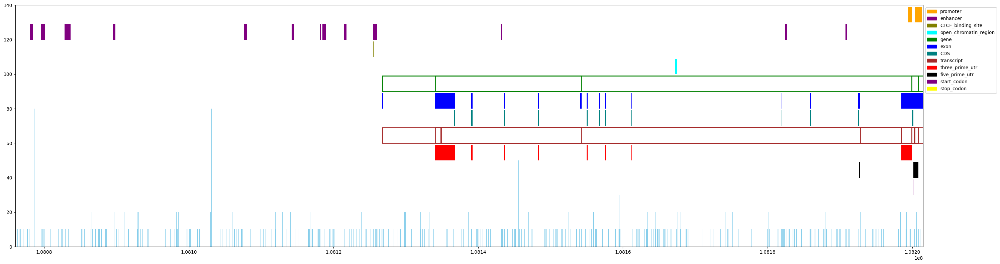

gene_#=3,exon_#=44,cds_#=30,var_#=31193,path_#=3
transcript_#=7,prime3_#=16,prime5_#=5,start_codon_#=5,stop_codon_#=5
promoter_#=3,enhancer_#=13,ctcf_#=2,open_#=1
sentence_id=119, begin=108809524, gene_start=108813565, gene_end=108963527, span=154003, prefix=4041


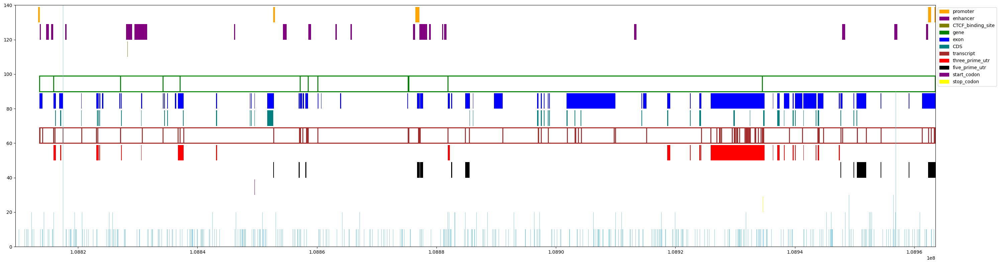

gene_#=7,exon_#=1378,cds_#=967,var_#=38560,path_#=1
transcript_#=133,prime3_#=231,prime5_#=249,start_codon_#=100,stop_codon_#=100
promoter_#=5,enhancer_#=20,ctcf_#=4,open_#=0
sentence_id=120, begin=109047483, gene_start=109062496, gene_end=109076012, span=28529, prefix=15013


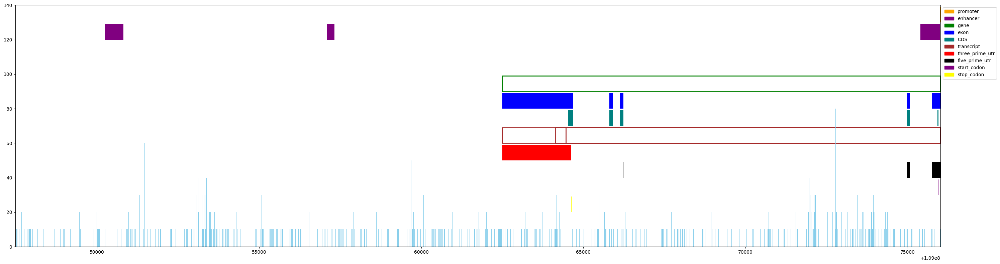

gene_#=1,exon_#=13,cds_#=11,var_#=9733,path_#=2
transcript_#=3,prime3_#=3,prime5_#=5,start_codon_#=3,stop_codon_#=3
promoter_#=1,enhancer_#=3,ctcf_#=0,open_#=0
sentence_id=121, begin=109206782, gene_start=109213918, gene_end=109238182, span=31400, prefix=7136


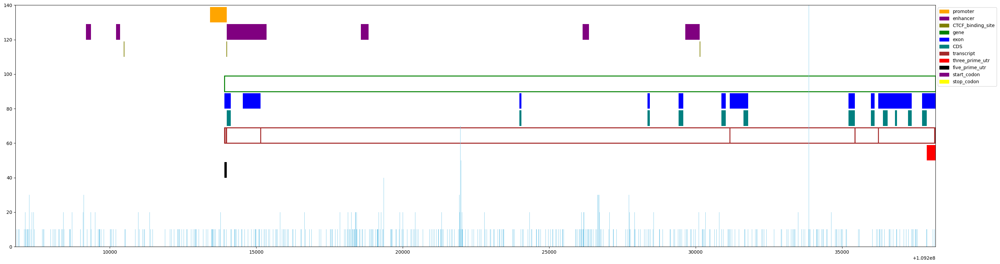

gene_#=1,exon_#=34,cds_#=23,var_#=8629,path_#=1
transcript_#=6,prime3_#=2,prime5_#=2,start_codon_#=2,stop_codon_#=2
promoter_#=1,enhancer_#=6,ctcf_#=3,open_#=0
sentence_id=122, begin=109548537, gene_start=109548615, gene_end=109600195, span=51658, prefix=78


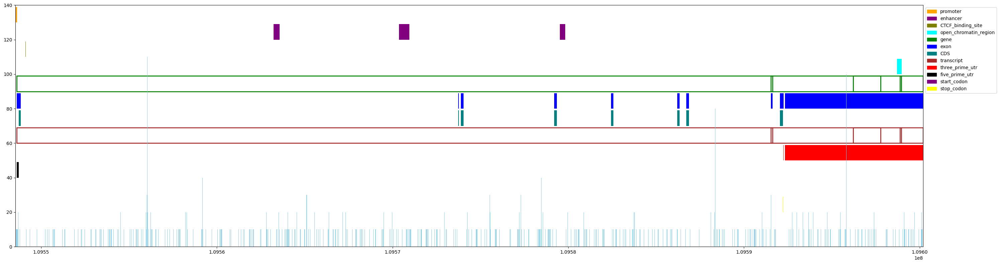

gene_#=4,exon_#=13,cds_#=8,var_#=11581,path_#=4
transcript_#=4,prime3_#=2,prime5_#=1,start_codon_#=1,stop_codon_#=1
promoter_#=1,enhancer_#=3,ctcf_#=1,open_#=1
sentence_id=123, begin=109600196, gene_start=109603091, gene_end=109632051, span=31855, prefix=2895


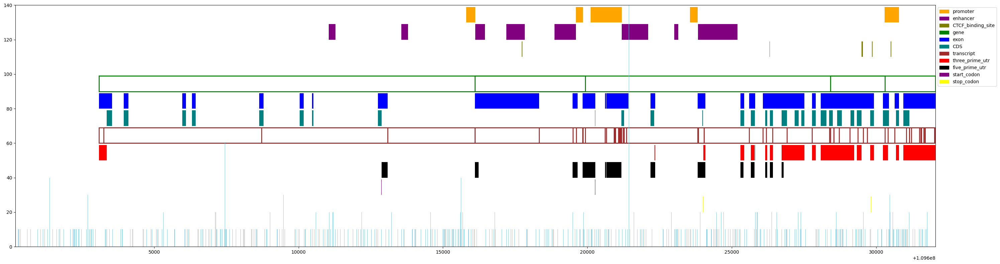

gene_#=3,exon_#=794,cds_#=278,var_#=6810,path_#=3
transcript_#=60,prime3_#=322,prime5_#=48,start_codon_#=36,stop_codon_#=36
promoter_#=5,enhancer_#=8,ctcf_#=5,open_#=0
sentence_id=124, begin=110495623, gene_start=110507733, gene_end=110631474, span=135851, prefix=12110


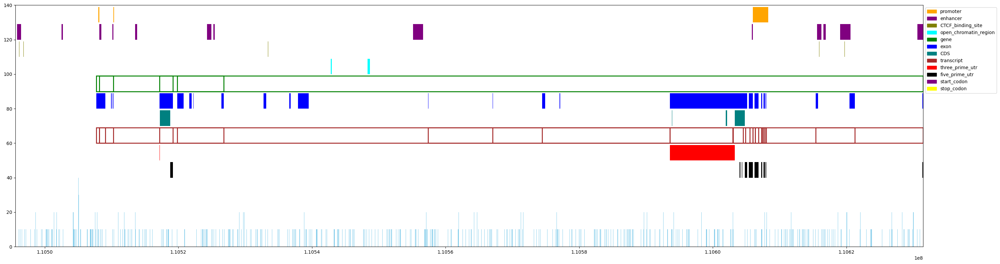

gene_#=4,exon_#=64,cds_#=17,var_#=31934,path_#=38
transcript_#=21,prime3_#=13,prime5_#=34,start_codon_#=13,stop_codon_#=13
promoter_#=4,enhancer_#=13,ctcf_#=11,open_#=2
sentence_id=125, begin=111041926, gene_start=111117163, gene_end=111185104, span=143178, prefix=75237


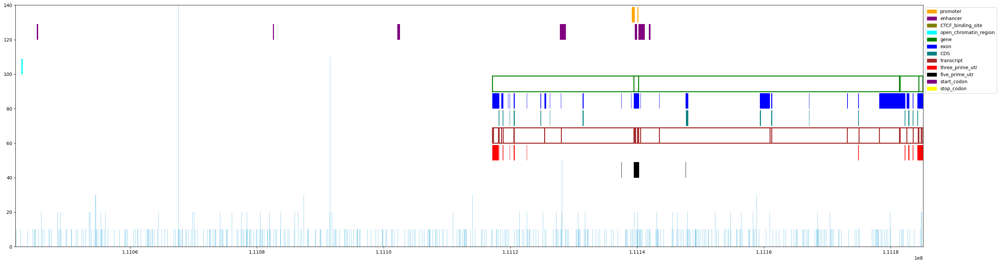

gene_#=4,exon_#=157,cds_#=56,var_#=34566,path_#=3
transcript_#=25,prime3_#=20,prime5_#=23,start_codon_#=9,stop_codon_#=10
promoter_#=2,enhancer_#=7,ctcf_#=1,open_#=1
sentence_id=126, begin=111478513, gene_start=111483348, gene_end=111989668, span=511155, prefix=4835


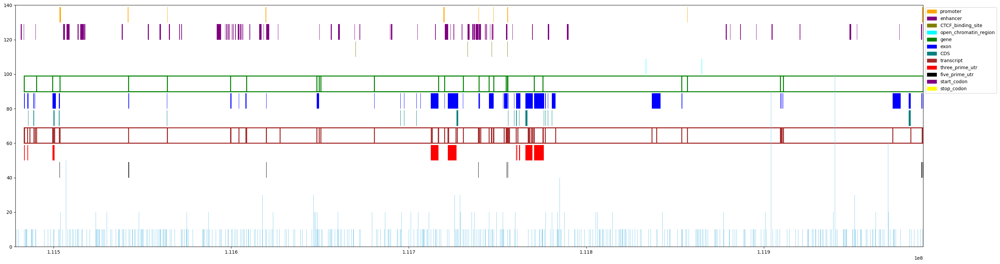

gene_#=15,exon_#=352,cds_#=139,var_#=120334,path_#=21
transcript_#=65,prime3_#=51,prime5_#=29,start_codon_#=22,stop_codon_#=24
promoter_#=12,enhancer_#=70,ctcf_#=28,open_#=2
sentence_id=127, begin=112762627, gene_start=112820170, gene_end=113073113, span=310486, prefix=57543


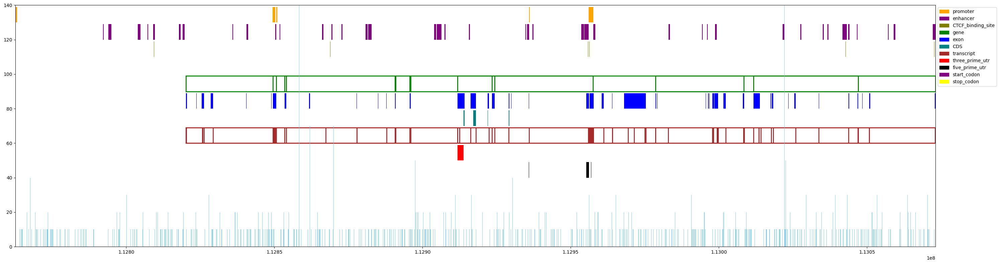

gene_#=9,exon_#=338,cds_#=24,var_#=95203,path_#=1
transcript_#=90,prime3_#=6,prime5_#=13,start_codon_#=6,stop_codon_#=6
promoter_#=8,enhancer_#=40,ctcf_#=13,open_#=0
sentence_id=128, begin=113759490, gene_start=113761832, gene_end=113977869, span=218379, prefix=2342


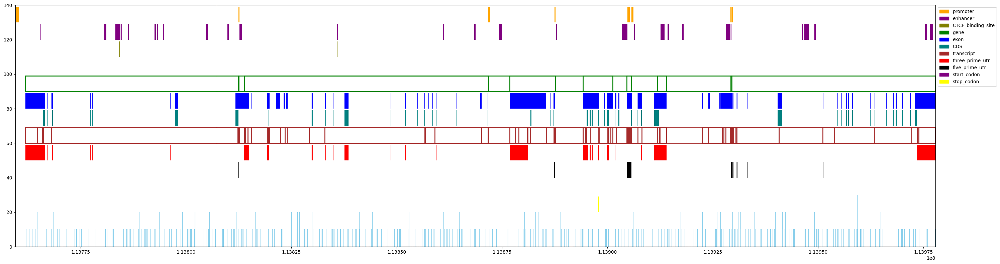

gene_#=8,exon_#=640,cds_#=407,var_#=51290,path_#=3
transcript_#=91,prime3_#=105,prime5_#=69,start_codon_#=47,stop_codon_#=46
promoter_#=9,enhancer_#=29,ctcf_#=12,open_#=0
sentence_id=129, begin=114697925, gene_start=114704469, gene_end=114716771, span=18846, prefix=6544


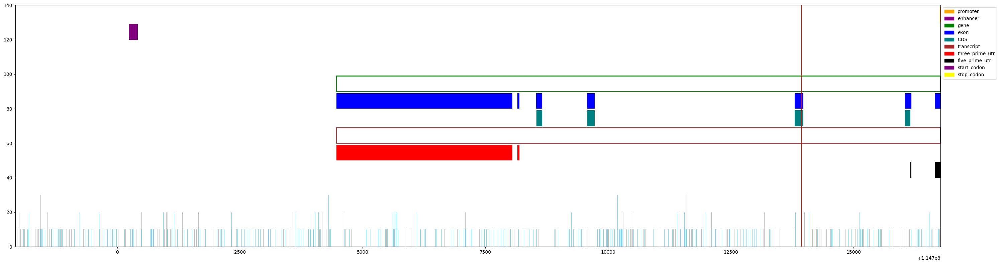

gene_#=1,exon_#=7,cds_#=4,var_#=4250,path_#=20
transcript_#=1,prime3_#=3,prime5_#=2,start_codon_#=1,stop_codon_#=1
promoter_#=1,enhancer_#=1,ctcf_#=0,open_#=0
sentence_id=130, begin=115190822, gene_start=115229326, gene_end=115373541, span=182719, prefix=38504


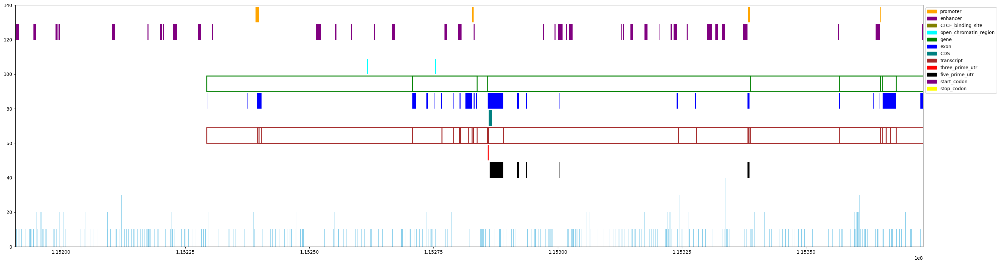

gene_#=5,exon_#=67,cds_#=8,var_#=44656,path_#=1
transcript_#=23,prime3_#=8,prime5_#=23,start_codon_#=8,stop_codon_#=8
promoter_#=5,enhancer_#=39,ctcf_#=3,open_#=2
sentence_id=131, begin=115622006, gene_start=115641970, gene_end=115843917, span=221911, prefix=19964


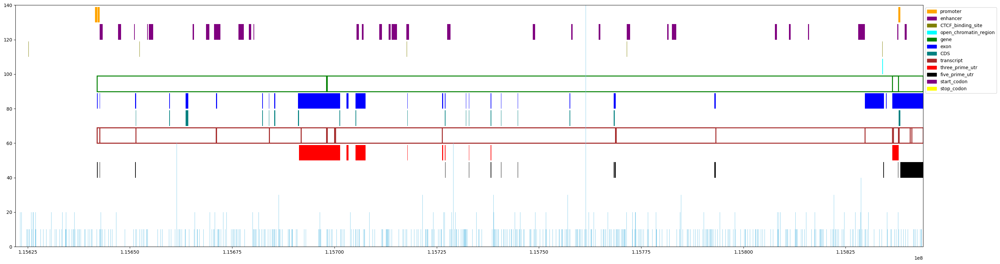

gene_#=3,exon_#=148,cds_#=104,var_#=57567,path_#=5
transcript_#=19,prime3_#=30,prime5_#=35,start_codon_#=16,stop_codon_#=15
promoter_#=3,enhancer_#=30,ctcf_#=18,open_#=1
sentence_id=132, begin=116361949, gene_start=116372668, gene_end=116421301, span=59352, prefix=10719


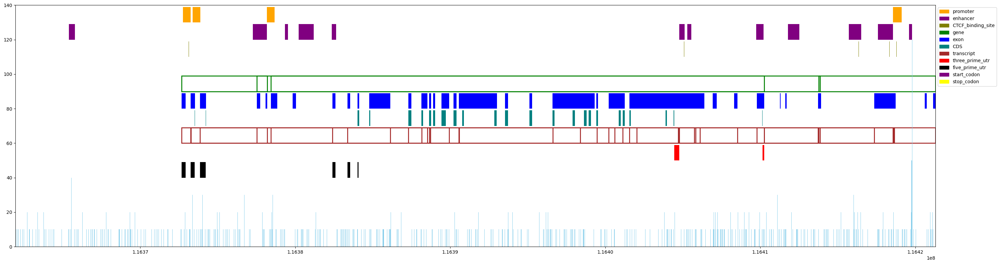

gene_#=4,exon_#=152,cds_#=82,var_#=14263,path_#=12
transcript_#=30,prime3_#=4,prime5_#=8,start_codon_#=5,stop_codon_#=4
promoter_#=4,enhancer_#=12,ctcf_#=5,open_#=0
sentence_id=133, begin=117929622, gene_start=117929720, gene_end=118185228, span=255606, prefix=98


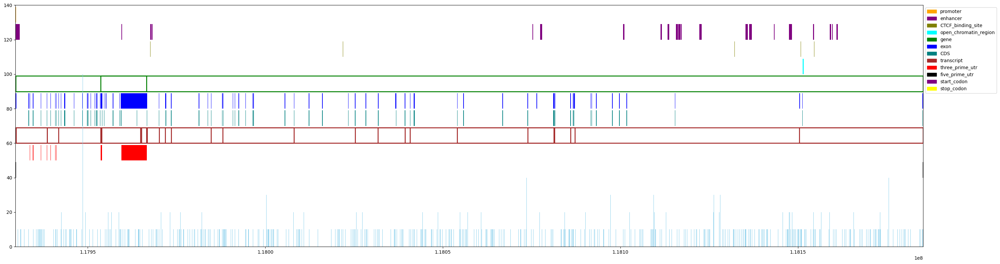

gene_#=2,exon_#=159,cds_#=93,var_#=55603,path_#=1
transcript_#=17,prime3_#=11,prime5_#=5,start_codon_#=3,stop_codon_#=4
promoter_#=2,enhancer_#=21,ctcf_#=8,open_#=1
sentence_id=134, begin=119002790, gene_start=119031216, gene_end=119394130, span=391340, prefix=28426


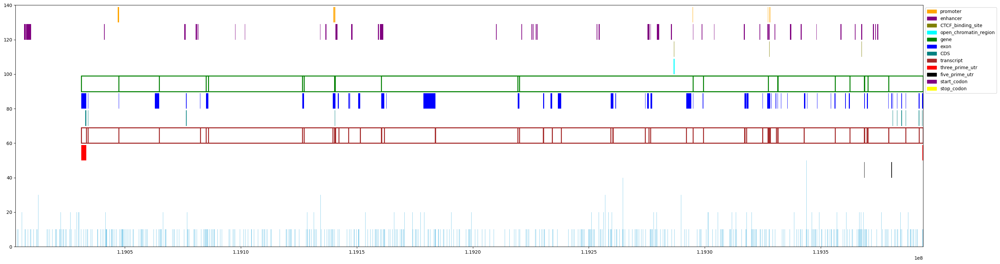

gene_#=12,exon_#=201,cds_#=38,var_#=95918,path_#=9
transcript_#=52,prime3_#=5,prime5_#=11,start_codon_#=6,stop_codon_#=5
promoter_#=6,enhancer_#=44,ctcf_#=16,open_#=1
sentence_id=135, begin=119394131, gene_start=119412927, gene_end=119423035, span=28904, prefix=18796


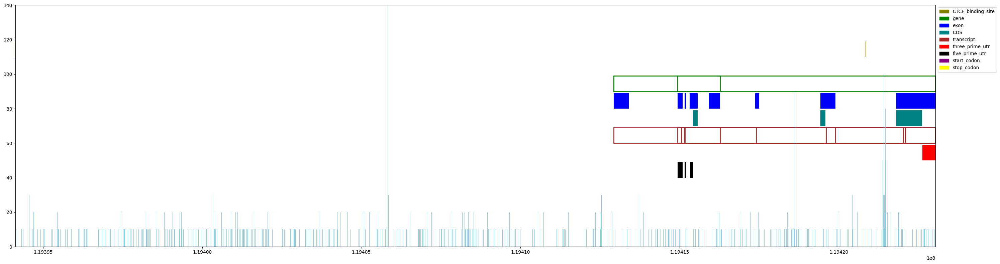

gene_#=2,exon_#=25,cds_#=9,var_#=7914,path_#=14
transcript_#=7,prime3_#=2,prime5_#=6,start_codon_#=3,stop_codon_#=2
promoter_#=0,enhancer_#=0,ctcf_#=2,open_#=0
sentence_id=136, begin=119648267, gene_start=119648348, gene_end=119744218, span=95951, prefix=81


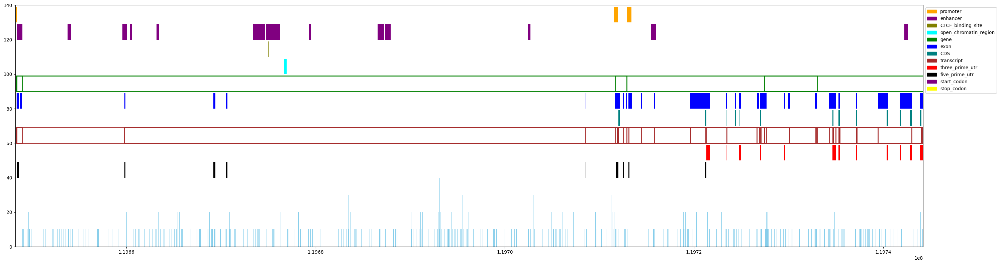

gene_#=4,exon_#=292,cds_#=128,var_#=22667,path_#=6
transcript_#=39,prime3_#=80,prime5_#=28,start_codon_#=20,stop_codon_#=18
promoter_#=3,enhancer_#=13,ctcf_#=3,open_#=1
sentence_id=137, begin=119744219, gene_start=119748002, gene_end=119768905, span=24686, prefix=3783


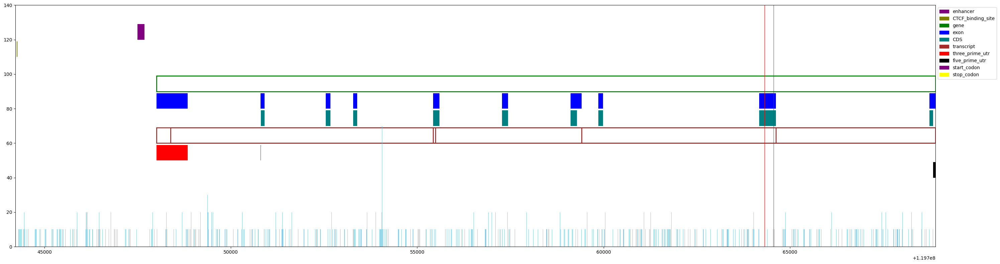

gene_#=1,exon_#=26,cds_#=17,var_#=5582,path_#=14
transcript_#=4,prime3_#=4,prime5_#=2,start_codon_#=2,stop_codon_#=2
promoter_#=0,enhancer_#=1,ctcf_#=1,open_#=0
sentence_id=138, begin=119896516, gene_start=119911553, gene_end=120100779, span=204263, prefix=15037


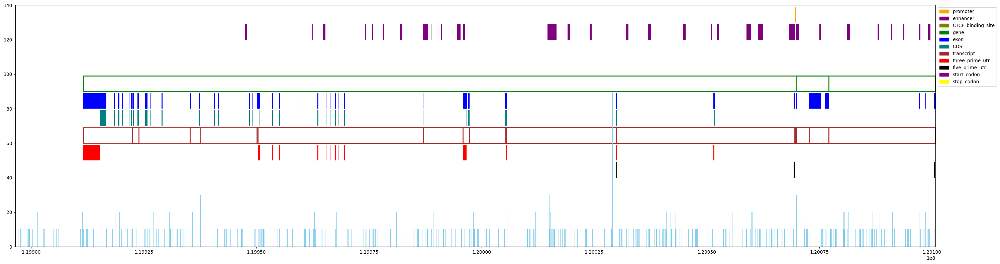

gene_#=2,exon_#=93,cds_#=47,var_#=50112,path_#=5
transcript_#=14,prime3_#=15,prime5_#=6,start_codon_#=4,stop_codon_#=5
promoter_#=1,enhancer_#=32,ctcf_#=2,open_#=0
sentence_id=139, begin=145910112, gene_start=145911350, gene_end=145978848, span=68736, prefix=1238


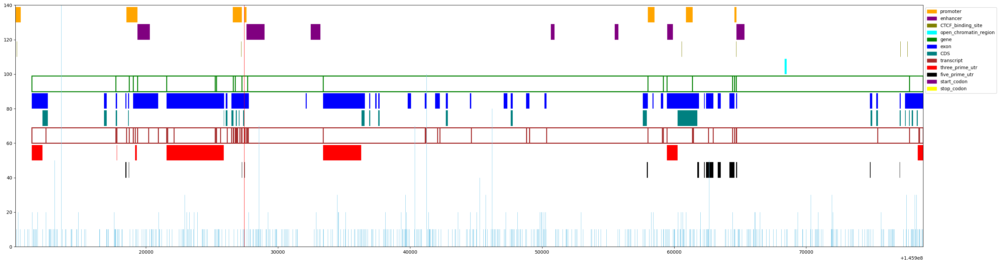

gene_#=11,exon_#=191,cds_#=64,var_#=17620,path_#=6
transcript_#=51,prime3_#=21,prime5_#=22,start_codon_#=13,stop_codon_#=13
promoter_#=7,enhancer_#=7,ctcf_#=6,open_#=1
sentence_id=140, begin=145996580, gene_start=146017468, gene_end=146036746, span=40166, prefix=20888


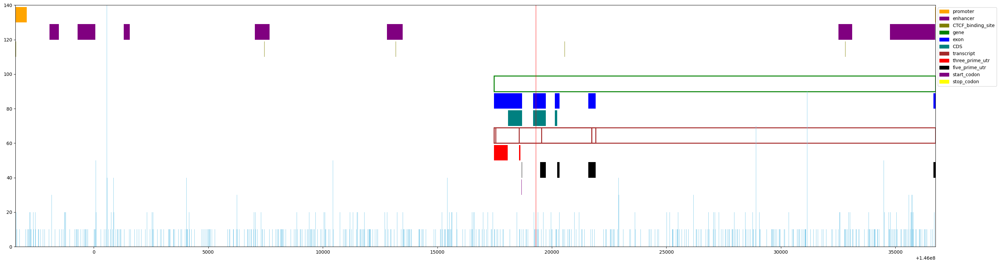

gene_#=1,exon_#=22,cds_#=13,var_#=12392,path_#=9
transcript_#=7,prime3_#=6,prime5_#=16,start_codon_#=7,stop_codon_#=6
promoter_#=2,enhancer_#=7,ctcf_#=5,open_#=0
sentence_id=141, begin=147842360, gene_start=147902795, gene_end=147909269, span=66909, prefix=60435


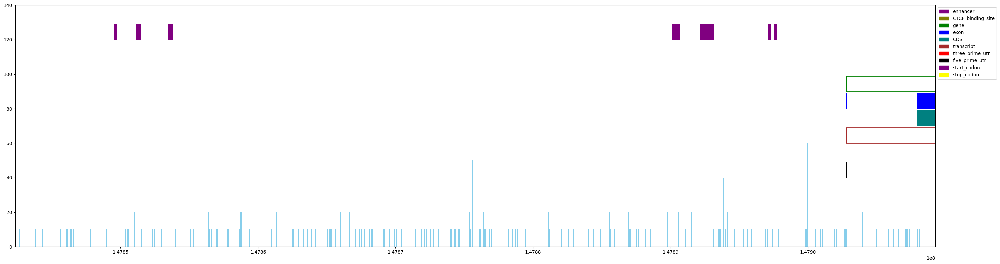

gene_#=1,exon_#=2,cds_#=1,var_#=15862,path_#=42
transcript_#=1,prime3_#=1,prime5_#=2,start_codon_#=1,stop_codon_#=1
promoter_#=0,enhancer_#=7,ctcf_#=4,open_#=0
sentence_id=142, begin=150010727, gene_start=150020710, gene_end=150145329, span=134602, prefix=9983


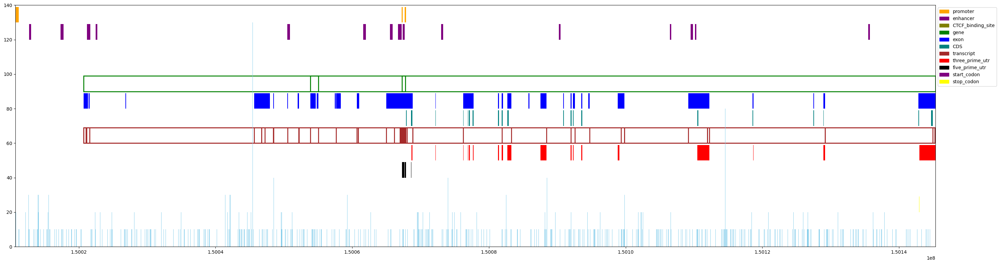

gene_#=3,exon_#=794,cds_#=443,var_#=33685,path_#=3
transcript_#=99,prime3_#=79,prime5_#=39,start_codon_#=35,stop_codon_#=35
promoter_#=3,enhancer_#=15,ctcf_#=2,open_#=0
sentence_id=143, begin=150309783, gene_start=150321479, gene_end=150353233, span=43450, prefix=11696


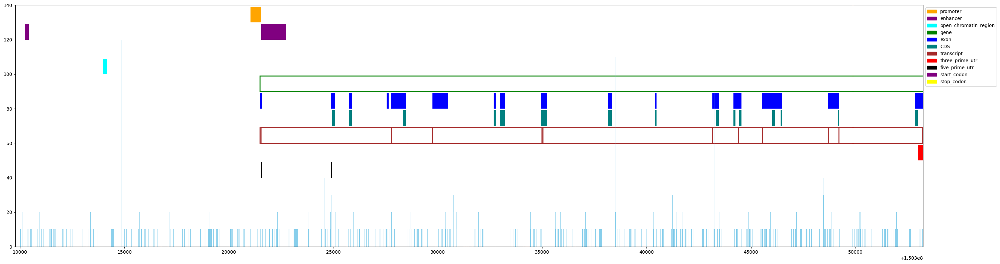

gene_#=1,exon_#=47,cds_#=15,var_#=13362,path_#=7
transcript_#=7,prime3_#=1,prime5_#=2,start_codon_#=1,stop_codon_#=1
promoter_#=1,enhancer_#=2,ctcf_#=0,open_#=1
sentence_id=144, begin=150485359, gene_start=150487414, gene_end=150537267, span=51908, prefix=2055


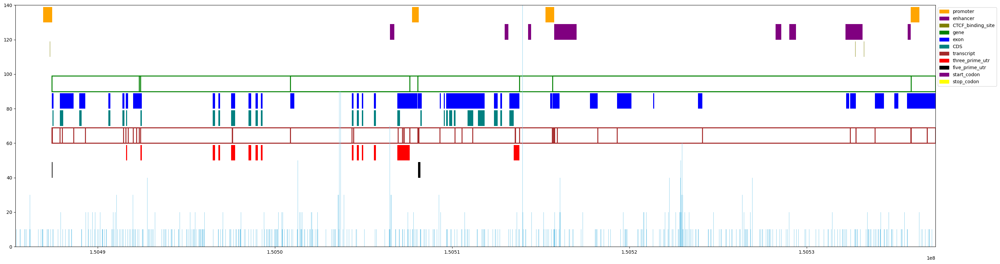

gene_#=5,exon_#=209,cds_#=86,var_#=15818,path_#=1
transcript_#=35,prime3_#=28,prime5_#=7,start_codon_#=7,stop_codon_#=8
promoter_#=4,enhancer_#=8,ctcf_#=3,open_#=0
sentence_id=145, begin=150537268, gene_start=150548562, gene_end=150629612, span=92344, prefix=11294


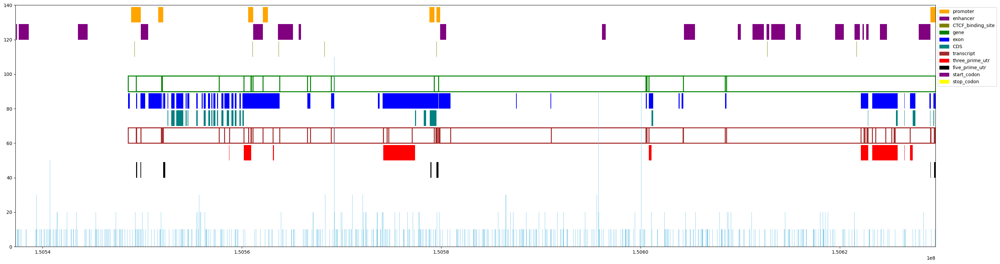

gene_#=12,exon_#=227,cds_#=162,var_#=27731,path_#=2
transcript_#=46,prime3_#=28,prime5_#=31,start_codon_#=24,stop_codon_#=24
promoter_#=7,enhancer_#=21,ctcf_#=10,open_#=0
sentence_id=146, begin=150780645, gene_start=150794880, gene_end=150809577, span=28932, prefix=14235


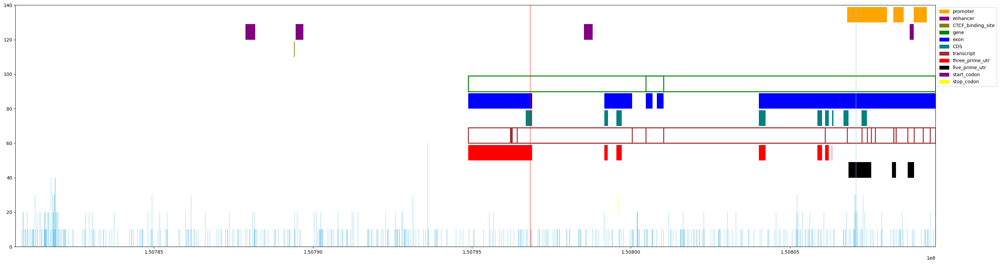

gene_#=2,exon_#=140,cds_#=76,var_#=7555,path_#=23
transcript_#=21,prime3_#=20,prime5_#=22,start_codon_#=12,stop_codon_#=12
promoter_#=3,enhancer_#=4,ctcf_#=1,open_#=0
sentence_id=147, begin=151008377, gene_start=151008420, gene_end=151035713, span=27336, prefix=43


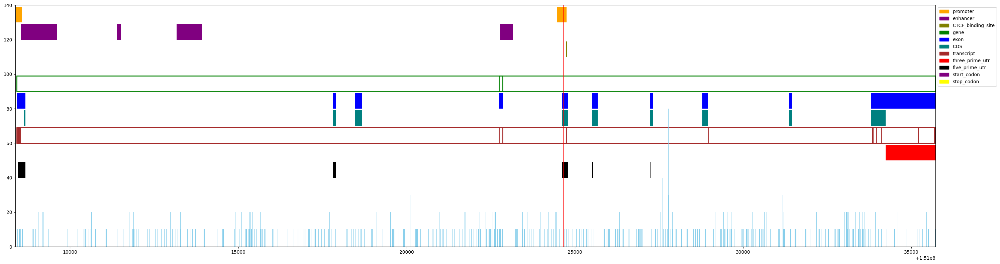

gene_#=2,exon_#=67,cds_#=36,var_#=8203,path_#=6
transcript_#=12,prime3_#=6,prime5_#=19,start_codon_#=8,stop_codon_#=6
promoter_#=2,enhancer_#=4,ctcf_#=1,open_#=0
sentence_id=148, begin=151267480, gene_start=151273345, gene_end=151327715, span=60235, prefix=5865


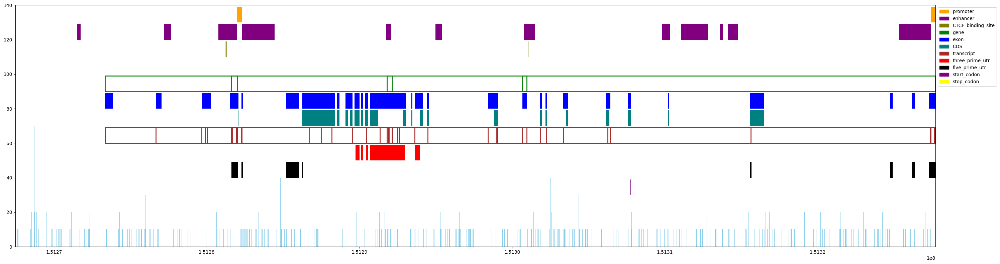

gene_#=4,exon_#=149,cds_#=101,var_#=15477,path_#=1
transcript_#=30,prime3_#=16,prime5_#=29,start_codon_#=12,stop_codon_#=13
promoter_#=2,enhancer_#=12,ctcf_#=3,open_#=0
sentence_id=149, begin=151327716, gene_start=151327811, gene_end=151348027, span=20311, prefix=95


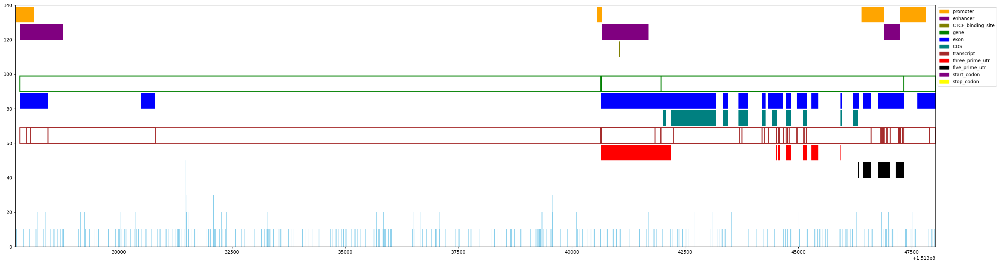

gene_#=3,exon_#=161,cds_#=87,var_#=5108,path_#=1
transcript_#=27,prime3_#=16,prime5_#=44,start_codon_#=15,stop_codon_#=8
promoter_#=4,enhancer_#=3,ctcf_#=1,open_#=0
sentence_id=150, begin=151348028, gene_start=151364304, gene_end=151372707, span=24679, prefix=16276


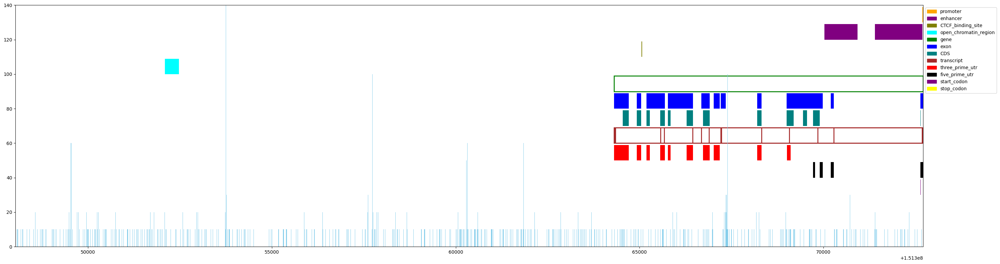

gene_#=1,exon_#=169,cds_#=75,var_#=7091,path_#=2
transcript_#=19,prime3_#=39,prime5_#=13,start_codon_#=10,stop_codon_#=8
promoter_#=1,enhancer_#=2,ctcf_#=1,open_#=1
sentence_id=151, begin=151401938, gene_start=151402724, gene_end=151459494, span=57556, prefix=786


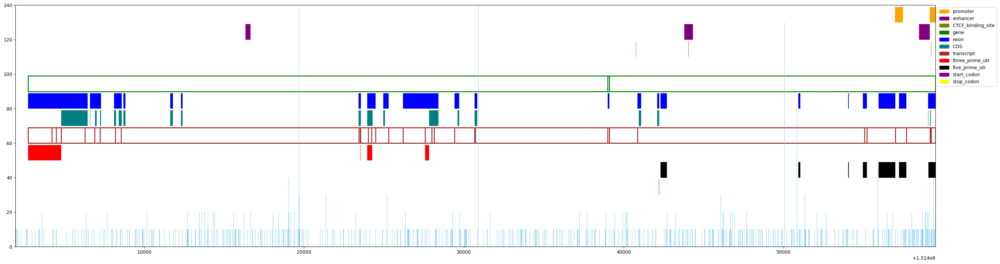

gene_#=2,exon_#=244,cds_#=187,var_#=16986,path_#=11
transcript_#=25,prime3_#=9,prime5_#=29,start_codon_#=12,stop_codon_#=11
promoter_#=2,enhancer_#=3,ctcf_#=3,open_#=0
sentence_id=152, begin=153785822, gene_start=153789030, gene_end=153946718, span=160896, prefix=3208


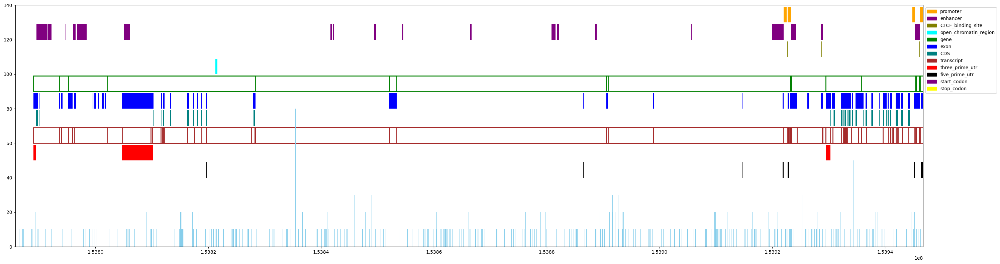

gene_#=9,exon_#=218,cds_#=103,var_#=46646,path_#=3
transcript_#=51,prime3_#=5,prime5_#=19,start_codon_#=9,stop_codon_#=5
promoter_#=5,enhancer_#=19,ctcf_#=6,open_#=1
sentence_id=153, begin=154155117, gene_start=154155308, gene_end=154194648, span=39531, prefix=191


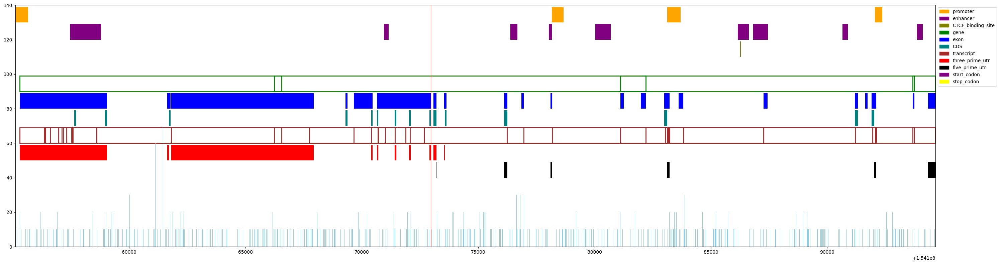

gene_#=4,exon_#=183,cds_#=114,var_#=10241,path_#=9
transcript_#=30,prime3_#=38,prime5_#=19,start_codon_#=16,stop_codon_#=17
promoter_#=4,enhancer_#=9,ctcf_#=1,open_#=0
sentence_id=154, begin=154559471, gene_start=154564788, gene_end=154580013, span=20542, prefix=5317


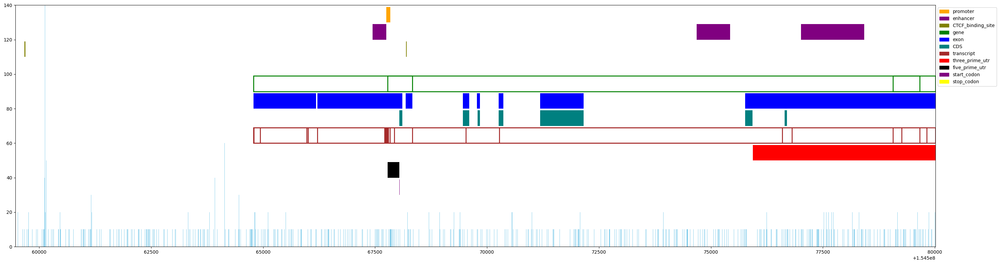

gene_#=3,exon_#=50,cds_#=19,var_#=4892,path_#=4
transcript_#=16,prime3_#=5,prime5_#=3,start_codon_#=3,stop_codon_#=3
promoter_#=1,enhancer_#=3,ctcf_#=2,open_#=0
sentence_id=155, begin=154580014, gene_start=154581695, gene_end=154631960, span=51946, prefix=1681


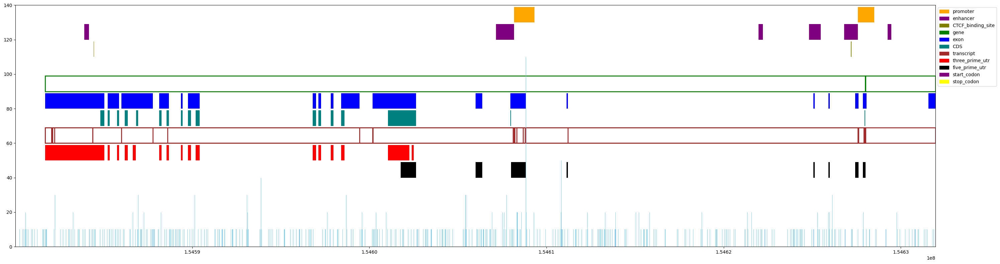

gene_#=2,exon_#=584,cds_#=379,var_#=13157,path_#=11
transcript_#=43,prime3_#=121,prime5_#=56,start_codon_#=32,stop_codon_#=32
promoter_#=2,enhancer_#=6,ctcf_#=2,open_#=0
sentence_id=156, begin=154678346, gene_start=154697455, gene_end=154871220, span=192874, prefix=19109


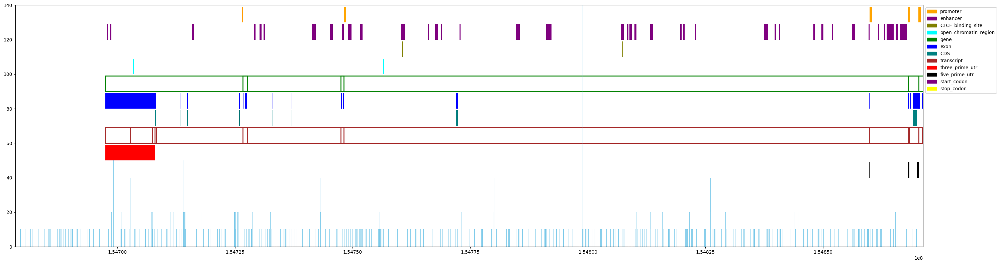

gene_#=4,exon_#=52,cds_#=32,var_#=47542,path_#=2
transcript_#=11,prime3_#=4,prime5_#=5,start_codon_#=4,stop_codon_#=4
promoter_#=6,enhancer_#=39,ctcf_#=11,open_#=2
sentence_id=157, begin=154979252, gene_start=154983338, gene_end=154993111, span=13859, prefix=4086


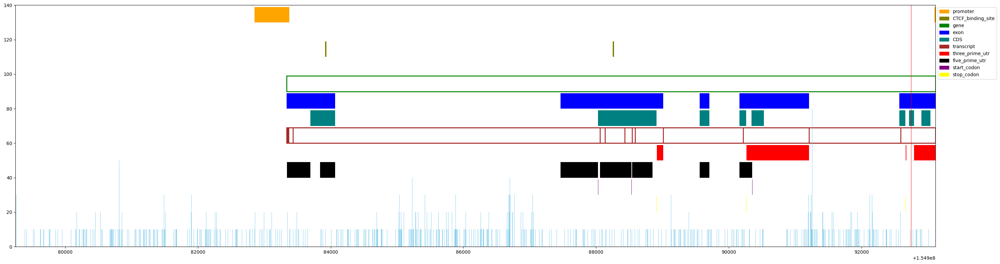

gene_#=1,exon_#=53,cds_#=31,var_#=4206,path_#=1
transcript_#=12,prime3_#=8,prime5_#=13,start_codon_#=7,stop_codon_#=7
promoter_#=2,enhancer_#=0,ctcf_#=2,open_#=0
sentence_id=158, begin=155138858, gene_start=155139891, gene_end=155140595, span=1737, prefix=1033


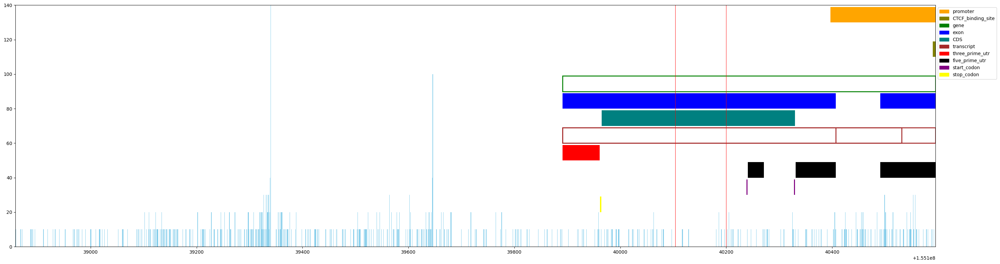

gene_#=1,exon_#=5,cds_#=3,var_#=547,path_#=2
transcript_#=3,prime3_#=3,prime5_#=5,start_codon_#=3,stop_codon_#=3
promoter_#=1,enhancer_#=0,ctcf_#=1,open_#=0
sentence_id=159, begin=155192917, gene_start=155194806, gene_end=155244699, span=51782, prefix=1889


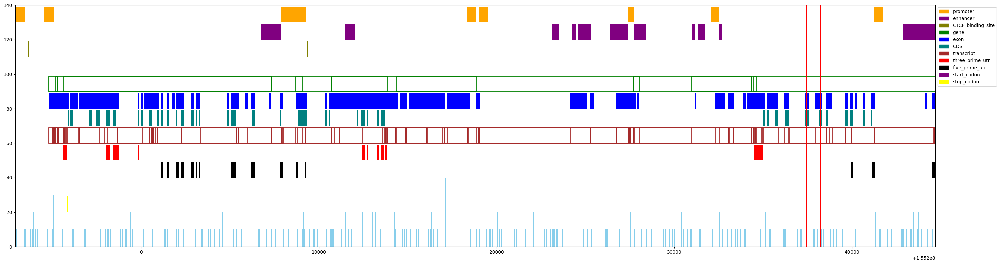

gene_#=9,exon_#=1323,cds_#=158,var_#=12644,path_#=85
transcript_#=180,prime3_#=20,prime5_#=25,start_codon_#=13,stop_codon_#=13
promoter_#=9,enhancer_#=11,ctcf_#=6,open_#=0
sentence_id=160, begin=155244700, gene_start=155247205, gene_end=155301438, span=56738, prefix=2505


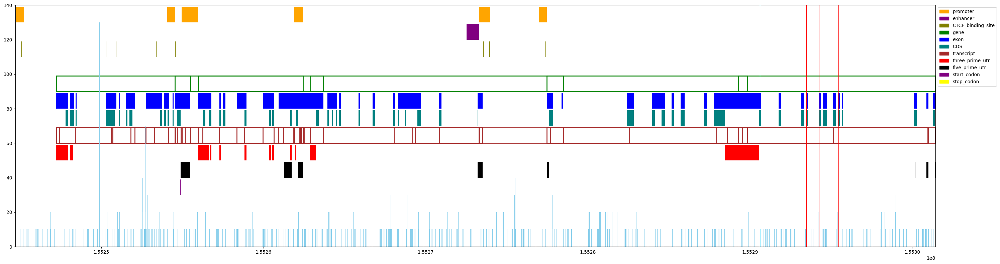

gene_#=6,exon_#=356,cds_#=223,var_#=16110,path_#=43
transcript_#=53,prime3_#=39,prime5_#=29,start_codon_#=26,stop_codon_#=26
promoter_#=7,enhancer_#=1,ctcf_#=10,open_#=0
sentence_id=161, begin=155331115, gene_start=155335268, gene_end=155614951, span=283836, prefix=4153


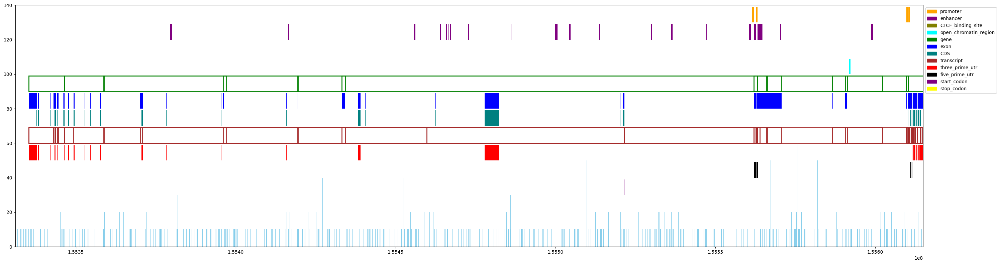

gene_#=12,exon_#=520,cds_#=297,var_#=79697,path_#=8
transcript_#=48,prime3_#=105,prime5_#=33,start_codon_#=17,stop_codon_#=20
promoter_#=4,enhancer_#=21,ctcf_#=3,open_#=1
sentence_id=162, begin=155648641, gene_start=155659446, gene_end=155739010, span=90369, prefix=10805


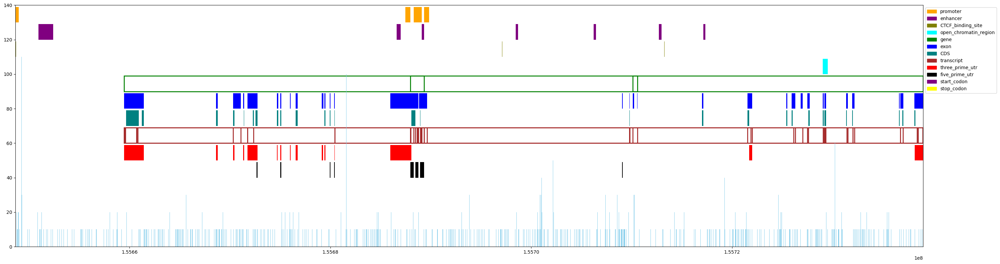

gene_#=3,exon_#=830,cds_#=535,var_#=24566,path_#=1
transcript_#=95,prime3_#=198,prime5_#=189,start_codon_#=74,stop_codon_#=76
promoter_#=4,enhancer_#=7,ctcf_#=6,open_#=1
sentence_id=163, begin=155894387, gene_start=155897808, gene_end=155911404, span=17017, prefix=3421


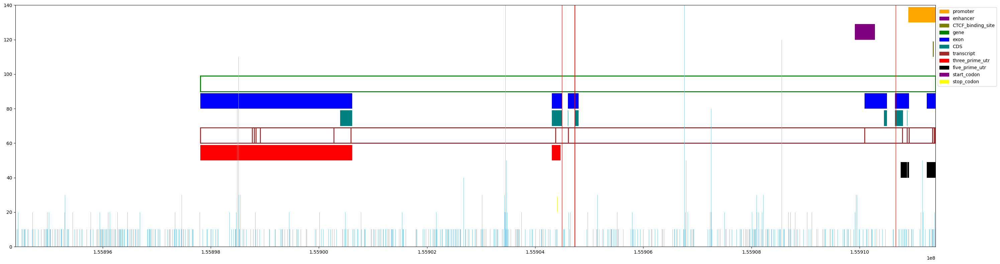

gene_#=1,exon_#=52,cds_#=39,var_#=5318,path_#=28
transcript_#=10,prime3_#=8,prime5_#=13,start_codon_#=8,stop_codon_#=6
promoter_#=1,enhancer_#=1,ctcf_#=1,open_#=0
sentence_id=164, begin=156082466, gene_start=156082572, gene_end=156140081, span=57615, prefix=106


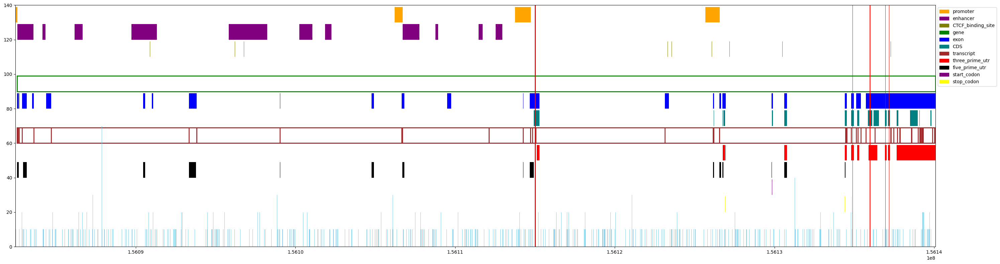

gene_#=1,exon_#=382,cds_#=205,var_#=14053,path_#=192
transcript_#=45,prime3_#=85,prime5_#=46,start_codon_#=24,stop_codon_#=24
promoter_#=4,enhancer_#=11,ctcf_#=9,open_#=0
sentence_id=165, begin=156140082, gene_start=156147366, gene_end=156177752, span=37670, prefix=7284


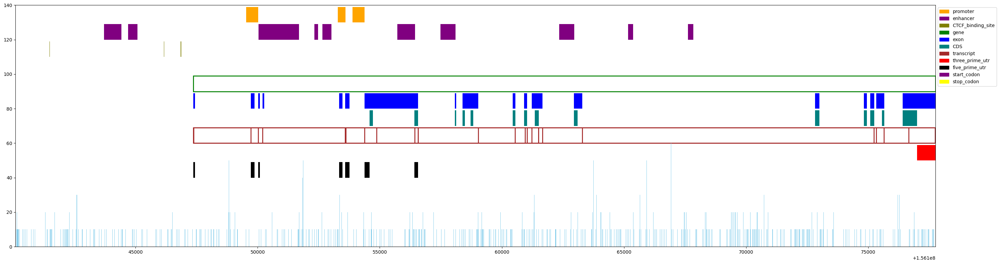

gene_#=1,exon_#=116,cds_#=77,var_#=9824,path_#=1
transcript_#=15,prime3_#=4,prime5_#=16,start_codon_#=8,stop_codon_#=4
promoter_#=3,enhancer_#=10,ctcf_#=3,open_#=0
sentence_id=166, begin=156587720, gene_start=156591756, gene_end=156609507, span=21787, prefix=4036


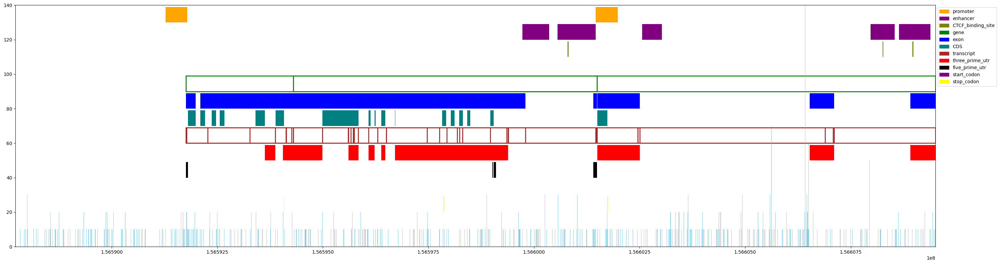

gene_#=2,exon_#=203,cds_#=106,var_#=5482,path_#=2
transcript_#=36,prime3_#=29,prime5_#=24,start_codon_#=18,stop_codon_#=16
promoter_#=2,enhancer_#=5,ctcf_#=3,open_#=0
sentence_id=167, begin=156800816, gene_start=156806240, gene_end=156881850, span=81034, prefix=5424


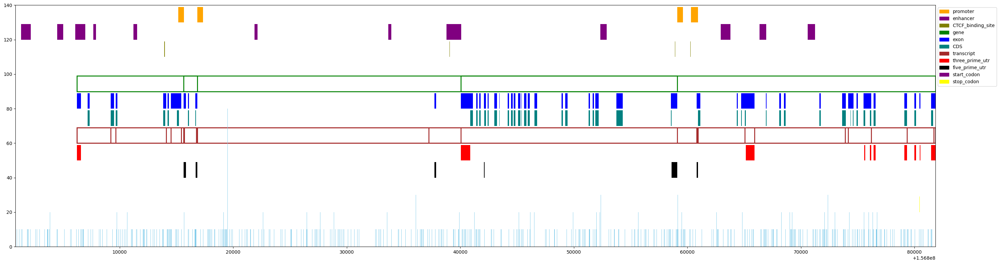

gene_#=3,exon_#=194,cds_#=144,var_#=19489,path_#=31
transcript_#=19,prime3_#=21,prime5_#=14,start_codon_#=11,stop_codon_#=12
promoter_#=4,enhancer_#=12,ctcf_#=5,open_#=0
sentence_id=168, begin=158579900, gene_start=158605268, gene_end=158686715, span=106815, prefix=25368


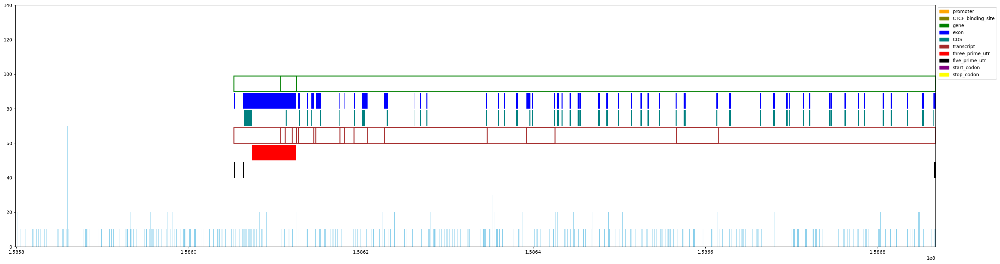

gene_#=2,exon_#=80,cds_#=53,var_#=26190,path_#=15
transcript_#=10,prime3_#=2,prime5_#=3,start_codon_#=2,stop_codon_#=2
promoter_#=1,enhancer_#=0,ctcf_#=1,open_#=0
sentence_id=169, begin=159055156, gene_start=159056129, gene_end=159211455, span=156299, prefix=973


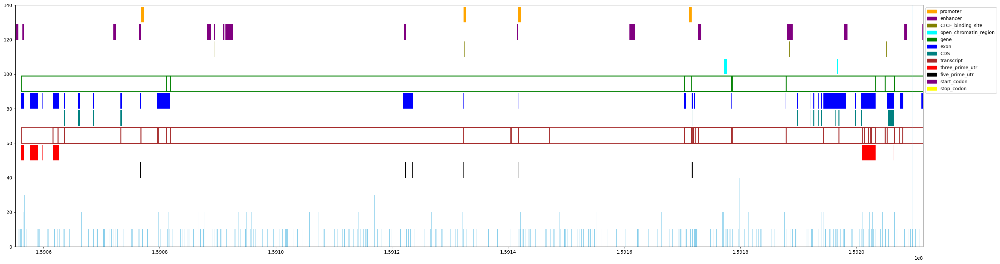

gene_#=6,exon_#=106,cds_#=57,var_#=35542,path_#=2
transcript_#=26,prime3_#=13,prime5_#=24,start_codon_#=12,stop_codon_#=10
promoter_#=5,enhancer_#=16,ctcf_#=10,open_#=2
sentence_id=170, begin=159925508, gene_start=159927039, gene_end=160080852, span=155344, prefix=1531


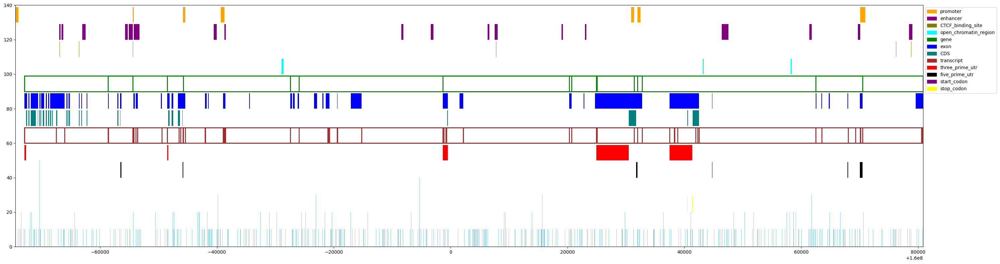

gene_#=9,exon_#=230,cds_#=63,var_#=35698,path_#=12
transcript_#=56,prime3_#=16,prime5_#=14,start_codon_#=10,stop_codon_#=14
promoter_#=7,enhancer_#=18,ctcf_#=15,open_#=3
sentence_id=171, begin=160098944, gene_start=160115759, gene_end=160143591, span=44647, prefix=16815


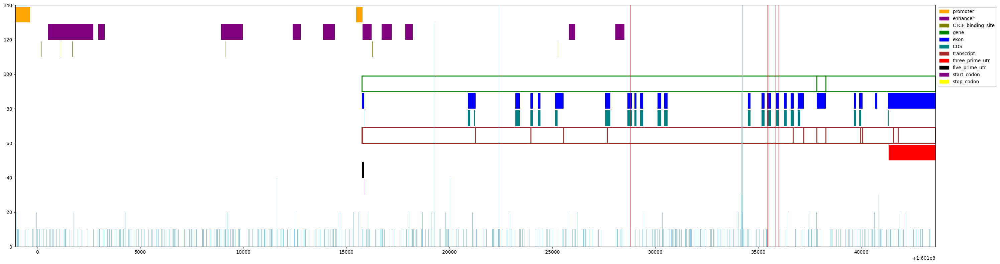

gene_#=2,exon_#=95,cds_#=62,var_#=10995,path_#=61
transcript_#=9,prime3_#=3,prime5_#=2,start_codon_#=2,stop_codon_#=3
promoter_#=2,enhancer_#=10,ctcf_#=6,open_#=0
sentence_id=172, begin=160143592, gene_start=160151586, gene_end=160201886, span=58294, prefix=7994


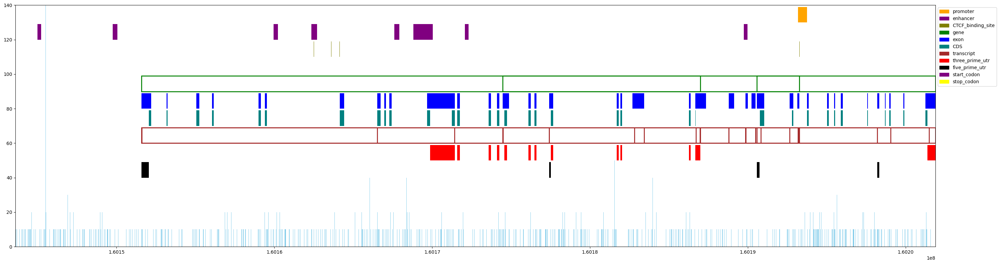

gene_#=3,exon_#=129,cds_#=57,var_#=14860,path_#=4
transcript_#=18,prime3_#=28,prime5_#=6,start_codon_#=5,stop_codon_#=6
promoter_#=1,enhancer_#=8,ctcf_#=4,open_#=0
sentence_id=173, begin=160215377, gene_start=160215715, gene_end=160358952, span=143575, prefix=338


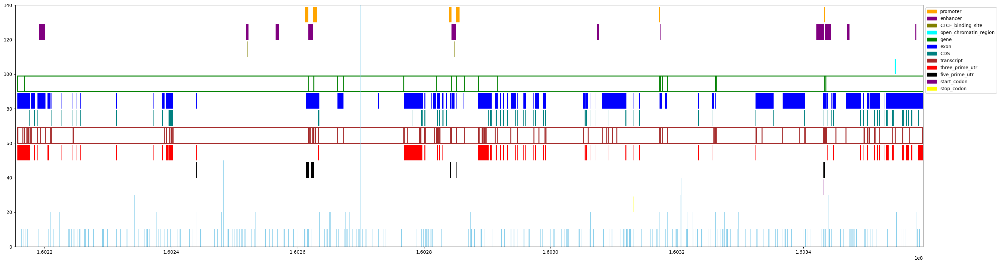

gene_#=11,exon_#=1558,cds_#=566,var_#=33546,path_#=8
transcript_#=126,prime3_#=315,prime5_#=64,start_codon_#=46,stop_codon_#=48
promoter_#=6,enhancer_#=11,ctcf_#=13,open_#=1
sentence_id=174, begin=161133413, gene_start=161140944, gene_end=161159418, span=26005, prefix=7531


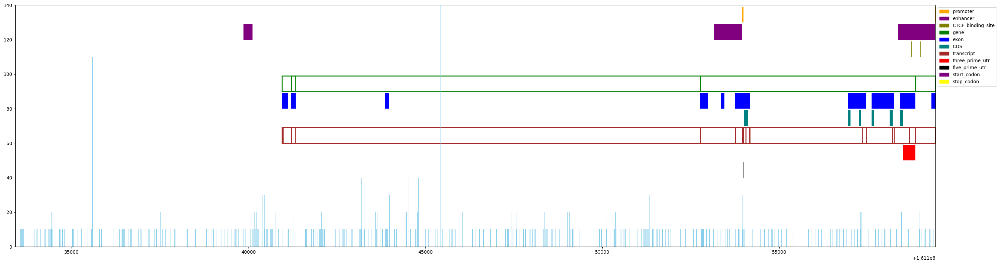

gene_#=3,exon_#=38,cds_#=6,var_#=7293,path_#=1
transcript_#=12,prime3_#=1,prime5_#=1,start_codon_#=1,stop_codon_#=1
promoter_#=2,enhancer_#=3,ctcf_#=2,open_#=0
sentence_id=175, begin=161159419, gene_start=161159450, gene_end=161178013, span=18594, prefix=31


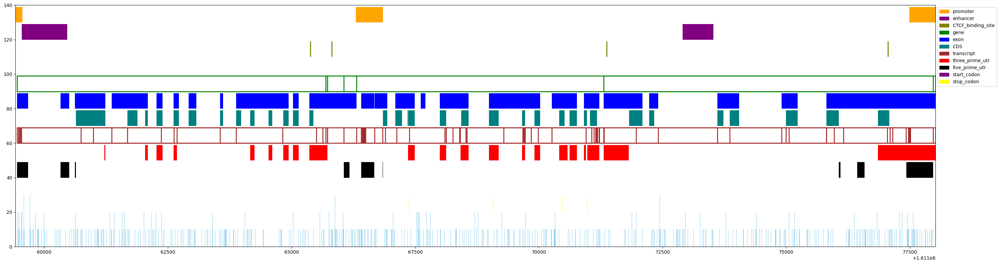

gene_#=4,exon_#=345,cds_#=178,var_#=4449,path_#=7
transcript_#=52,prime3_#=75,prime5_#=47,start_codon_#=21,stop_codon_#=26
promoter_#=3,enhancer_#=2,ctcf_#=4,open_#=0
sentence_id=176, begin=161178014, gene_start=161184302, gene_end=161214723, span=36709, prefix=6288


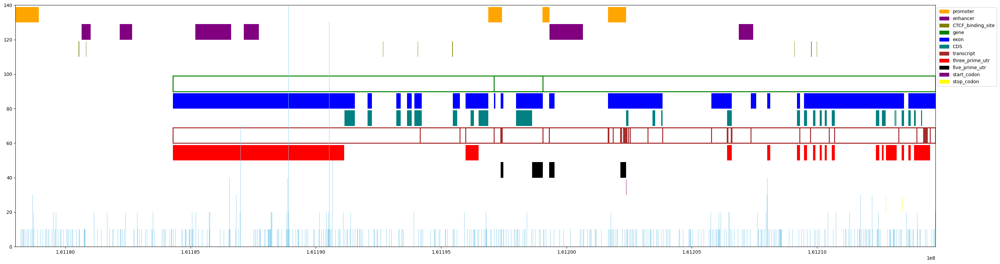

gene_#=2,exon_#=1062,cds_#=352,var_#=8908,path_#=4
transcript_#=93,prime3_#=202,prime5_#=58,start_codon_#=39,stop_codon_#=40
promoter_#=4,enhancer_#=6,ctcf_#=8,open_#=0
sentence_id=177, begin=161285451, gene_start=161304735, gene_end=161309968, span=24517, prefix=19284


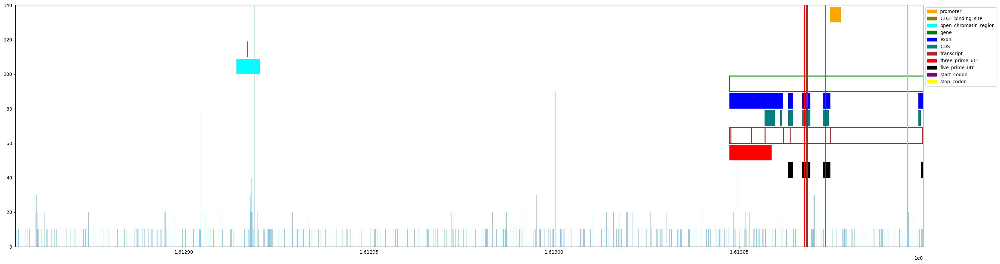

gene_#=1,exon_#=40,cds_#=26,var_#=7174,path_#=89
transcript_#=8,prime3_#=6,prime5_#=8,start_codon_#=5,stop_codon_#=5
promoter_#=1,enhancer_#=0,ctcf_#=1,open_#=1
sentence_id=178, begin=161314267, gene_start=161314381, gene_end=161363206, span=48939, prefix=114


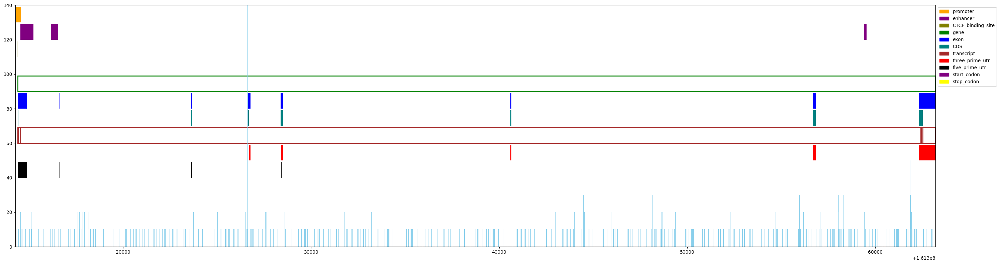

gene_#=1,exon_#=68,cds_#=52,var_#=13284,path_#=8
transcript_#=12,prime3_#=17,prime5_#=21,start_codon_#=12,stop_codon_#=12
promoter_#=1,enhancer_#=3,ctcf_#=2,open_#=0
sentence_id=179, begin=161736772, gene_start=161748537, gene_end=161977574, span=240802, prefix=11765


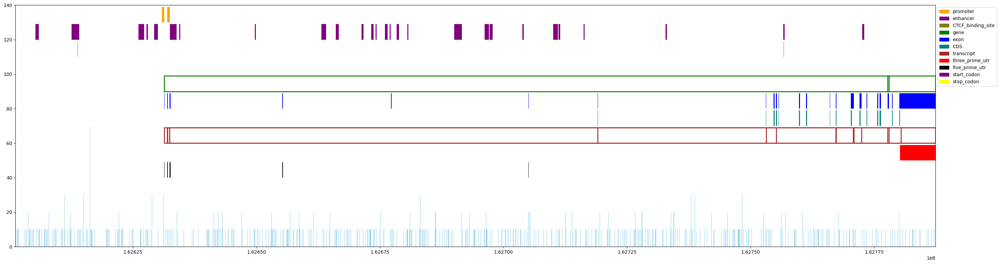

gene_#=2,exon_#=90,cds_#=54,var_#=44182,path_#=2
transcript_#=10,prime3_#=3,prime5_#=17,start_codon_#=5,stop_codon_#=3
promoter_#=2,enhancer_#=27,ctcf_#=4,open_#=0
sentence_id=181, begin=164533193, gene_start=164555584, gene_end=164912569, span=379376, prefix=22391


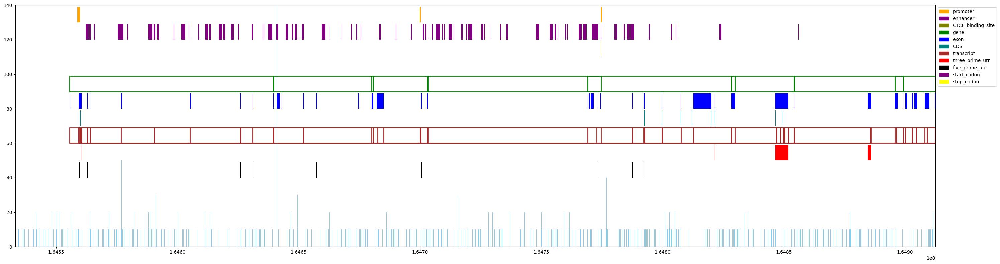

gene_#=8,exon_#=199,cds_#=89,var_#=93532,path_#=12
transcript_#=46,prime3_#=13,prime5_#=22,start_codon_#=15,stop_codon_#=11
promoter_#=4,enhancer_#=78,ctcf_#=11,open_#=0
sentence_id=182, begin=164980138, gene_start=165201867, gene_end=165356715, span=376577, prefix=221729


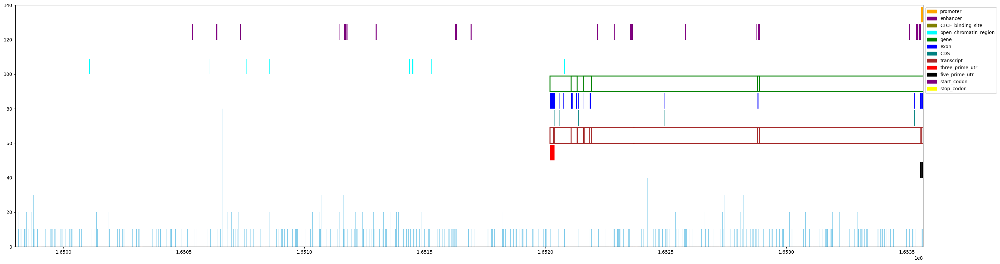

gene_#=4,exon_#=46,cds_#=24,var_#=92146,path_#=1
transcript_#=10,prime3_#=3,prime5_#=5,start_codon_#=3,stop_codon_#=3
promoter_#=1,enhancer_#=20,ctcf_#=14,open_#=9
sentence_id=183, begin=165709969, gene_start=165724293, gene_end=165911618, span=201649, prefix=14324


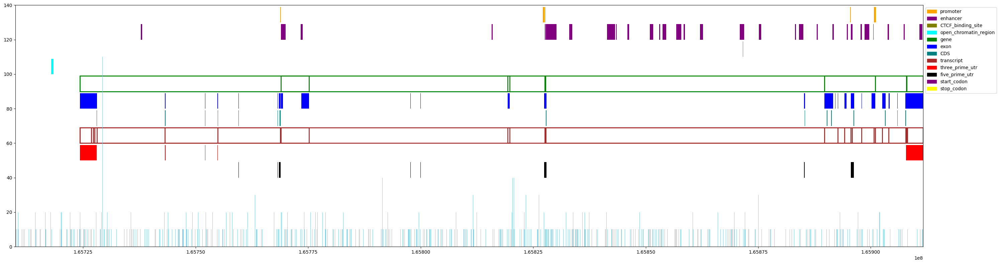

gene_#=6,exon_#=107,cds_#=61,var_#=51173,path_#=2
transcript_#=22,prime3_#=17,prime5_#=22,start_codon_#=12,stop_codon_#=13
promoter_#=5,enhancer_#=30,ctcf_#=3,open_#=1
sentence_id=184, begin=168263482, gene_start=168280877, gene_end=168314426, span=50944, prefix=17395


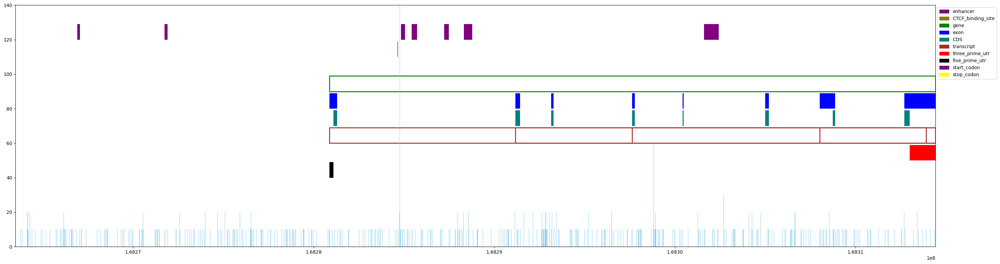

gene_#=1,exon_#=21,cds_#=19,var_#=11977,path_#=3
transcript_#=4,prime3_#=3,prime5_#=1,start_codon_#=1,stop_codon_#=3
promoter_#=0,enhancer_#=7,ctcf_#=1,open_#=0
sentence_id=185, begin=169460670, gene_start=169463909, gene_end=169485944, span=25274, prefix=3239


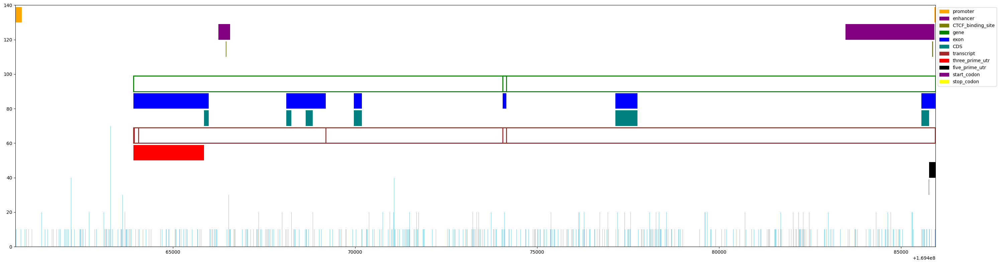

gene_#=2,exon_#=20,cds_#=17,var_#=5455,path_#=9
transcript_#=5,prime3_#=3,prime5_#=3,start_codon_#=3,stop_codon_#=3
promoter_#=2,enhancer_#=2,ctcf_#=2,open_#=0
sentence_id=186, begin=169500183, gene_start=169511951, gene_end=169586588, span=86405, prefix=11768


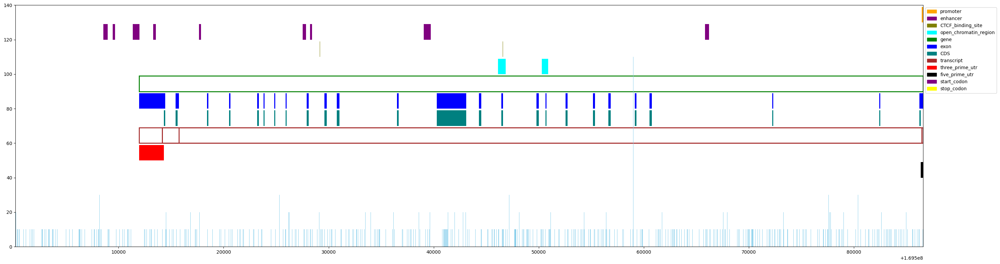

gene_#=1,exon_#=52,cds_#=50,var_#=19296,path_#=11
transcript_#=3,prime3_#=2,prime5_#=2,start_codon_#=2,stop_codon_#=2
promoter_#=1,enhancer_#=9,ctcf_#=4,open_#=2
sentence_id=187, begin=170370368, gene_start=170460452, gene_end=170553834, span=183466, prefix=90084


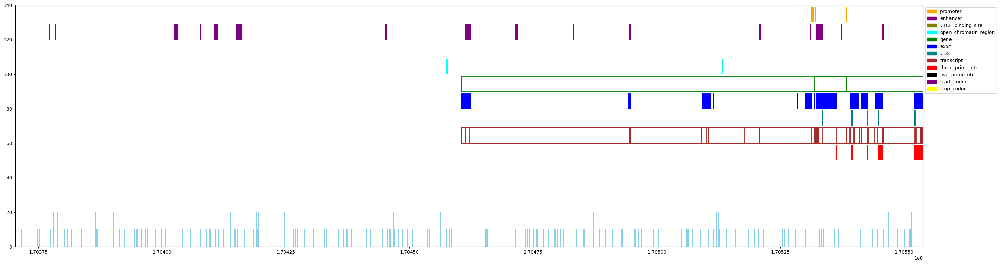

gene_#=2,exon_#=258,cds_#=41,var_#=43473,path_#=3
transcript_#=65,prime3_#=39,prime5_#=12,start_codon_#=12,stop_codon_#=12
promoter_#=3,enhancer_#=19,ctcf_#=1,open_#=2
sentence_id=188, begin=170739422, gene_start=170748573, gene_end=171285978, span=546556, prefix=9151


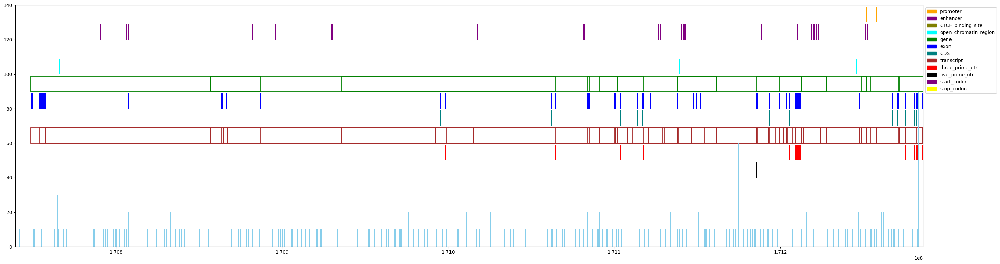

gene_#=14,exon_#=262,cds_#=105,var_#=134971,path_#=16
transcript_#=56,prime3_#=22,prime5_#=22,start_codon_#=12,stop_codon_#=12
promoter_#=3,enhancer_#=29,ctcf_#=15,open_#=5
sentence_id=189, begin=171593512, gene_start=171600621, gene_end=171652688, span=59176, prefix=7109


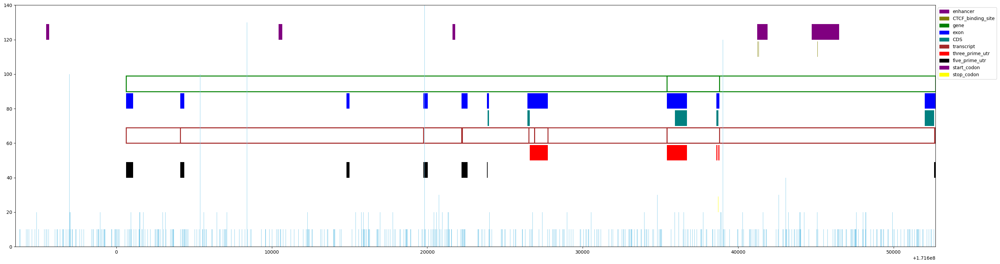

gene_#=2,exon_#=28,cds_#=19,var_#=15094,path_#=27
transcript_#=8,prime3_#=8,prime5_#=16,start_codon_#=8,stop_codon_#=7
promoter_#=0,enhancer_#=5,ctcf_#=3,open_#=0
sentence_id=190, begin=171814024, gene_start=171817887, gene_end=172468831, span=654807, prefix=3863


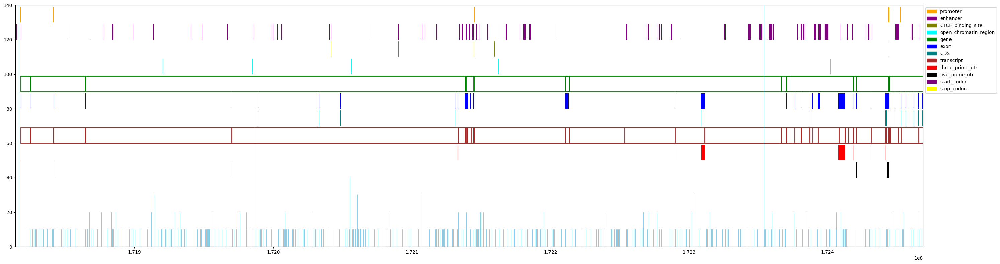

gene_#=12,exon_#=227,cds_#=165,var_#=150758,path_#=2
transcript_#=36,prime3_#=13,prime5_#=16,start_codon_#=13,stop_codon_#=13
promoter_#=6,enhancer_#=87,ctcf_#=27,open_#=6
sentence_id=191, begin=173791888, gene_start=173799550, gene_end=173903547, span=111659, prefix=7662


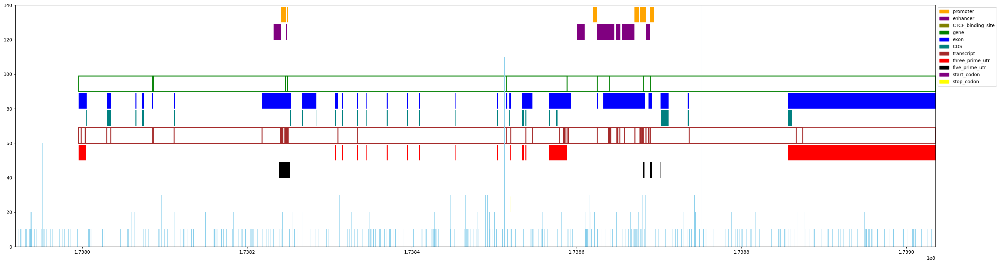

gene_#=6,exon_#=2018,cds_#=139,var_#=29258,path_#=21
transcript_#=206,prime3_#=64,prime5_#=33,start_codon_#=18,stop_codon_#=18
promoter_#=6,enhancer_#=7,ctcf_#=2,open_#=0
sentence_id=192, begin=173903548, gene_start=173903800, gene_end=173924480, span=20932, prefix=252


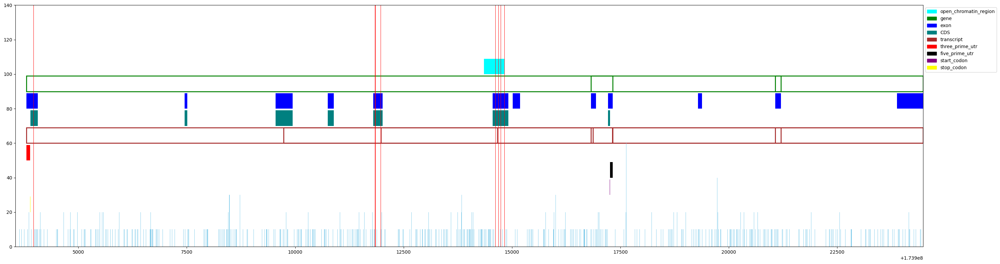

gene_#=3,exon_#=21,cds_#=7,var_#=4850,path_#=50
transcript_#=6,prime3_#=1,prime5_#=1,start_codon_#=1,stop_codon_#=1
promoter_#=0,enhancer_#=0,ctcf_#=0,open_#=1
sentence_id=193, begin=174996630, gene_start=174997479, gene_end=175036867, span=40237, prefix=849


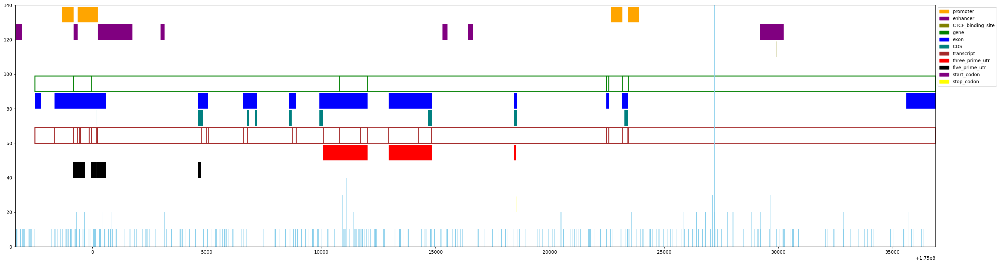

gene_#=5,exon_#=52,cds_#=26,var_#=10282,path_#=1
transcript_#=17,prime3_#=5,prime5_#=9,start_codon_#=7,stop_codon_#=6
promoter_#=4,enhancer_#=7,ctcf_#=1,open_#=0
sentence_id=194, begin=175204850, gene_start=175278297, gene_end=175743595, span=538745, prefix=73447


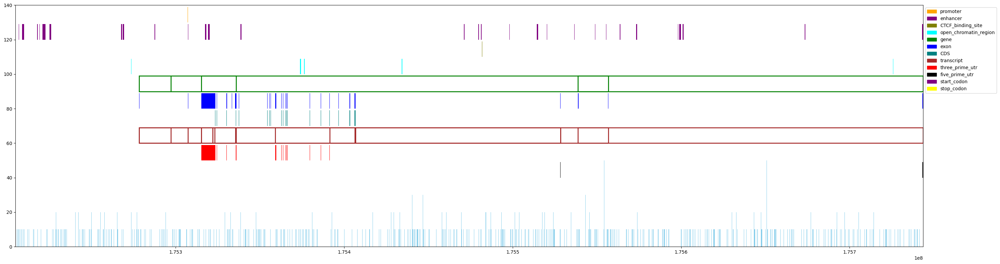

gene_#=4,exon_#=115,cds_#=84,var_#=133616,path_#=4
transcript_#=11,prime3_#=18,prime5_#=7,start_codon_#=5,stop_codon_#=5
promoter_#=2,enhancer_#=30,ctcf_#=15,open_#=5
sentence_id=195, begin=179358681, gene_start=179365720, gene_end=179575952, span=217271, prefix=7039


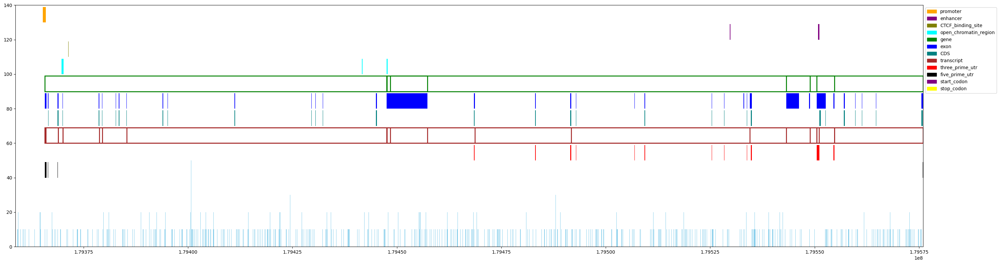

gene_#=5,exon_#=173,cds_#=101,var_#=56750,path_#=25
transcript_#=19,prime3_#=25,prime5_#=14,start_codon_#=8,stop_codon_#=6
promoter_#=1,enhancer_#=2,ctcf_#=3,open_#=3
sentence_id=196, begin=179877804, gene_start=179881607, gene_end=179920077, span=42273, prefix=3803


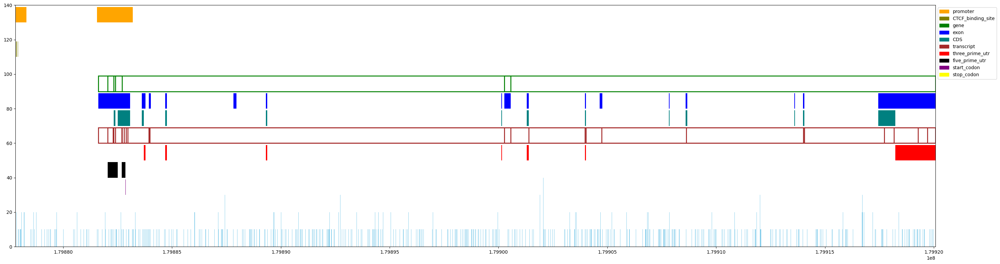

gene_#=4,exon_#=104,cds_#=65,var_#=10872,path_#=1
transcript_#=15,prime3_#=10,prime5_#=4,start_codon_#=5,stop_codon_#=6
promoter_#=2,enhancer_#=0,ctcf_#=2,open_#=0
sentence_id=197, begin=180204031, gene_start=180230264, gene_end=180502954, span=298923, prefix=26233


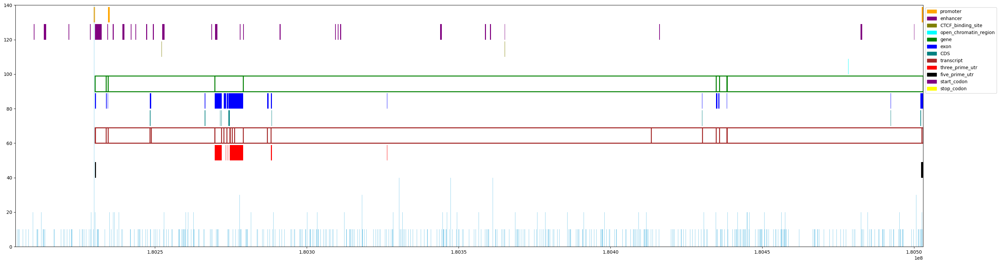

gene_#=5,exon_#=77,cds_#=32,var_#=72571,path_#=1
transcript_#=14,prime3_#=20,prime5_#=4,start_codon_#=4,stop_codon_#=5
promoter_#=3,enhancer_#=28,ctcf_#=13,open_#=1
sentence_id=198, begin=180611436, gene_start=180632022, gene_end=180912609, span=301173, prefix=20586


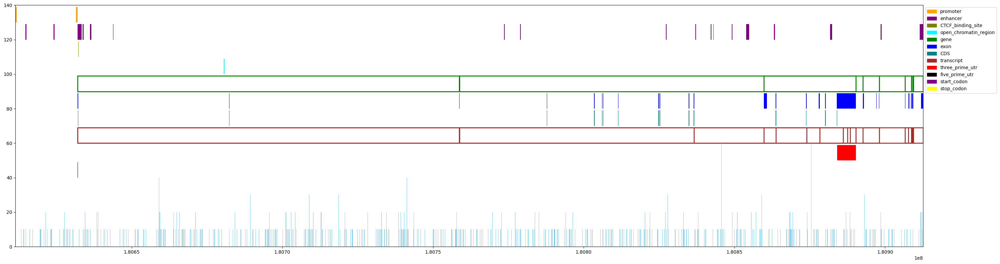

gene_#=6,exon_#=53,cds_#=29,var_#=78515,path_#=1
transcript_#=11,prime3_#=2,prime5_#=2,start_codon_#=2,stop_codon_#=2
promoter_#=3,enhancer_#=18,ctcf_#=5,open_#=1
sentence_id=199, begin=181238605, gene_start=181317690, gene_end=181998990, span=760385, prefix=79085


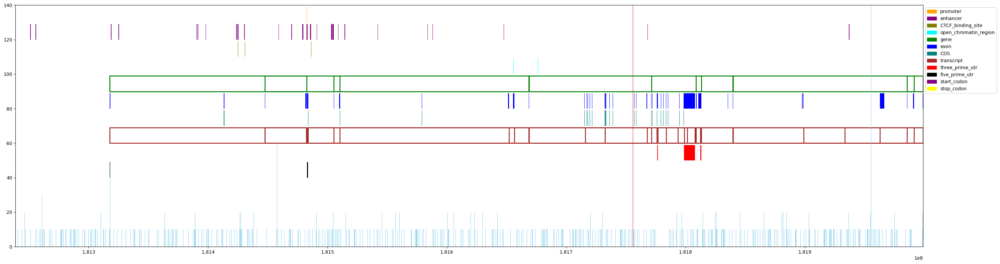

gene_#=8,exon_#=301,cds_#=225,var_#=173754,path_#=20
transcript_#=28,prime3_#=6,prime5_#=6,start_codon_#=5,stop_codon_#=6
promoter_#=1,enhancer_#=29,ctcf_#=22,open_#=3
sentence_id=200, begin=182336335, gene_start=182378098, gene_end=182394424, span=58089, prefix=41763


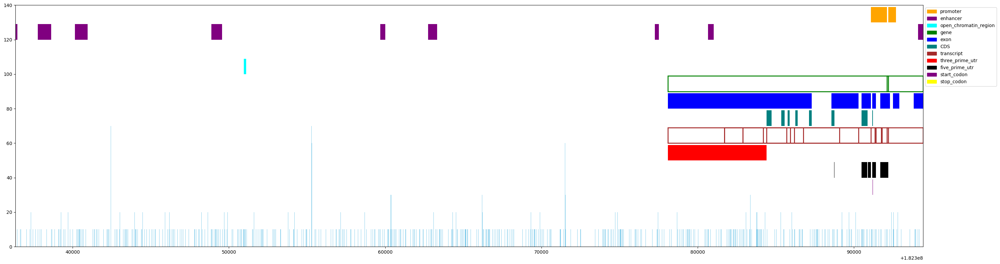

gene_#=2,exon_#=61,cds_#=33,var_#=14896,path_#=1
transcript_#=12,prime3_#=5,prime5_#=9,start_codon_#=4,stop_codon_#=5
promoter_#=2,enhancer_#=9,ctcf_#=0,open_#=1
sentence_id=201, begin=182560600, gene_start=182573634, gene_end=182589256, span=28656, prefix=13034


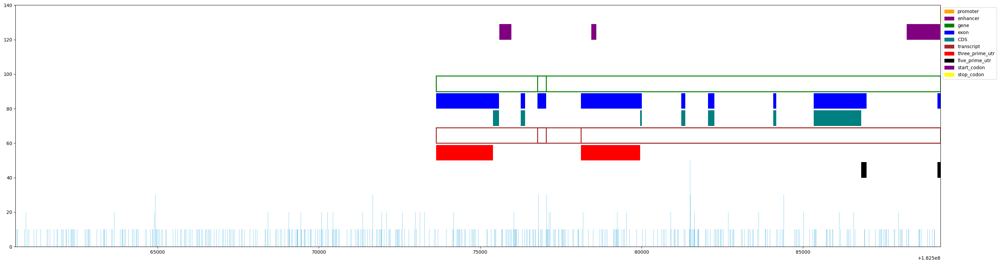

gene_#=2,exon_#=14,cds_#=11,var_#=6436,path_#=2
transcript_#=3,prime3_#=2,prime5_#=4,start_codon_#=2,stop_codon_#=2
promoter_#=1,enhancer_#=3,ctcf_#=0,open_#=0
sentence_id=202, begin=183145593, gene_start=183186238, gene_end=183245127, span=99534, prefix=40645


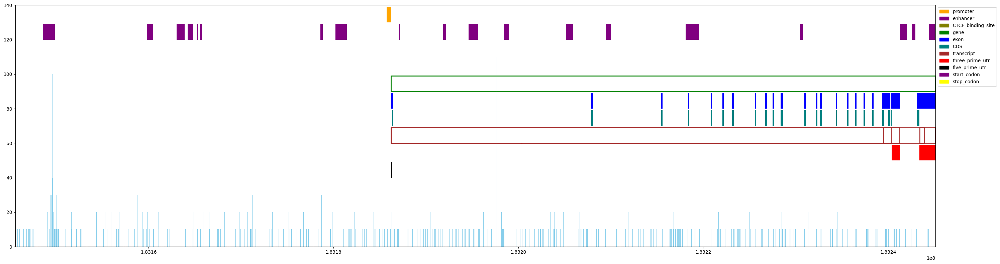

gene_#=1,exon_#=50,cds_#=45,var_#=24272,path_#=1
transcript_#=4,prime3_#=2,prime5_#=2,start_codon_#=2,stop_codon_#=2
promoter_#=1,enhancer_#=19,ctcf_#=3,open_#=0
sentence_id=203, begin=183418381, gene_start=183433854, gene_end=183598246, span=179865, prefix=15473


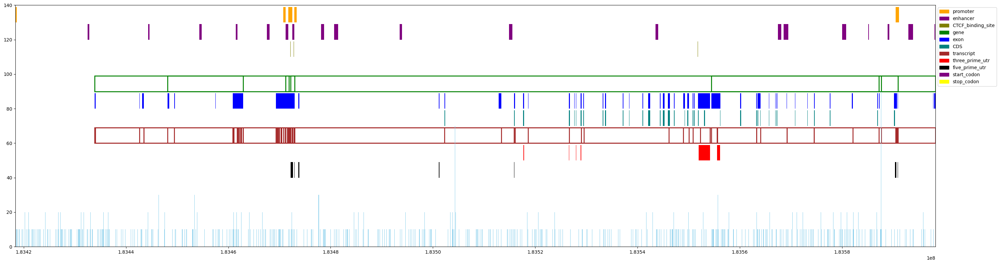

gene_#=6,exon_#=520,cds_#=271,var_#=41718,path_#=3
transcript_#=81,prime3_#=18,prime5_#=27,start_codon_#=17,stop_codon_#=15
promoter_#=5,enhancer_#=19,ctcf_#=6,open_#=0
sentence_id=204, begin=184037730, gene_start=184051651, gene_end=184154600, span=116870, prefix=13921


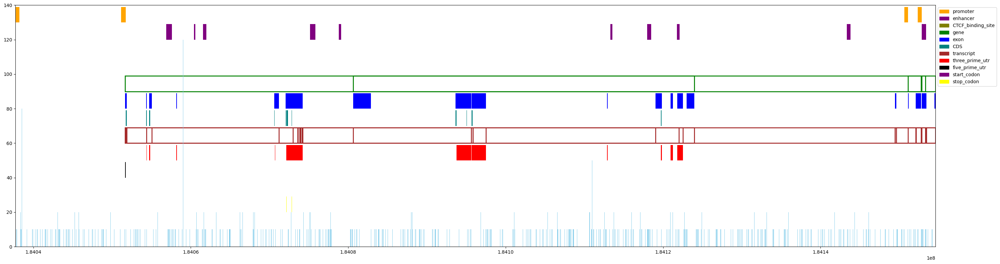

gene_#=4,exon_#=110,cds_#=67,var_#=26559,path_#=1
transcript_#=28,prime3_#=33,prime5_#=12,start_codon_#=15,stop_codon_#=17
promoter_#=4,enhancer_#=10,ctcf_#=1,open_#=0
sentence_id=205, begin=193121740, gene_start=193121983, gene_end=193254815, span=133075, prefix=243


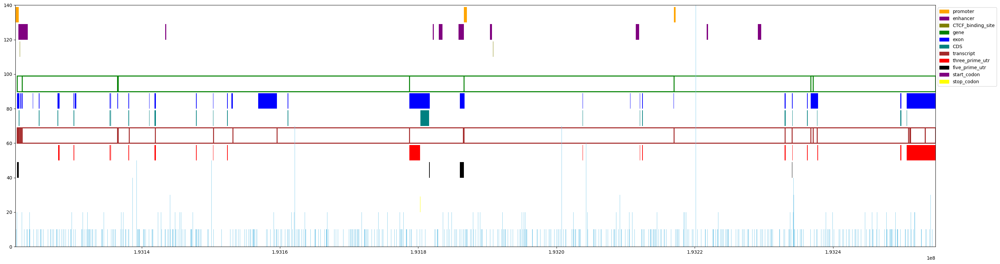

gene_#=5,exon_#=189,cds_#=92,var_#=34924,path_#=2
transcript_#=19,prime3_#=35,prime5_#=10,start_codon_#=9,stop_codon_#=9
promoter_#=3,enhancer_#=9,ctcf_#=7,open_#=0
sentence_id=206, begin=196187763, gene_start=196225779, gene_end=196609225, span=421462, prefix=38016


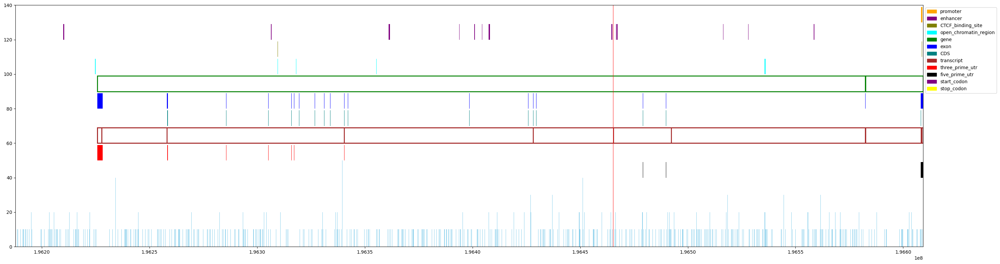

gene_#=2,exon_#=192,cds_#=119,var_#=108692,path_#=7
transcript_#=10,prime3_#=25,prime5_#=14,start_codon_#=6,stop_codon_#=6
promoter_#=1,enhancer_#=13,ctcf_#=4,open_#=5
sentence_id=207, begin=196609226, gene_start=196651754, gene_end=196795407, span=186181, prefix=42528


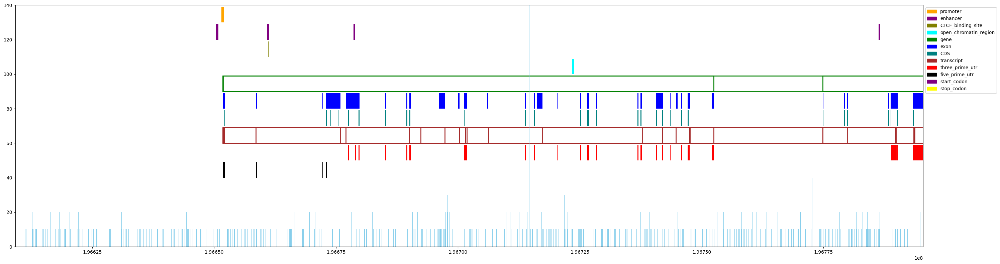

gene_#=3,exon_#=651,cds_#=437,var_#=51802,path_#=16
transcript_#=46,prime3_#=103,prime5_#=35,start_codon_#=32,stop_codon_#=30
promoter_#=1,enhancer_#=4,ctcf_#=4,open_#=1
sentence_id=208, begin=196795408, gene_start=196819731, gene_end=196837159, span=41751, prefix=24323


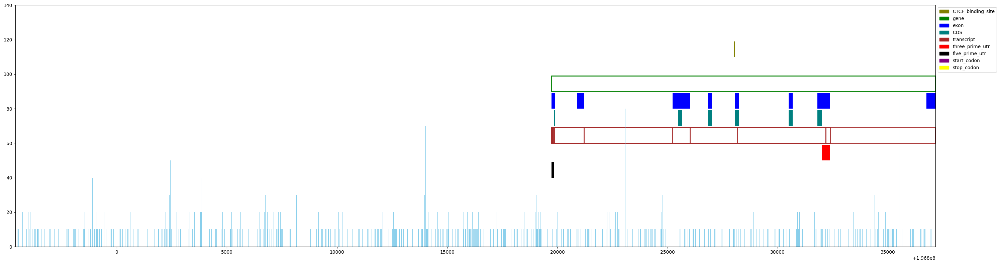

gene_#=1,exon_#=36,cds_#=22,var_#=13789,path_#=2
transcript_#=8,prime3_#=4,prime5_#=4,start_codon_#=4,stop_codon_#=4
promoter_#=0,enhancer_#=0,ctcf_#=1,open_#=0
sentence_id=209, begin=197067261, gene_start=197084121, gene_end=197146694, span=79433, prefix=16860


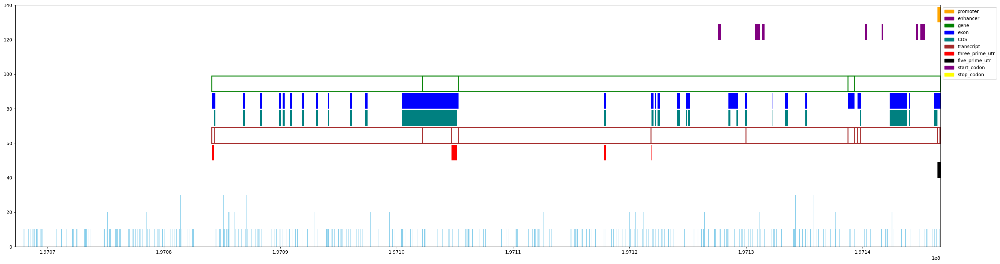

gene_#=3,exon_#=169,cds_#=128,var_#=18090,path_#=1
transcript_#=10,prime3_#=6,prime5_#=3,start_codon_#=5,stop_codon_#=5
promoter_#=1,enhancer_#=7,ctcf_#=0,open_#=0
sentence_id=210, begin=197229194, gene_start=197268204, gene_end=197478455, span=249261, prefix=39010


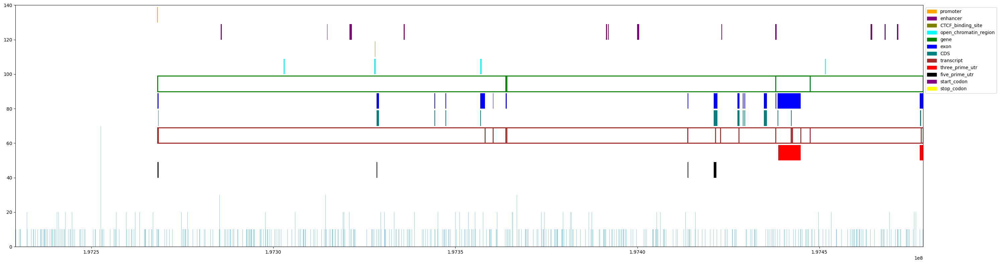

gene_#=3,exon_#=97,cds_#=80,var_#=60880,path_#=148
transcript_#=14,prime3_#=9,prime5_#=9,start_codon_#=8,stop_codon_#=9
promoter_#=1,enhancer_#=12,ctcf_#=5,open_#=4
sentence_id=211, begin=198598887, gene_start=198638457, gene_end=198937683, span=338796, prefix=39570


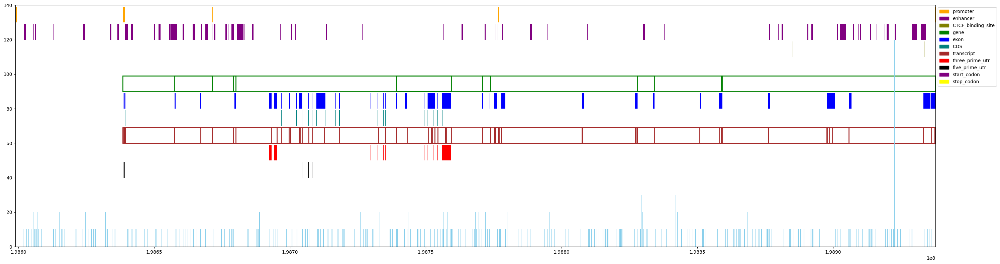

gene_#=8,exon_#=373,cds_#=205,var_#=77914,path_#=1
transcript_#=50,prime3_#=23,prime5_#=30,start_codon_#=13,stop_codon_#=7
promoter_#=5,enhancer_#=60,ctcf_#=15,open_#=0
sentence_id=212, begin=200620752, gene_start=200623896, gene_end=200694250, span=73498, prefix=3144


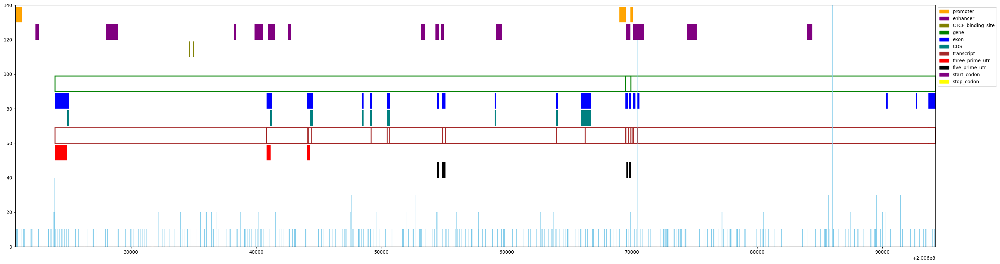

gene_#=2,exon_#=54,cds_#=31,var_#=20477,path_#=1
transcript_#=13,prime3_#=5,prime5_#=12,start_codon_#=5,stop_codon_#=5
promoter_#=3,enhancer_#=14,ctcf_#=3,open_#=0
sentence_id=213, begin=201023715, gene_start=201023869, gene_end=201112451, span=88736, prefix=154


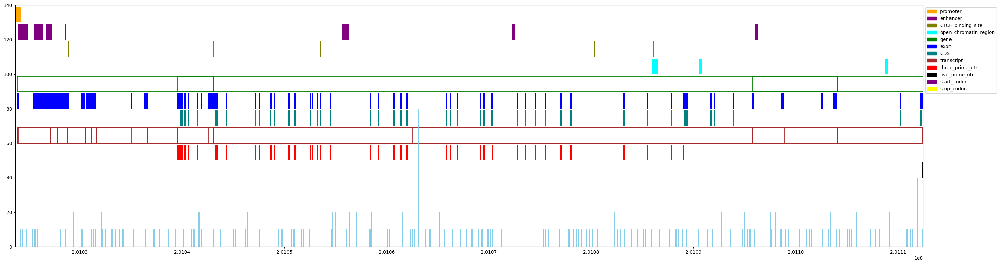

gene_#=3,exon_#=456,cds_#=264,var_#=22361,path_#=20
transcript_#=37,prime3_#=95,prime5_#=8,start_codon_#=8,stop_codon_#=8
promoter_#=1,enhancer_#=7,ctcf_#=5,open_#=3
sentence_id=214, begin=201356379, gene_start=201359008, gene_end=201401558, span=45179, prefix=2629


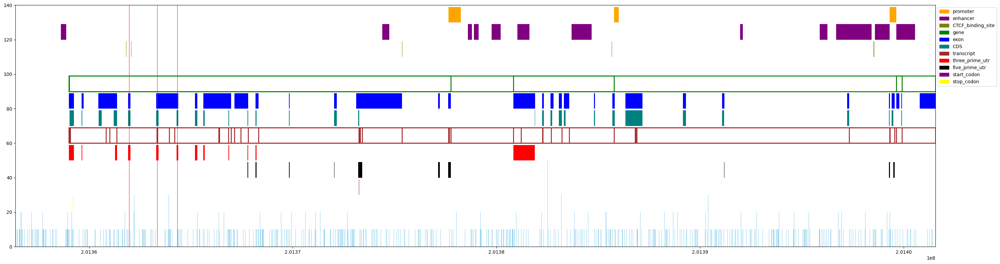

gene_#=4,exon_#=450,cds_#=289,var_#=11177,path_#=59
transcript_#=42,prime3_#=42,prime5_#=52,start_codon_#=23,stop_codon_#=22
promoter_#=3,enhancer_#=12,ctcf_#=5,open_#=0
sentence_id=215, begin=202319782, gene_start=202331544, gene_end=202341984, span=22202, prefix=11762


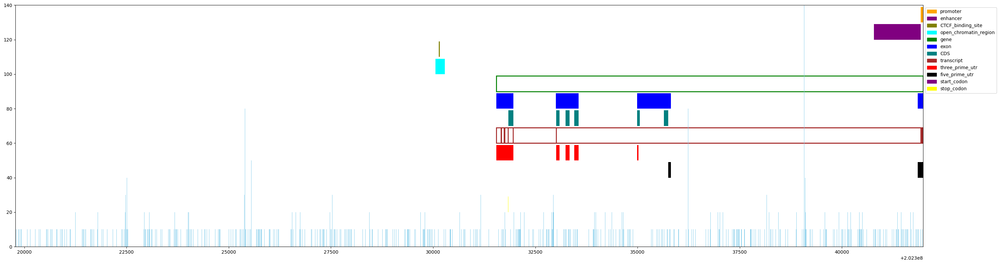

gene_#=1,exon_#=72,cds_#=33,var_#=5891,path_#=1
transcript_#=12,prime3_#=12,prime5_#=14,start_codon_#=7,stop_codon_#=7
promoter_#=1,enhancer_#=1,ctcf_#=1,open_#=1
sentence_id=216, begin=202341985, gene_start=202348699, gene_end=202710454, span=368469, prefix=6714


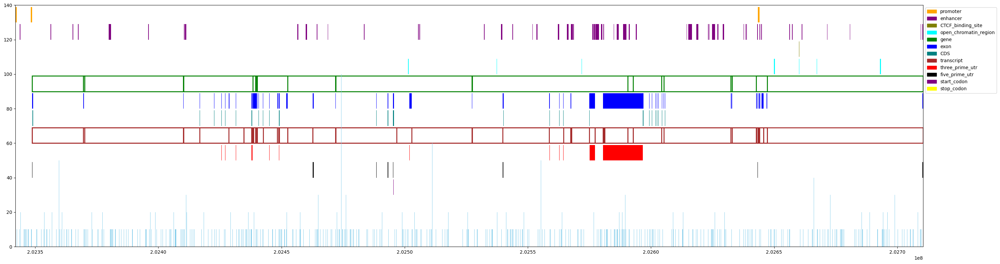

gene_#=12,exon_#=234,cds_#=146,var_#=86248,path_#=3
transcript_#=40,prime3_#=25,prime5_#=19,start_codon_#=11,stop_codon_#=13
promoter_#=4,enhancer_#=55,ctcf_#=13,open_#=7
sentence_id=217, begin=204152045, gene_start=204154819, gene_end=204190324, span=38279, prefix=2774


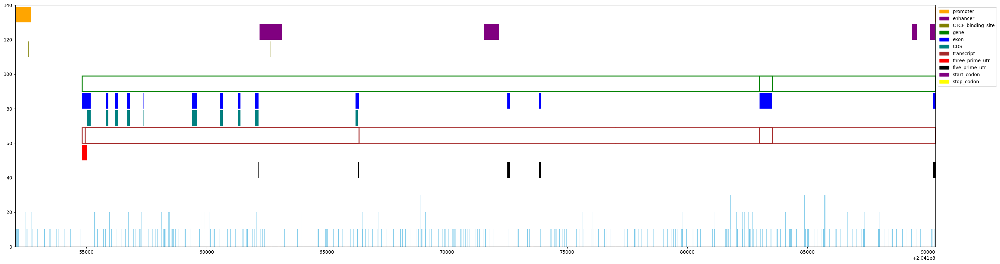

gene_#=2,exon_#=23,cds_#=19,var_#=9860,path_#=2
transcript_#=3,prime3_#=2,prime5_#=5,start_codon_#=2,stop_codon_#=2
promoter_#=2,enhancer_#=4,ctcf_#=3,open_#=0
sentence_id=218, begin=204213989, gene_start=204218853, gene_end=204494805, span=280816, prefix=4864


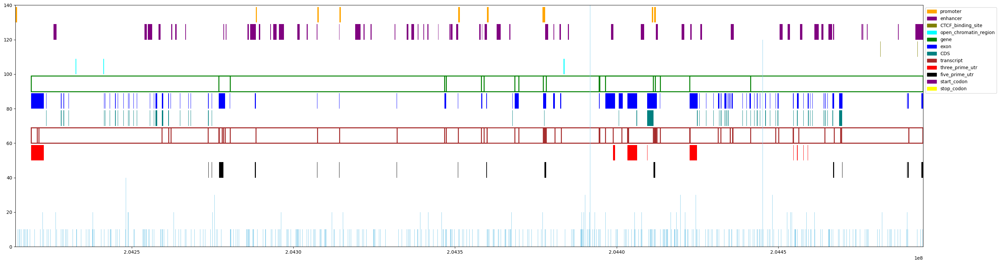

gene_#=10,exon_#=409,cds_#=294,var_#=66258,path_#=1
transcript_#=43,prime3_#=30,prime5_#=45,start_codon_#=20,stop_codon_#=16
promoter_#=10,enhancer_#=60,ctcf_#=20,open_#=3
sentence_id=219, begin=205140499, gene_start=205142505, gene_end=205211702, span=71203, prefix=2006


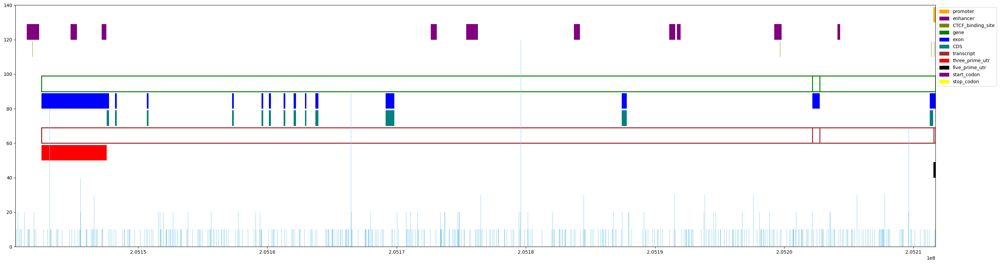

gene_#=2,exon_#=26,cds_#=25,var_#=18078,path_#=1
transcript_#=3,prime3_#=2,prime5_#=2,start_codon_#=2,stop_codon_#=2
promoter_#=1,enhancer_#=10,ctcf_#=5,open_#=0
sentence_id=220, begin=207424880, gene_start=207453024, gene_end=207489895, span=65015, prefix=28144


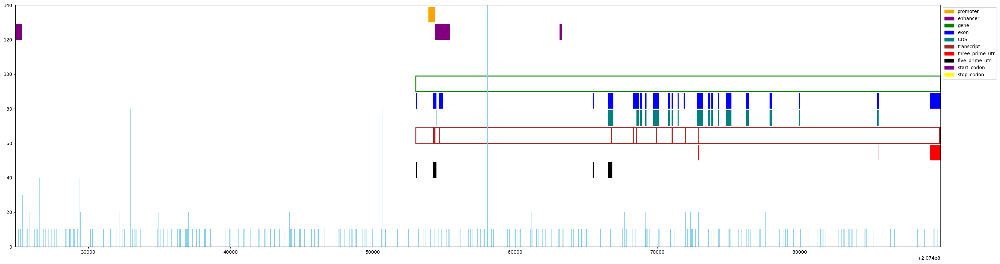

gene_#=1,exon_#=109,cds_#=91,var_#=14881,path_#=2
transcript_#=10,prime3_#=11,prime5_#=9,start_codon_#=5,stop_codon_#=6
promoter_#=1,enhancer_#=3,ctcf_#=0,open_#=0
sentence_id=221, begin=207751949, gene_start=207752037, gene_end=207879121, span=127172, prefix=88


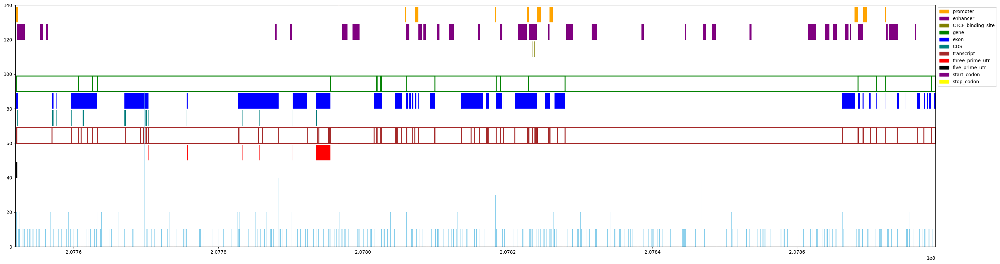

gene_#=10,exon_#=559,cds_#=179,var_#=31095,path_#=5
transcript_#=99,prime3_#=31,prime5_#=16,start_codon_#=16,stop_codon_#=17
promoter_#=10,enhancer_#=33,ctcf_#=14,open_#=0
sentence_id=222, begin=209613940, gene_start=209614870, gene_end=209652425, span=38485, prefix=930


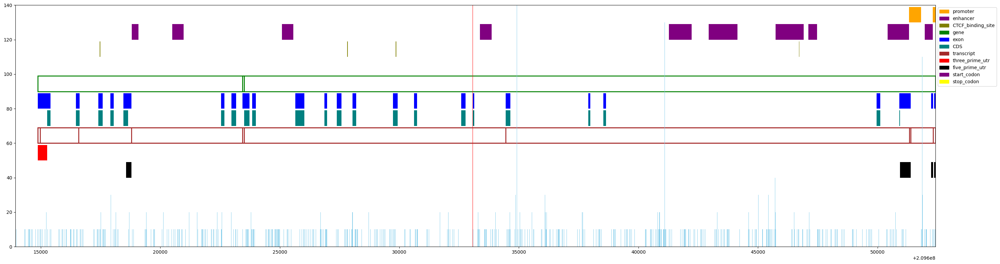

gene_#=2,exon_#=79,cds_#=75,var_#=8994,path_#=7
transcript_#=6,prime3_#=3,prime5_#=8,start_codon_#=5,stop_codon_#=3
promoter_#=2,enhancer_#=10,ctcf_#=4,open_#=0
sentence_id=223, begin=209659005, gene_start=209661354, gene_end=209806179, span=147174, prefix=2349


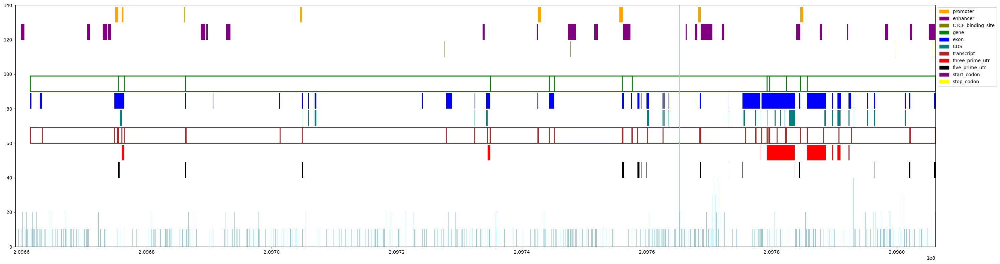

gene_#=8,exon_#=252,cds_#=144,var_#=34484,path_#=36
transcript_#=44,prime3_#=25,prime5_#=54,start_codon_#=21,stop_codon_#=17
promoter_#=9,enhancer_#=22,ctcf_#=13,open_#=0
sentence_id=224, begin=210676297, gene_start=210676823, gene_end=211207138, span=530841, prefix=526


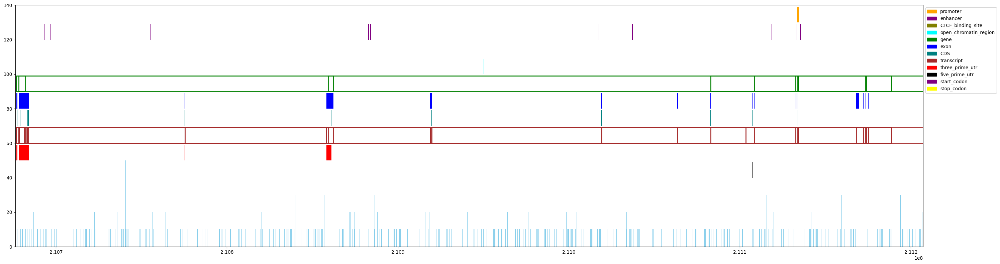

gene_#=7,exon_#=179,cds_#=130,var_#=129021,path_#=20
transcript_#=27,prime3_#=21,prime5_#=15,start_codon_#=14,stop_codon_#=15
promoter_#=1,enhancer_#=14,ctcf_#=10,open_#=2
sentence_id=225, begin=211654628, gene_start=211658657, gene_end=211675630, span=21002, prefix=4029


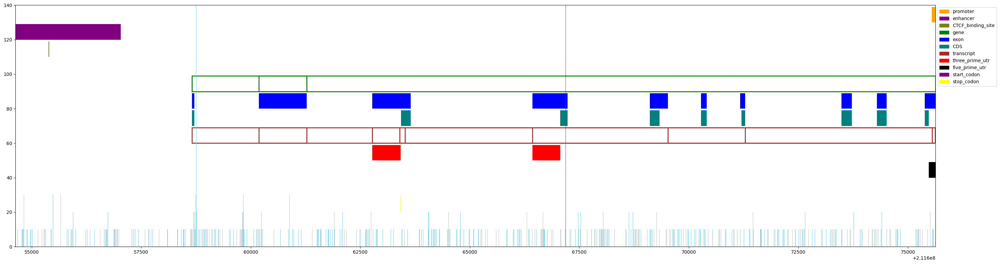

gene_#=2,exon_#=32,cds_#=23,var_#=4493,path_#=2
transcript_#=6,prime3_#=2,prime5_#=3,start_codon_#=3,stop_codon_#=3
promoter_#=1,enhancer_#=1,ctcf_#=1,open_#=0
sentence_id=226, begin=212847650, gene_start=212852105, gene_end=212914896, span=67246, prefix=4455


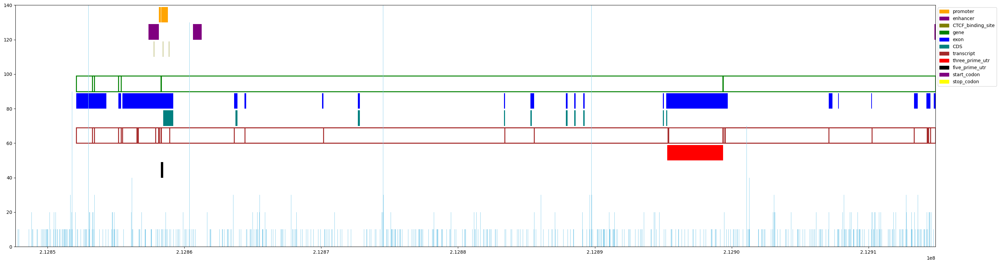

gene_#=5,exon_#=73,cds_#=19,var_#=20770,path_#=9
transcript_#=23,prime3_#=2,prime5_#=1,start_codon_#=1,stop_codon_#=2
promoter_#=2,enhancer_#=3,ctcf_#=4,open_#=0
sentence_id=227, begin=215621808, gene_start=215622891, gene_end=216423448, span=801640, prefix=1083


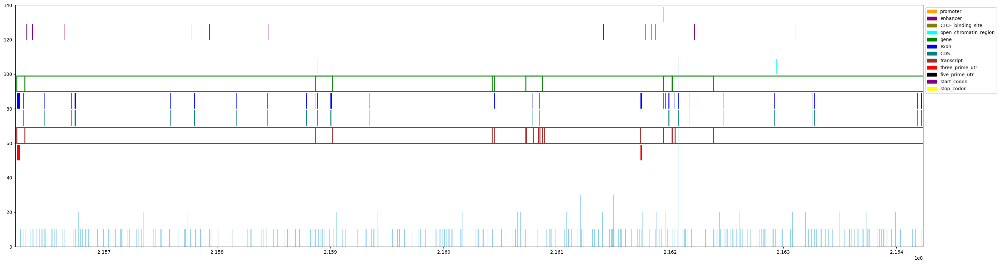

gene_#=7,exon_#=201,cds_#=163,var_#=198458,path_#=308
transcript_#=17,prime3_#=3,prime5_#=6,start_codon_#=3,stop_codon_#=3
promoter_#=1,enhancer_#=24,ctcf_#=18,open_#=7
sentence_id=228, begin=218338757, gene_start=218344145, gene_end=218444619, span=105862, prefix=5388


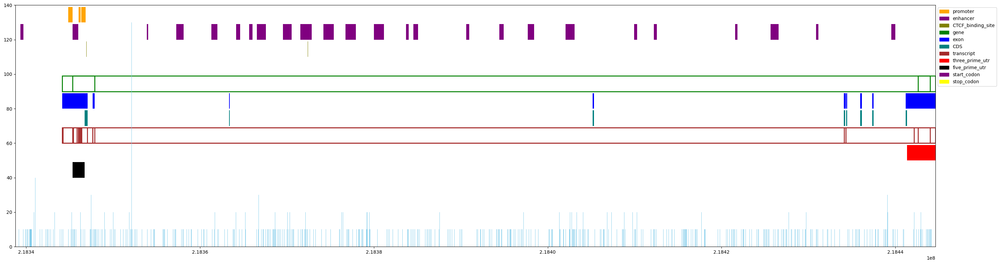

gene_#=3,exon_#=98,cds_#=15,var_#=25416,path_#=12
transcript_#=33,prime3_#=2,prime5_#=2,start_codon_#=2,stop_codon_#=2
promoter_#=3,enhancer_#=25,ctcf_#=4,open_#=0
sentence_id=229, begin=219962866, gene_start=219968600, gene_end=220046530, span=83664, prefix=5734


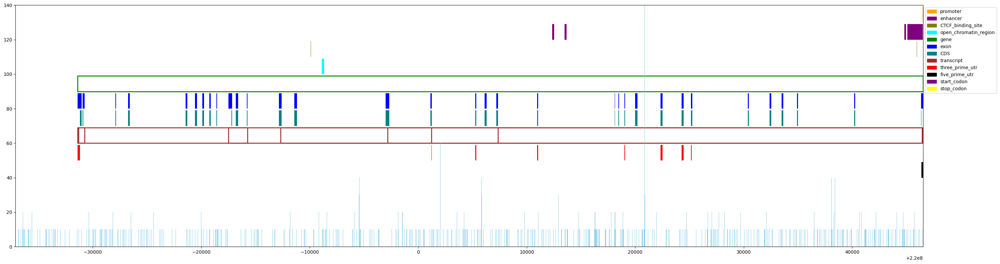

gene_#=1,exon_#=75,cds_#=59,var_#=21283,path_#=3
transcript_#=6,prime3_#=8,prime5_#=3,start_codon_#=3,stop_codon_#=2
promoter_#=1,enhancer_#=4,ctcf_#=3,open_#=1
sentence_id=230, begin=220090463, gene_start=220094132, gene_end=220148041, span=57578, prefix=3669


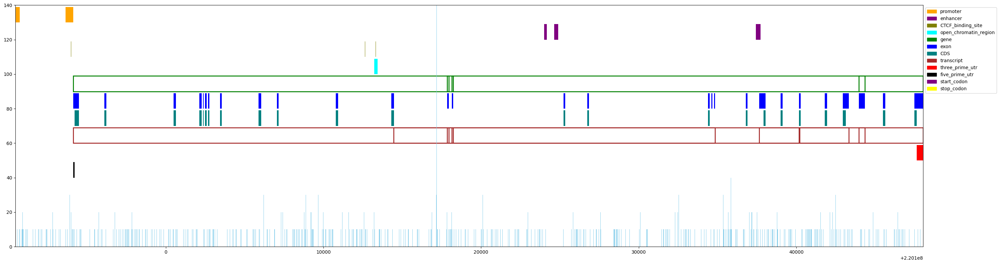

gene_#=4,exon_#=38,cds_#=23,var_#=15025,path_#=2
transcript_#=7,prime3_#=1,prime5_#=1,start_codon_#=1,stop_codon_#=1
promoter_#=2,enhancer_#=3,ctcf_#=3,open_#=1
sentence_id=231, begin=220148042, gene_start=220148293, gene_end=220272529, span=124487, prefix=251


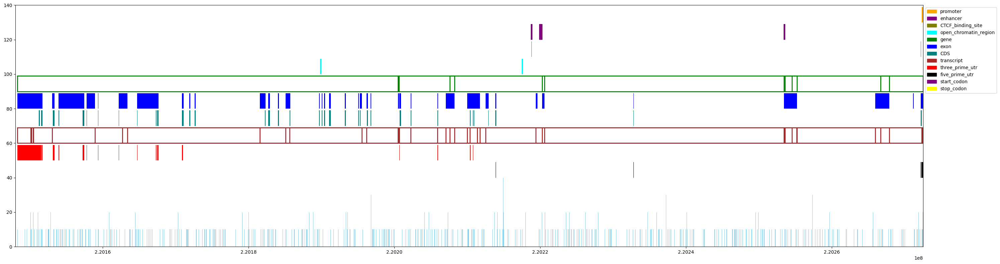

gene_#=8,exon_#=670,cds_#=414,var_#=27529,path_#=3
transcript_#=40,prime3_#=27,prime5_#=22,start_codon_#=14,stop_codon_#=14
promoter_#=1,enhancer_#=3,ctcf_#=5,open_#=2
sentence_id=232, begin=224114071, gene_start=224114111, gene_end=224162047, span=47976, prefix=40


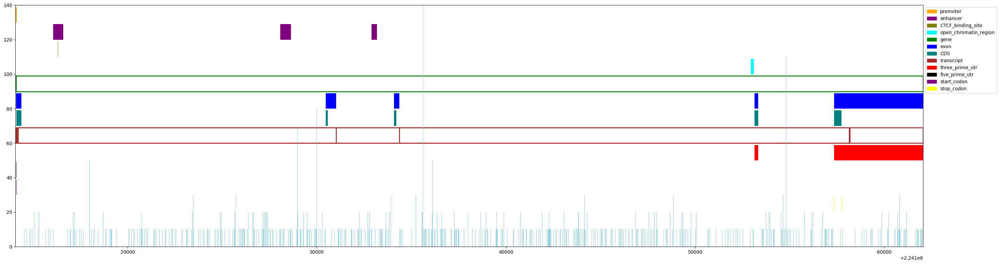

gene_#=1,exon_#=18,cds_#=12,var_#=13936,path_#=1
transcript_#=5,prime3_#=4,prime5_#=3,start_codon_#=3,stop_codon_#=3
promoter_#=1,enhancer_#=3,ctcf_#=1,open_#=1
sentence_id=233, begin=224175707, gene_start=224175756, gene_end=224193441, span=17734, prefix=49


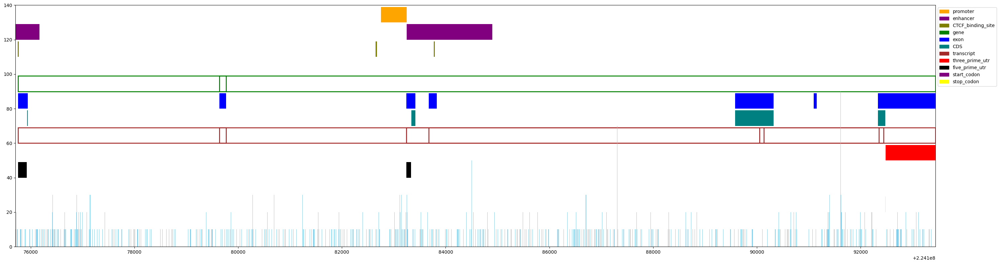

gene_#=2,exon_#=12,cds_#=6,var_#=5105,path_#=5
transcript_#=5,prime3_#=1,prime5_#=2,start_codon_#=2,stop_codon_#=1
promoter_#=1,enhancer_#=2,ctcf_#=3,open_#=0
sentence_id=234, begin=224379460, gene_start=224385146, gene_end=224740554, span=361094, prefix=5686


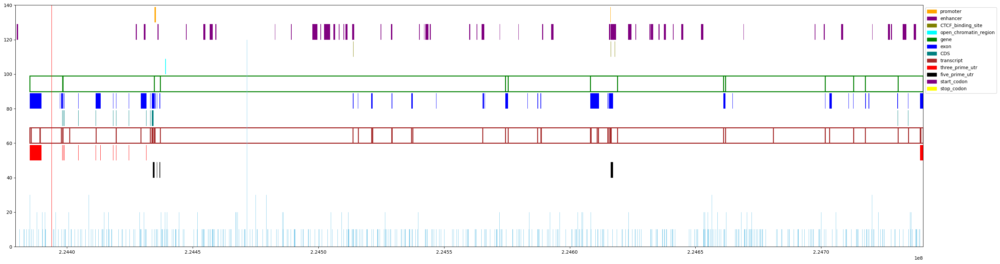

gene_#=8,exon_#=285,cds_#=106,var_#=85417,path_#=11
transcript_#=51,prime3_#=38,prime5_#=8,start_codon_#=3,stop_codon_#=11
promoter_#=2,enhancer_#=51,ctcf_#=17,open_#=1
sentence_id=235, begin=225399293, gene_start=225401502, gene_end=225428925, span=29632, prefix=2209


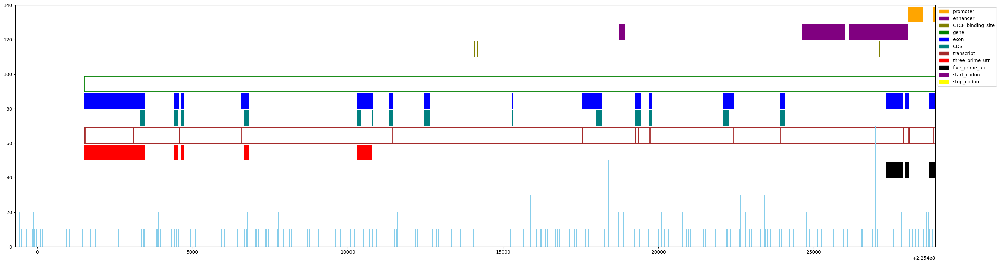

gene_#=1,exon_#=59,cds_#=40,var_#=6959,path_#=9
transcript_#=9,prime3_#=8,prime5_#=10,start_codon_#=5,stop_codon_#=3
promoter_#=2,enhancer_#=3,ctcf_#=3,open_#=0
sentence_id=236, begin=225803449, gene_start=225810124, gene_end=225882380, span=78931, prefix=6675


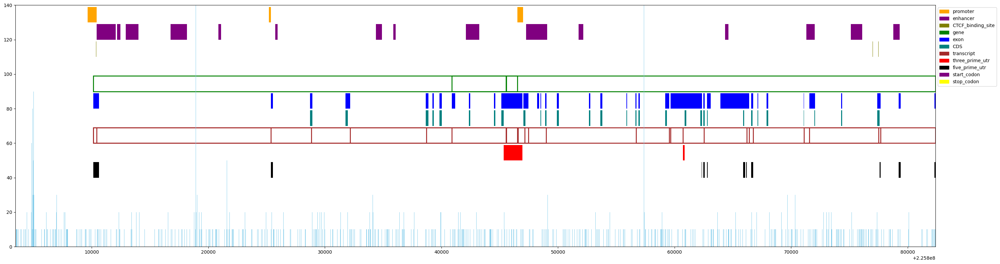

gene_#=3,exon_#=90,cds_#=55,var_#=22692,path_#=3
transcript_#=15,prime3_#=6,prime5_#=18,start_codon_#=7,stop_codon_#=5
promoter_#=4,enhancer_#=15,ctcf_#=5,open_#=0
sentence_id=237, begin=225882381, gene_start=225886282, gene_end=225924340, span=41959, prefix=3901


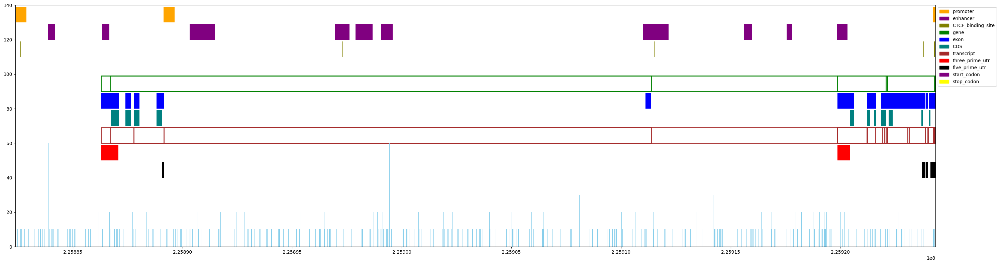

gene_#=4,exon_#=49,cds_#=32,var_#=10717,path_#=7
transcript_#=12,prime3_#=4,prime5_#=7,start_codon_#=6,stop_codon_#=4
promoter_#=3,enhancer_#=10,ctcf_#=5,open_#=0
sentence_id=238, begin=226833907, gene_start=226860405, gene_end=226987545, span=153638, prefix=26498


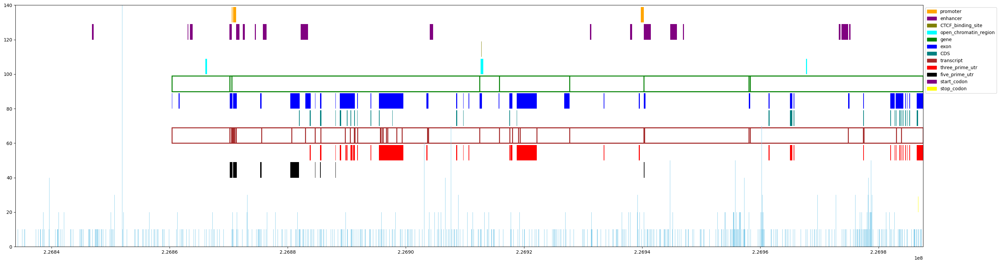

gene_#=6,exon_#=553,cds_#=267,var_#=42062,path_#=29
transcript_#=49,prime3_#=142,prime5_#=119,start_codon_#=33,stop_codon_#=31
promoter_#=3,enhancer_#=18,ctcf_#=4,open_#=3
sentence_id=239, begin=228082509, gene_start=228082708, gene_end=228099212, span=16703, prefix=199


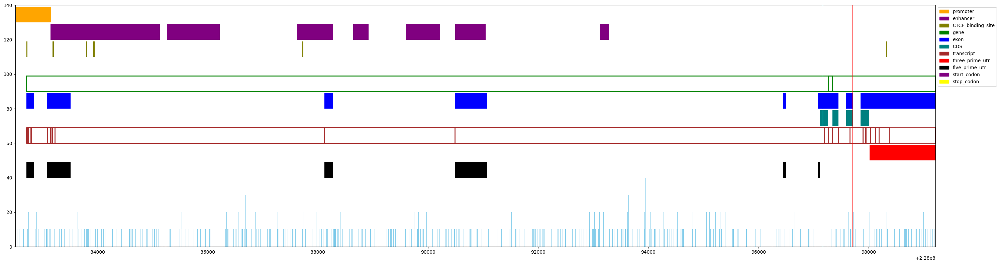

gene_#=2,exon_#=55,cds_#=38,var_#=4304,path_#=10
transcript_#=13,prime3_#=4,prime5_#=23,start_codon_#=11,stop_codon_#=4
promoter_#=1,enhancer_#=7,ctcf_#=6,open_#=0
sentence_id=240, begin=228148985, gene_start=228149930, gene_end=228159826, span=10841, prefix=945


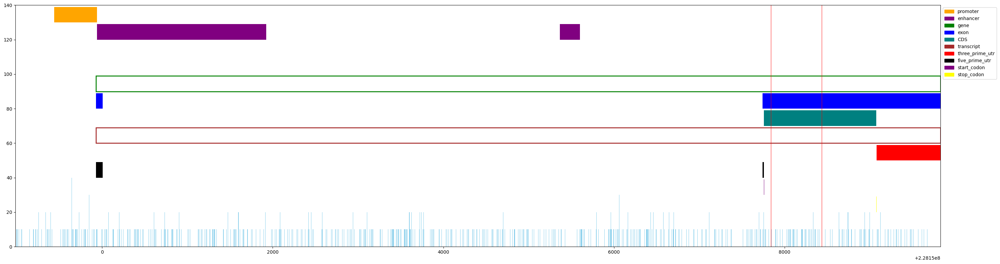

gene_#=1,exon_#=2,cds_#=1,var_#=2999,path_#=15
transcript_#=1,prime3_#=1,prime5_#=2,start_codon_#=1,stop_codon_#=1
promoter_#=1,enhancer_#=2,ctcf_#=0,open_#=0
sentence_id=241, begin=228165585, gene_start=228165804, gene_end=228182257, span=16672, prefix=219


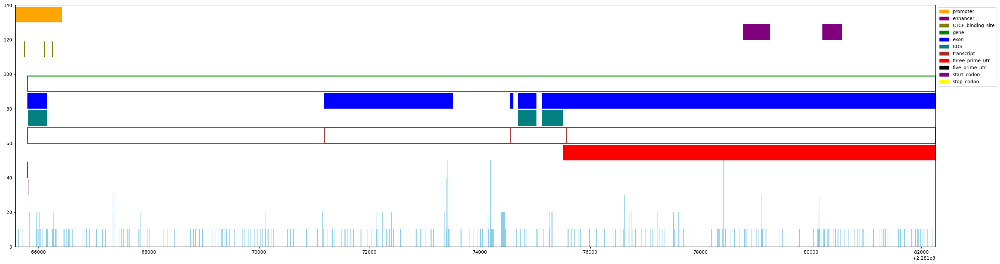

gene_#=1,exon_#=9,cds_#=3,var_#=4787,path_#=3
transcript_#=3,prime3_#=1,prime5_#=1,start_codon_#=1,stop_codon_#=1
promoter_#=1,enhancer_#=2,ctcf_#=3,open_#=0
sentence_id=242, begin=229425651, gene_start=229430365, gene_end=229434104, span=8453, prefix=4714


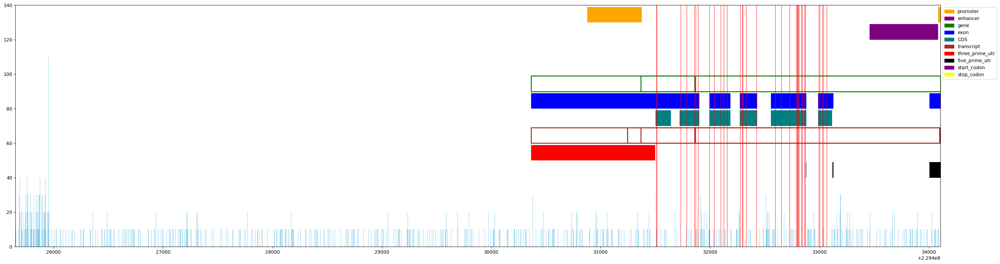

gene_#=2,exon_#=21,cds_#=17,var_#=2425,path_#=152
transcript_#=4,prime3_#=3,prime5_#=6,start_codon_#=3,stop_codon_#=3
promoter_#=2,enhancer_#=1,ctcf_#=0,open_#=0
sentence_id=243, begin=229434105, gene_start=229440259, gene_end=229514401, span=80296, prefix=6154


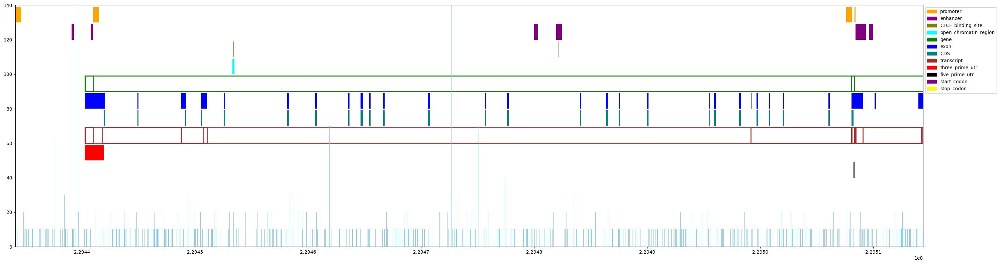

gene_#=3,exon_#=59,cds_#=26,var_#=21113,path_#=3
transcript_#=13,prime3_#=1,prime5_#=1,start_codon_#=1,stop_codon_#=1
promoter_#=4,enhancer_#=6,ctcf_#=3,open_#=1
sentence_id=244, begin=230007254, gene_start=230057990, gene_end=230282122, span=274868, prefix=50736


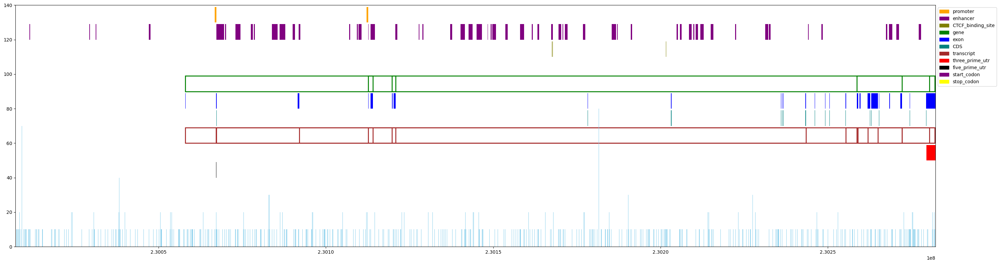

gene_#=5,exon_#=46,cds_#=16,var_#=69872,path_#=3
transcript_#=10,prime3_#=1,prime5_#=1,start_codon_#=1,stop_codon_#=1
promoter_#=2,enhancer_#=56,ctcf_#=14,open_#=0
sentence_id=245, begin=230978876, gene_start=230978981, gene_end=231000733, span=21857, prefix=105


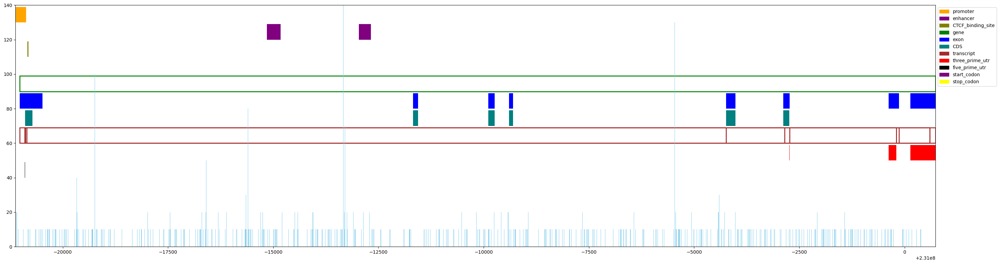

gene_#=1,exon_#=38,cds_#=22,var_#=5126,path_#=1
transcript_#=7,prime3_#=10,prime5_#=2,start_codon_#=2,stop_codon_#=5
promoter_#=1,enhancer_#=2,ctcf_#=1,open_#=0
sentence_id=246, begin=231241188, gene_start=231241207, gene_end=231277973, span=36785, prefix=19


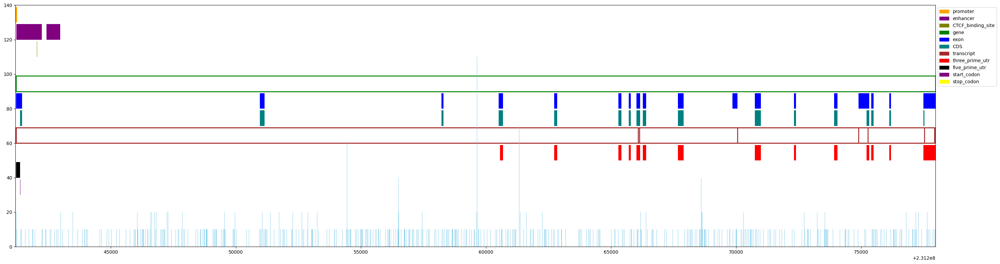

gene_#=1,exon_#=60,cds_#=39,var_#=8410,path_#=2
transcript_#=6,prime3_#=15,prime5_#=4,start_codon_#=4,stop_codon_#=2
promoter_#=1,enhancer_#=2,ctcf_#=1,open_#=0
sentence_id=247, begin=231355024, gene_start=231361081, gene_end=232041272, span=686248, prefix=6057


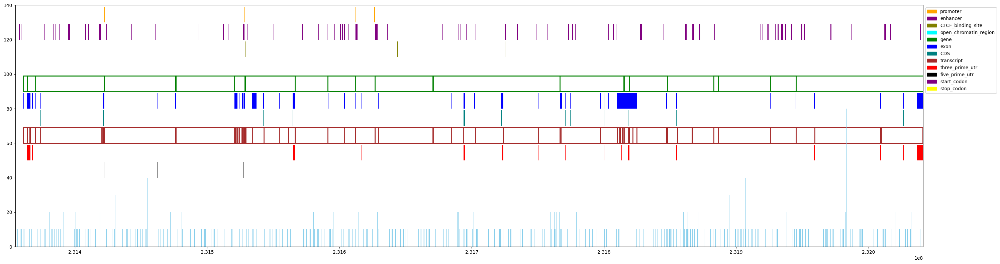

gene_#=14,exon_#=459,cds_#=209,var_#=166575,path_#=1
transcript_#=86,prime3_#=134,prime5_#=35,start_codon_#=32,stop_codon_#=36
promoter_#=4,enhancer_#=88,ctcf_#=26,open_#=3
sentence_id=248, begin=235128838, gene_start=235131183, gene_end=235504452, span=375614, prefix=2345


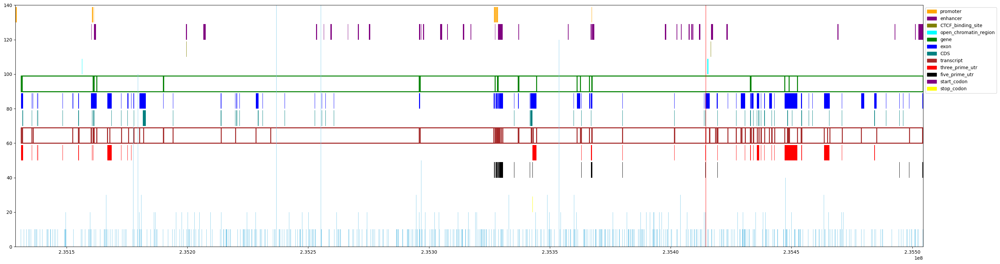

gene_#=13,exon_#=1339,cds_#=601,var_#=110981,path_#=5
transcript_#=127,prime3_#=474,prime5_#=161,start_codon_#=70,stop_codon_#=72
promoter_#=8,enhancer_#=36,ctcf_#=8,open_#=2
sentence_id=249, begin=235657397, gene_start=235661041, gene_end=235883724, span=226327, prefix=3644


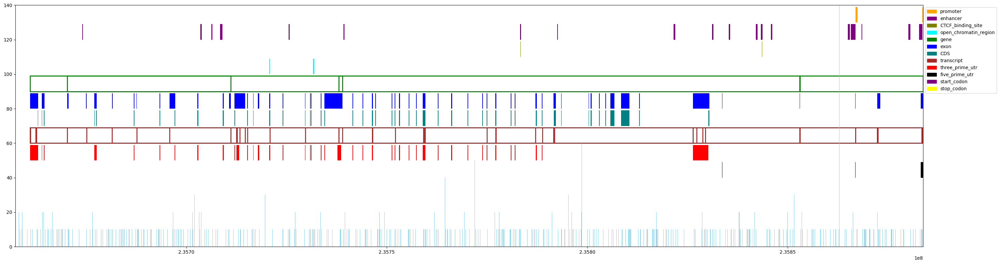

gene_#=4,exon_#=406,cds_#=229,var_#=50310,path_#=4
transcript_#=34,prime3_#=93,prime5_#=30,start_codon_#=10,stop_codon_#=16
promoter_#=2,enhancer_#=19,ctcf_#=5,open_#=2
sentence_id=250, begin=236289854, gene_start=236348257, gene_end=236502915, span=213061, prefix=58403


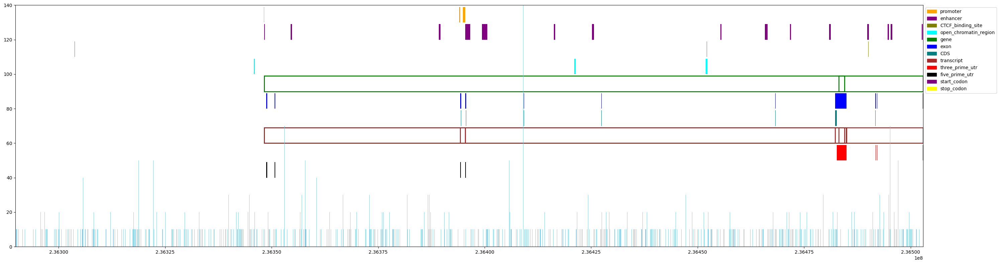

gene_#=2,exon_#=35,cds_#=28,var_#=62106,path_#=6
transcript_#=6,prime3_#=6,prime5_#=9,start_codon_#=5,stop_codon_#=4
promoter_#=3,enhancer_#=15,ctcf_#=4,open_#=3
sentence_id=251, begin=236604517, gene_start=236664141, gene_end=236764631, span=160114, prefix=59624


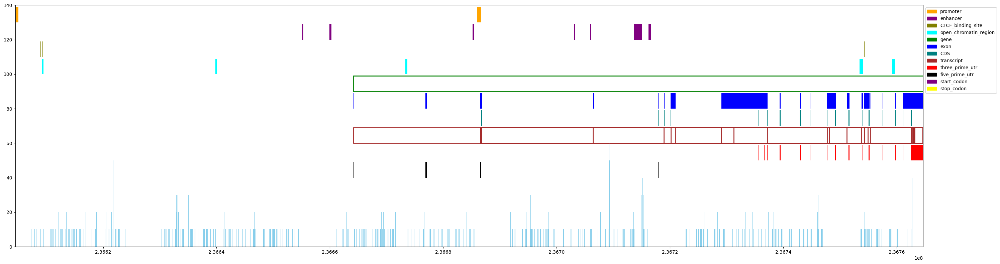

gene_#=1,exon_#=346,cds_#=125,var_#=44663,path_#=6
transcript_#=25,prime3_#=63,prime5_#=9,start_codon_#=8,stop_codon_#=9
promoter_#=2,enhancer_#=7,ctcf_#=7,open_#=5
sentence_id=252, begin=236764632, gene_start=236795260, gene_end=236921278, span=156646, prefix=30628


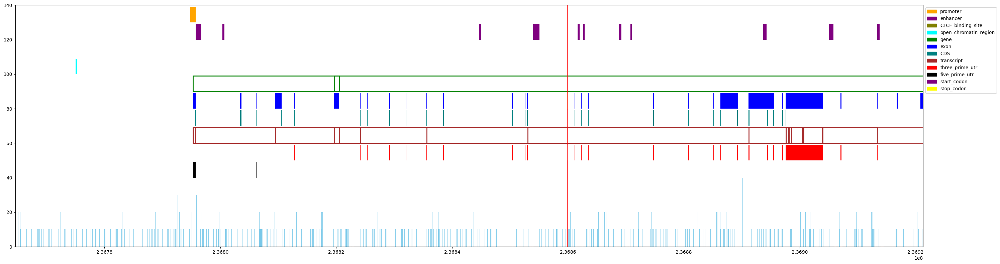

gene_#=2,exon_#=401,cds_#=241,var_#=38308,path_#=9
transcript_#=18,prime3_#=64,prime5_#=11,start_codon_#=10,stop_codon_#=11
promoter_#=1,enhancer_#=11,ctcf_#=3,open_#=1
sentence_id=253, begin=237014201, gene_start=237042184, gene_end=237833988, span=819787, prefix=27983


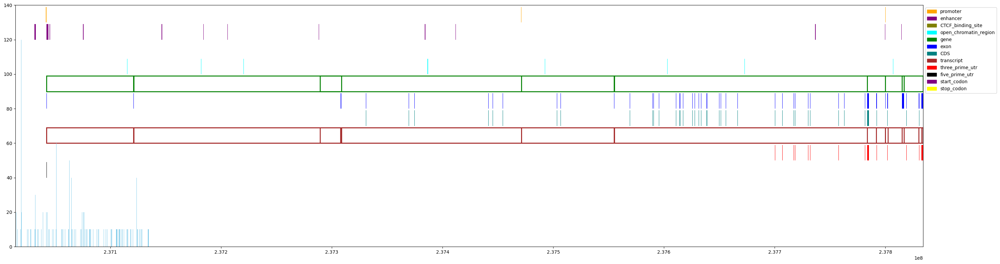

gene_#=7,exon_#=953,cds_#=880,var_#=36086,path_#=196
transcript_#=19,prime3_#=52,prime5_#=12,start_codon_#=9,stop_codon_#=9
promoter_#=3,enhancer_#=17,ctcf_#=13,open_#=11
sentence_id=254, begin=240013279, gene_start=240014348, gene_end=240475187, span=461908, prefix=1069


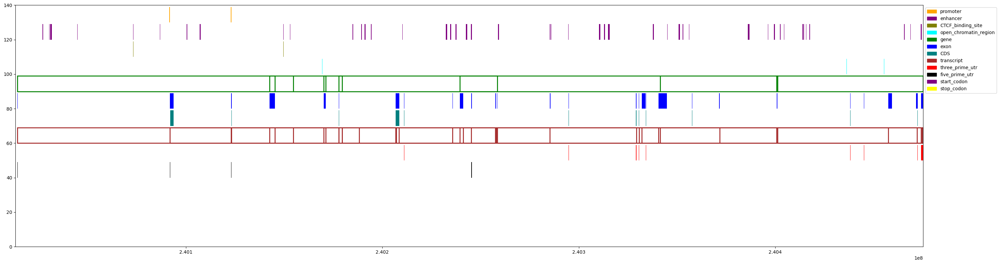

gene_#=8,exon_#=189,cds_#=107,var_#=0,path_#=1
transcript_#=26,prime3_#=25,prime5_#=8,start_codon_#=6,stop_codon_#=8
promoter_#=2,enhancer_#=45,ctcf_#=11,open_#=3
sentence_id=255, begin=240486729, gene_start=240489573, gene_end=240653477, span=166748, prefix=2844


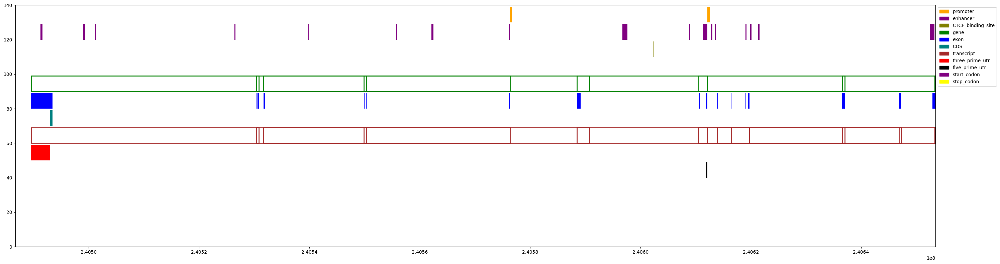

gene_#=8,exon_#=27,cds_#=1,var_#=0,path_#=1
transcript_#=12,prime3_#=1,prime5_#=2,start_codon_#=1,stop_codon_#=1
promoter_#=2,enhancer_#=17,ctcf_#=5,open_#=0
sentence_id=256, begin=241484996, gene_start=241497511, gene_end=241519799, span=34803, prefix=12515


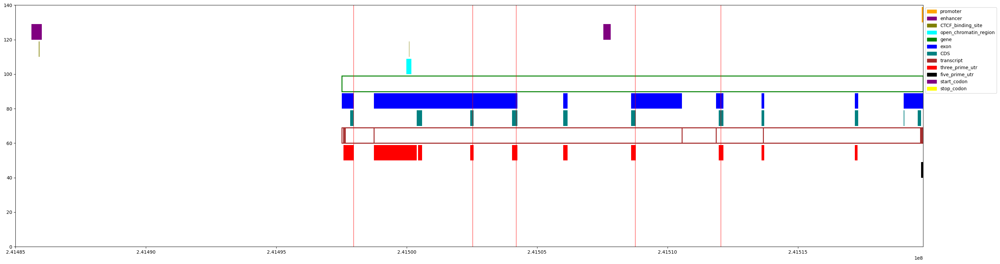

gene_#=1,exon_#=66,cds_#=27,var_#=0,path_#=157
transcript_#=8,prime3_#=17,prime5_#=3,start_codon_#=4,stop_codon_#=4
promoter_#=1,enhancer_#=2,ctcf_#=2,open_#=1
sentence_id=257, begin=243255794, gene_start=243256034, gene_end=243900455, span=644661, prefix=240


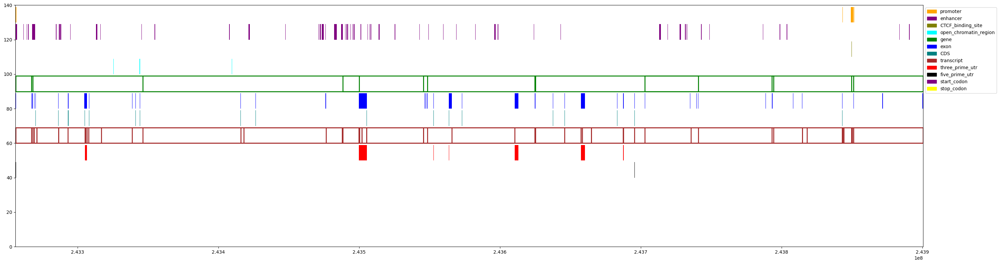

gene_#=9,exon_#=276,cds_#=175,var_#=0,path_#=13
transcript_#=42,prime3_#=26,prime5_#=20,start_codon_#=14,stop_codon_#=18
promoter_#=5,enhancer_#=58,ctcf_#=17,open_#=3
sentence_id=258, begin=244048287, gene_start=244048547, gene_end=244057476, span=9189, prefix=260


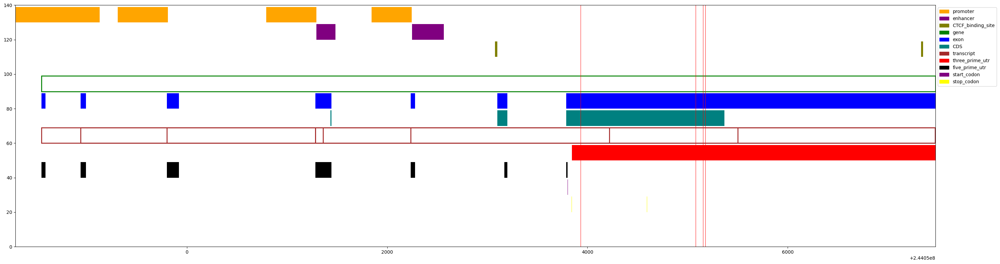

gene_#=1,exon_#=17,cds_#=11,var_#=0,path_#=25
transcript_#=7,prime3_#=6,prime5_#=13,start_codon_#=7,stop_codon_#=6
promoter_#=4,enhancer_#=2,ctcf_#=2,open_#=0
sentence_id=259, begin=244835012, gene_start=244835616, gene_end=244865907, span=30895, prefix=604


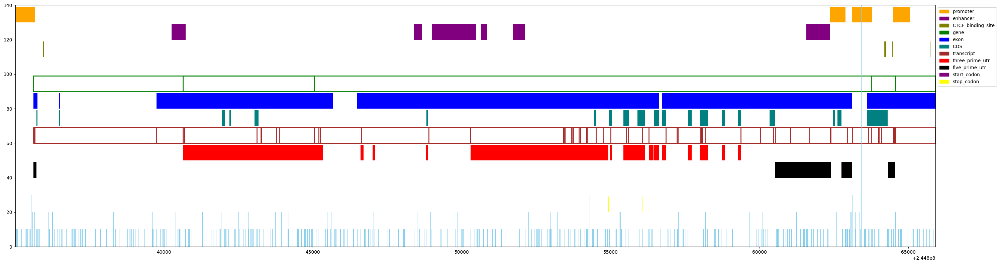

gene_#=3,exon_#=311,cds_#=186,var_#=8979,path_#=9
transcript_#=38,prime3_#=57,prime5_#=12,start_codon_#=12,stop_codon_#=22
promoter_#=4,enhancer_#=6,ctcf_#=5,open_#=0


In [9]:
def compute_intersection(row, segment):
    start = max(row['START'], segment[0])
    end = min(row['END'], segment[1])
    if start <= end:
        return pd.Series([start, end])
    else:
        return pd.Series([None, None])


def intersection(chrom,region_type,start, end):
    if region_type in gen_type_strings:
        segment_df=gen_df[(gen_df['CHROM']==chrom) & (gen_df['REGION_TYPE']==region_type)]
    else:
        segment_df=reg_df[(reg_df['CHROM']==chrom) & (reg_df['REGION_TYPE']==region_type)]

    segment_df = segment_df.copy()
    segment_df[['START', 'END']] = segment_df.apply(compute_intersection, axis=1, segment=(start,end))
    # segment_df.loc[:, ['START', 'END']] = segment_df.apply(compute_intersection, axis=1, segment=(start, end))

    segment_df = segment_df.dropna().reset_index(drop=True)
    
    segment_df.sort_values(by="START")
    return segment_df



def plot_box(ax, x, y, width, height,facecolor, label, bsolid):
    # Create a rectangle
    if bsolid:
        rect = patches.Rectangle((x, y), width, height, linewidth=0, edgecolor=None, facecolor=facecolor)
    else:
        rect = patches.Rectangle((x, y), width, height, linewidth=2, edgecolor=facecolor, facecolor='none')
    ax.add_patch(rect)
    patch = patches.Patch(color=facecolor, label=label)
    return patch


def plot_region_type(ax,legend_patches, chrom,region_type,start, end, facecolor, y, height, bsolid):
    intersection_df=intersection(chrom,region_type,start, end)
    patch=None
    for index, row in intersection_df.iterrows():
        x=row['START']
        width=row['LENGTH'] 
        patch = plot_box(ax, x, y, width, height, facecolor, region_type, bsolid) 

    if patch!=None:
        legend_patches.append(patch)
    return legend_patches, intersection_df



def plot_segment(chrom, begin, end, var_df, path_df):
    plt.clf()
    plt.cla()
    plt.close()
    
    fig, ax = plt.subplots(figsize=(30, 8))
    ax.set_xlim(begin,end)
    ax.set_ylim(0, 140)
    
    legend_patches = []
    height = 9
    
    legend_patches, promoter_seg_df = (plot_region_type(ax,legend_patches,chrom,'promoter',begin, end, 'orange', 130, height, True))
    legend_patches, enhancer_seg_df = (plot_region_type(ax,legend_patches,chrom,'enhancer',begin, end, 'purple', 120, height, True))   
    legend_patches, ctcf_seg_df = (plot_region_type(ax,legend_patches,chrom,'CTCF_binding_site',begin, end, 'olive', 110, height, True))
    legend_patches, open_seg_df = (plot_region_type(ax,legend_patches,chrom,'open_chromatin_region',begin, end, 'cyan', 100, height, True))
                
    legend_patches, gene_seg_df = (plot_region_type(ax,legend_patches,chrom,'gene',begin, end, 'green', 90, height, False))
    legend_patches, exon_seg_df = (plot_region_type(ax,legend_patches,chrom,'exon',begin, end, 'blue', 80, height, True))
    
    legend_patches, cds_seg_df = (plot_region_type(ax,legend_patches,chrom,'CDS',begin, end, 'teal', 70, height, True))
    legend_patches, trspt_seg_df  = (plot_region_type(ax,legend_patches,chrom,'transcript',begin, end, 'brown', 60, height, False))
    
    legend_patches, prime3_seg_df = (plot_region_type(ax,legend_patches,chrom,'three_prime_utr',begin, end, 'red', 50, height, True))
    legend_patches, prime5_seg_df = (plot_region_type(ax,legend_patches,chrom,'five_prime_utr',begin, end, 'black', 40, height, True))
    
    legend_patches, start_codon_seg_df = plot_region_type(ax,legend_patches,chrom,'start_codon',begin, end, 'purple', 30, height, True)
    legend_patches, stop_codon_seg_df  = plot_region_type(ax,legend_patches,chrom,'stop_codon',begin, end, 'yellow', 20, height, True)


    
    var_pos_counts = var_df['POS'].value_counts().sort_index()    
    ax.bar(var_pos_counts.index, var_pos_counts.values*10, color='skyblue')

    path_pos_counts = path_df['POS'].value_counts().sort_index()    
    ax.bar(path_pos_counts.index, 140, color='red')

    # plt.gca().invert_yaxis()  
    ax.legend(handles=legend_patches, loc="upper left", bbox_to_anchor=(1, 1))
    plt.tight_layout()
    plt.savefig(chrom+'-'+str(begin)+'-'+str(end)+'.jpg')
    plt.show()
    return promoter_seg_df,enhancer_seg_df,ctcf_seg_df,open_seg_df,gene_seg_df,exon_seg_df,cds_seg_df,trspt_seg_df,prime3_seg_df,prime5_seg_df,start_codon_seg_df,stop_codon_seg_df, var_pos_counts.sum(), path_pos_counts.sum()


def Draw_Segment(begin, start, end):
    path_segment_df=pathogenicity_df[(pathogenicity_df['CHROM']==chrom) & (pathogenicity_df['POS'] >= begin) & (pathogenicity_df['POS'] <= end)]        
    var_segment_df = get_variant_df(begin,end)
     
    promoter_seg_df,enhancer_seg_df,ctcf_seg_df,open_seg_df,gene_seg_df,exon_seg_df,cds_seg_df,trspt_seg_df,prime3_seg_df,prime5_seg_df,start_codon_seg_df,stop_codon_seg_df, var_pos_counts, path_pos_counts = plot_segment(chrom, begin, end, var_segment_df, path_segment_df)
    
    return promoter_seg_df,enhancer_seg_df,ctcf_seg_df,open_seg_df,gene_seg_df,exon_seg_df,cds_seg_df,trspt_seg_df,prime3_seg_df,prime5_seg_df,start_codon_seg_df,stop_codon_seg_df, var_pos_counts, path_pos_counts


def Draw_Sentence(path_sentence_df, sentence_id):
    begin= path_sentence_df.iloc[sentence_id]['begin']
    start= path_sentence_df.iloc[sentence_id]['start'] 
    end = path_sentence_df.iloc[sentence_id]['end']
    span=path_sentence_df.iloc[sentence_id]['span']
    prefix=path_sentence_df.iloc[sentence_id]['prefix']
    
    print(f"===============================================================================")
    print(f"sentence_id={sentence_id}, begin={begin}, gene_start={start}, gene_end={end}, span={span}, prefix={prefix}")
        
    promoter_seg_df,enhancer_seg_df,ctcf_seg_df,open_seg_df,gene_seg_df,exon_seg_df,cds_seg_df,trspt_seg_df,prime3_seg_df,prime5_seg_df,start_codon_seg_df,stop_codon_seg_df, var_pos_counts, path_pos_counts = Draw_Segment(begin, start, end)
    print(f"gene_#={len(gene_seg_df)},exon_#={len(exon_seg_df)},cds_#={len(cds_seg_df)},var_#={(var_pos_counts)},path_#={(path_pos_counts)}")
    print(f"transcript_#={len(trspt_seg_df)},prime3_#={len(prime3_seg_df)},prime5_#={len(prime5_seg_df)},start_codon_#={len(start_codon_seg_df)},stop_codon_#={len(stop_codon_seg_df)}")
    print(f"promoter_#={len(promoter_seg_df)},enhancer_#={len(enhancer_seg_df)},ctcf_#={len(ctcf_seg_df)},open_#={len(open_seg_df)}")

    # Print_Segment(gen_segment_df, reg_segment_df, path_segment_df, var_segment_df)

    # del gen_segment_df 
    # del reg_segment_df  
    # del path_segment_df 
    # del var_segment_df


    del promoter_seg_df
    del enhancer_seg_df
    del ctcf_seg_df
    del open_seg_df
    del gene_seg_df
    del exon_seg_df
    del cds_seg_df
    del trspt_seg_df
    del prime3_seg_df
    del prime5_seg_df
    del start_codon_seg_df
    del stop_codon_seg_df
    gc.collect()

# Draw_Sentence(path_sentence_df, 158)
# Draw_Sentence(path_sentence_df, 1)
# Draw_Sentence(path_sentence_df, 40)
# Draw_Sentence(path_sentence_df, 59)
# Draw_Sentence(path_sentence_df, 242)

for index, row in path_sentence_df.iterrows():
    Draw_Sentence(path_sentence_df, index)


### Draw a designated pathogenic sentence

In [8]:
def plot_box(ax, x, y, width, height,facecolor, label, bsolid):
    # Create a rectangle
    if bsolid:
        rect = patches.Rectangle((x, y), width, height, linewidth=0, edgecolor=None, facecolor=facecolor)
    else:
        rect = patches.Rectangle((x, y), width, height, linewidth=2, edgecolor=facecolor, facecolor='none')
    ax.add_patch(rect)
    patch = patches.Patch(color=facecolor, label=label)
    return patch


def plot_region_type(ax,legend_patches, chrom,region_type,start, end, facecolor, y, height, bsolid):
    segment_df=segmentation(chrom,region_type,start, end)
    patch=None
    for index, row in segment_df.iterrows():
        x=row['START']
        width=row['LENGTH'] 
        patch = plot_box(ax, x, y, width, height, facecolor, region_type, bsolid) 

    if patch!=None:
        legend_patches.append(patch)
    return legend_patches


def plot_sentence(chrom, begin, end, var_df, path_df):
    plt.clf()
    plt.cla()
    plt.close()
    
    fig, ax = plt.subplots(figsize=(30, 8))
    ax.set_xlim(begin,end)
    ax.set_ylim(0, 140)
    
    legend_patches = []
    height = 9
    
    legend_patches=(plot_region_type(ax,legend_patches,chrom,'promoter',begin, end, 'orange', 130, height, True))
    legend_patches=(plot_region_type(ax,legend_patches,chrom,'enhancer',begin, end, 'purple', 120, height, True))   
    legend_patches=(plot_region_type(ax,legend_patches,chrom,'CTCF_binding_site',begin, end, 'olive', 110, height, True))
    legend_patches=(plot_region_type(ax,legend_patches,chrom,'open_chromatin_region',begin, end, 'cyan', 100, height, True))
                
    legend_patches=(plot_region_type(ax,legend_patches,chrom,'gene',begin, end, 'green', 90, height, False))
    legend_patches=(plot_region_type(ax,legend_patches,chrom,'exon',begin, end, 'blue', 80, height, True))
    
    legend_patches=(plot_region_type(ax,legend_patches,chrom,'CDS',begin, end, 'teal', 70, height, True))
    # legend_patches=(plot_region_type(ax,legend_patches,chrom,'transcript',begin, end, 'brown', 60, height, False))
    
    # legend_patches=(plot_region_type(ax,legend_patches,chrom,'three_prime_utr',start, end, 'red', 50, height, True))
    # legend_patches=(plot_region_type(ax,legend_patches,chrom,'five_prime_utr',start, end, 'black', 40, height, True))
    
    # legend_patches=plot_region_type(ax,legend_patches,chrom,'start_codon',start, end, 'purple', 30, height, True)
    # legend_patches=plot_region_type(ax,legend_patches,chrom,'stop_codon',start, end, 'yellow', 20, height, True)


    
    pos_counts = var_df['POS'].value_counts().sort_index()    
    ax.bar(pos_counts.index, pos_counts.values*10, color='skyblue')

    pos_counts = path_df['POS'].value_counts().sort_index()    
    # ax.bar(pos_counts.index, pos_counts.values*10, color='red')

    # print(f"pos_counts.index={pos_counts.index}")
    ax.bar(pos_counts.index, 140, color='red')

    # plt.gca().invert_yaxis()  
    ax.legend(handles=legend_patches, loc="upper left", bbox_to_anchor=(1, 1))
    plt.tight_layout()
    plt.savefig(chrom+'-'+str(begin)+'-'+str(end)+'.jpg')
    plt.show()



In [ ]:

def Print_Segment(gen_segment_df, reg_segment_df, path_segment_df, var_segment_df):
    pd.set_option('display.max_rows', None)
    print(gen_segment_df) 
    print(reg_segment_df)
    print(path_segment_df)
    print(var_segment_df)
    pd.reset_option('display.max_rows')

def Draw_Segment(begin, start, end):
    gen_segment_df=gen_df[(gen_df['CHROM']==chrom) & (gen_df['START'] >= begin) & (gen_df['END'] <= end)].sort_values(by="REGION_TYPE")
    reg_segment_df=reg_df[(reg_df['CHROM']==chrom) & (reg_df['START'] >= begin) & (reg_df['END'] <= end)].sort_values(by="REGION_TYPE")
    path_segment_df=pathogenicity_df[(pathogenicity_df['CHROM']==chrom) & (pathogenicity_df['POS'] >= begin) & (pathogenicity_df['POS'] <= end)]        
    
    # var_begin=min(gen_segment_df['START'].min(),reg_segment_df['START'].min())
    # var_end=max(gen_segment_df['END'].max(),reg_segment_df['END'].max())
    # var_segment_df = get_variant_df(var_begin,var_end)
    
    var_segment_df = get_variant_df(begin,end)
     
    plot_sentence(chrom, begin, end, var_segment_df, path_segment_df)
    
    return gen_segment_df, reg_segment_df, path_segment_df, var_segment_df

def Draw_Sentence(path_sentence_df, sentence_id):
    begin= path_sentence_df.iloc[sentence_id]['begin']
    start= path_sentence_df.iloc[sentence_id]['start'] 
    end = path_sentence_df.iloc[sentence_id]['end']
    span=path_sentence_df.iloc[sentence_id]['span']
    prefix=path_sentence_df.iloc[sentence_id]['prefix']
    print(f"sentence_id={sentence_id}, begin={begin}, {start}, {end}, span={span}, prefix={prefix}")
    
    gen_segment_df, reg_segment_df, path_segment_df, var_segment_df = Draw_Segment(begin, start, end)
    # Print_Segment(gen_segment_df, reg_segment_df, path_segment_df, var_segment_df)

    del gen_segment_df 
    del reg_segment_df  
    del path_segment_df 
    del var_segment_df
    gc.collect()

# Draw_Sentence(path_sentence_df, 158)
# Draw_Sentence(path_sentence_df, 1)
# Draw_Sentence(path_sentence_df, 40)
# Draw_Sentence(path_sentence_df, 59)
# Draw_Sentence(path_sentence_df, 242)

for index, row in path_sentence_df.iterrows():
    Draw_Sentence(path_sentence_df, index)

In [14]:
# Total Chrom01  Length = 248,956,422
# Total enhancer length =  11,568,418   (count = 224,856)
# Total promoter length =   1,547,884   (count =  3,519)